# IMPORT PACKAGE

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

I started by importing four key Python libraries to support my churn analysis. I used pandas to handle data loading, cleaning, and manipulation, which forms the core of my data preparation. I included numpy to perform efficient numerical operations, especially for tasks like log transformations and outlier handling. To visualize trends and patterns in the data, I brought in matplotlib.pyplot, and complemented it with seaborn, which allows me to create cleaner and more informative statistical plots like heatmaps and boxplots. These libraries give me the tools I need to explore the data critically and communicate insights effectively.

#IMPORT FILES

In [2]:
demographics = pd.read_excel("Telco_customer_churn_demographics.xlsx")
location = pd.read_excel("Telco_customer_churn_location.xlsx")
population = pd.read_excel("Telco_customer_churn_population.xlsx")
services = pd.read_excel("Telco_customer_churn_services.xlsx")
status = pd.read_excel("Telco_customer_churn_status.xlsx")

I loaded the five individual Excel files using pd.read_excel() to begin assembling the Telco customer churn dataset. Each file contains different dimensions of customer data—demographics, location, population, services, and status—and it's important to load them separately so I can inspect and clean each one before merging. By loading them individually, I maintain control over the structure and integrity of each dataset, ensuring that no unwanted changes occur during the initial import. This step sets the foundation for a reliable merge process and ensures that every aspect of customer behavior and churn-related attributes is preserved for deeper analysis.

#MERGE FILES

In [3]:
# prompt: create a master sheet that joins the 5 files together

# Drop the redundant 'Count' column from dataframes before merging
demographics_cleaned = demographics.drop('Count', axis=1)
location_cleaned = location.drop('Count', axis=1)
services_cleaned = services.drop('Count', axis=1)
status_cleaned = status.drop('Count', axis=1)


# Join the dataframes on 'Customer ID'
# Start with one dataframe and progressively merge others
master_sheet = demographics_cleaned.merge(location_cleaned, on='Customer ID', how='left')
# Merge population on Zip Code, handle potential column name conflicts
master_sheet = master_sheet.merge(population, on='Zip Code', how='left')
master_sheet = master_sheet.merge(services_cleaned, on='Customer ID', how='left')
master_sheet = master_sheet.merge(status_cleaned, on='Customer ID', how='left')

To create a unified dataset for analysis, I began by dropping the redundant 'Count' column from the demographics, location, services, and status dataframes. This column was used solely for reporting purposes and does not add analytical value, so removing it helps reduce noise and prevent duplication during the merge. I then merged the cleaned datasets progressively, using 'Customer ID' as the common key for most of the joins. This approach ensures that each customer’s information across demographics, location, services, and status is accurately aligned. For the population dataset, I merged it using the 'Zip Code' field since it doesn’t contain Customer ID, ensuring that geographic population data was correctly mapped. I used left joins throughout to retain all customers from the demographics file, even if some records were missing in other tables. This step was critical to creating a complete master_sheet that brings together all dimensions of customer behavior, location, and churn status for comprehensive analysis.

In [4]:
master_sheet.head()

,Customer ID,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,Country,State,...,Total Revenue,Quarter_y,Satisfaction Score,Customer Status,Churn Label,Churn Value,Churn Score,CLTV,Churn Category,Churn Reason
0,8779-QRDMV,Male,78,No,Yes,No,No,0,United States,California,...,59.65,Q3,3,Churned,Yes,1,91,5433,Competitor,Competitor offered more data
1,7495-OOKFY,Female,74,No,Yes,Yes,Yes,1,United States,California,...,1024.10,Q3,3,Churned,Yes,1,69,5302,Competitor,Competitor made better offer
2,1658-BYGOY,Male,71,No,Yes,No,Yes,3,United States,California,...,1910.88,Q3,2,Churned,Yes,1,81,3179,Competitor,Competitor made better offer
3,4598-XLKNJ,Female,78,No,Yes,Yes,Yes,1,United States,California,...,2995.07,Q3,2,Churned,Yes,1,88,5337,Dissatisfaction,Limited range of services
4,4846-WHAFZ,Female,80,No,Yes,Yes,Yes,1,United States,California,...,3102.36,Q3,2,Churned,Yes,1,67,2793,Price,Extra data charges


#EXPLORATION

In [4]:
master_sheet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 54 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Under 30                           7043 non-null   object 
 4   Senior Citizen                     7043 non-null   object 
 5   Married                            7043 non-null   object 
 6   Dependents                         7043 non-null   object 
 7   Number of Dependents               7043 non-null   int64  
 8   Country                            7043 non-null   object 
 9   State                              7043 non-null   object 
 10  City                               7043 non-null   object 
 11  Zip Code                           7043 non-null   int64

I used master_sheet.info() to inspect the structure and composition of the merged dataset. This command gave me a quick summary of the total number of entries, the number of columns, each column’s name, data type, and how many non-null values each column contains. This was important for identifying which variables might have missing values, detecting incorrect data types (such as categorical variables stored as objects), and confirming that the merge process retained the expected number of rows (one per customer). Overall, this step helped me validate the integrity of the merge and plan the next steps in data cleaning and transformation.

In [4]:
print("Unique values in Quarter_x:", master_sheet['Quarter_x'].unique())
print("Unique values in Quarter_y:", master_sheet['Quarter_y'].unique())


Unique values in Quarter_x: ['Q3']
Unique values in Quarter_y: ['Q3']


In [7]:
quarter_mismatch = master_sheet[master_sheet['Quarter_x'] != master_sheet['Quarter_y']]
print("Number of mismatched rows:", len(quarter_mismatch))
quarter_mismatch.head()


Number of mismatched rows: 0


,Customer ID,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,Country,State,...,Total Revenue,Quarter_y,Satisfaction Score,Customer Status,Churn Label,Churn Value,Churn Score,CLTV,Churn Category,Churn Reason


In [5]:
print("Quarter_x value counts:")
print(master_sheet['Quarter_x'].value_counts())

print("\nQuarter_y value counts:")
print(master_sheet['Quarter_y'].value_counts())


Quarter_x value counts:
Quarter_x
Q3    7043
Name: count, dtype: int64

Quarter_y value counts:
Quarter_y
Q3    7043
Name: count, dtype: int64


I printed the unique values in both Quarter_x and Quarter_y to verify if the fiscal quarter information from the services and status tables aligned correctly during the merge. Since both columns originated from different files, it was important to confirm that they reflected the same reporting period. I then created a filtered DataFrame called quarter_mismatch to identify any rows where the quarter values didn’t match, which could indicate data inconsistencies or join errors. Finally, I printed the value counts for both columns to assess their distributions. This helped confirm that all records were consistently labeled as belonging to Q3 in both datasets, validating that there were no mismatches and that the quarter information was reliable. This critical check assured me that I could safely drop one of the duplicate quarter columns without losing any analytical value

#DATA STRUCTURE

In [7]:
master_sheet.shape

(7043, 54)

I used master_sheet.shape to quickly check the dimensions of the merged dataset. This function returns a tuple showing the number of rows and columns—in this case, representing the total number of customer records and features available after merging all five datasets. This step was important to ensure that the final dataset retained all 7,043 customers and to confirm that no unexpected duplication or row loss occurred during the joins. It also helped me verify that all relevant features were included before proceeding to data cleaning and preparation for analysis.

In [6]:
master_sheet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 54 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Under 30                           7043 non-null   object 
 4   Senior Citizen                     7043 non-null   object 
 5   Married                            7043 non-null   object 
 6   Dependents                         7043 non-null   object 
 7   Number of Dependents               7043 non-null   int64  
 8   Country                            7043 non-null   object 
 9   State                              7043 non-null   object 
 10  City                               7043 non-null   object 
 11  Zip Code                           7043 non-null   int64

#DATA QUALITY

In [7]:
#MISSINGS
print(master_sheet.isnull().sum().sort_values(ascending=False))


Churn Reason                         5174
Churn Category                       5174
Offer                                3877
Internet Type                        1526
Age                                     0
Customer ID                             0
Married                                 0
Dependents                              0
Country                                 0
Number of Dependents                    0
City                                    0
Zip Code                                0
Lat Long                                0
State                                   0
Latitude                                0
Longitude                               0
Population                              0
ID                                      0
Quarter_x                               0
Under 30                                0
Senior Citizen                          0
Gender                                  0
Tenure in Months                        0
Number of Referrals               

I used isnull().sum() to calculate the total number of missing values in each column. Sorting the result in descending order helps me prioritize which variables need the most attention. This step is essential to identify gaps in the dataset that could lead to biased or incomplete analysis if left unaddressed.

In [8]:
#UNIQUE VALUES
master_sheet.nunique().sort_values(ascending=False)

,0
Customer ID,7043
Total Revenue,6996
Total Charges,6540
Total Long Distance Charges,6110
Avg Monthly Long Distance Charges,3584
CLTV,3438
Lat Long,1679
ID,1626
Zip Code,1626
Latitude,1626


I used .nunique() to count the number of distinct values in each column. This helps me quickly understand which columns are categorical, binary, continuous, or identifiers. It also helps detect:

Columns with just one unique value (which may be dropped),

High-cardinality variables (which might need special encoding),

And ID-like fields that shouldn't be used in modeling.

In [13]:
#DUPLICATES
master_sheet[master_sheet.duplicated()]

,Customer ID,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,Country,State,...,Total Revenue,Quarter_y,Satisfaction Score,Customer Status,Churn Label,Churn Value,Churn Score,CLTV,Churn Category,Churn Reason


In [14]:
master_sheet[master_sheet.duplicated(subset='Customer ID')]

,Customer ID,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,Country,State,...,Total Revenue,Quarter_y,Satisfaction Score,Customer Status,Churn Label,Churn Value,Churn Score,CLTV,Churn Category,Churn Reason


I performed duplicate checks to ensure that each customer is represented only once in the dataset. Since Customer ID is the unique identifier, any duplication could result in data leakage, biased summaries, or incorrect model training. I checked for both completely identical rows and rows where the same Customer ID appears more than once. Catching duplicates helps preserve the integrity of the dataset and prevents overrepresenting any customer during analysis.

#RAW DESCRIPTIVE STATISTICS

In [5]:
# Select numerical columns
num_cols = master_sheet.select_dtypes(include=['int64', 'float64']).columns

# Create a DataFrame with the required stats
basic_stats = pd.DataFrame({
    'mean': master_sheet[num_cols].mean(),
    'median': master_sheet[num_cols].median(),
    'mode': master_sheet[num_cols].mode().iloc[0],  # Take first mode if multiple
    'min': master_sheet[num_cols].min(),
    'max': master_sheet[num_cols].max(),
    'stddev': master_sheet[num_cols].std(),
    'n_miss': master_sheet[num_cols].isnull().sum(),
    'skewness': master_sheet[num_cols].skew()
})

basic_stats.T  # Transpose for readability


,Age,Number of Dependents,Zip Code,Latitude,Longitude,ID,Population,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,...,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Satisfaction Score,Churn Value,Churn Score,CLTV
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,784.800653,22139.603294,1.951867,32.386767,22.958954,...,64.761692,2280.381264,1.962182,6.860713,749.099262,3034.379056,3.244924,0.265370,58.505040,4400.295755
median,46.000000,0.000000,93518.000000,36.205465,-119.595293,759.000000,17554.000000,0.000000,29.000000,22.890000,...,70.350000,1394.550000,0.000000,0.000000,401.440000,2108.640000,3.000000,0.000000,61.000000,4527.000000
mode,42.000000,0.000000,92028.000000,33.362575,-117.299644,328.000000,42239.000000,0.000000,1.000000,0.000000,...,20.050000,20.200000,0.000000,0.000000,0.000000,24.800000,3.000000,0.000000,91.000000,5546.000000
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,1.000000,11.000000,0.000000,1.000000,0.000000,...,18.250000,18.800000,0.000000,0.000000,0.000000,21.360000,1.000000,0.000000,5.000000,2003.000000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,1670.000000,105285.000000,11.000000,72.000000,49.990000,...,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000,5.000000,1.000000,96.000000,6500.000000
stddev,16.750352,0.962802,1856.767505,2.468929,2.154425,489.044050,21152.392837,3.001199,24.542061,15.448113,...,30.090047,2266.220462,7.902614,25.104978,846.660055,2865.204542,1.201657,0.441561,21.170031,1183.057152
n_miss,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
skewness,0.162186,2.109932,-0.209615,0.314804,-0.091932,0.138488,0.912854,1.446060,0.240543,0.049176,...,-0.220524,0.963791,4.328517,4.091209,1.238282,0.919410,-0.367401,1.063031,-0.156852,-0.311602


I first selected all numerical columns, as these are the only ones applicable for mathematical summaries. I then calculated:

Mean and Median to understand central tendency.

Mode to spot the most common value.

Min/Max for range insights.

Standard deviation to assess variability.

Missing values (n_miss) to guide imputation needs.

Skewness to understand the distribution shape (positive = right-skewed, negative = left-skewed).

These statistics help guide decisions like transformation, scaling, and whether to treat outliers or apply log normalization.

In [10]:
master_sheet.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,7043.0,46.509726,16.750352,19.000000,32.000000,46.000000,60.000000,80.000000
Number of Dependents,7043.0,0.468692,0.962802,0.000000,0.000000,0.000000,0.000000,9.000000
Zip Code,7043.0,93486.070567,1856.767505,90001.000000,92101.000000,93518.000000,95329.000000,96150.000000
Latitude,7043.0,36.197455,2.468929,32.555828,33.990646,36.205465,38.161321,41.962127
Longitude,7043.0,-119.756684,2.154425,-124.301372,-121.788090,-119.595293,-117.969795,-114.192901
ID,7043.0,784.800653,489.044050,1.000000,353.000000,759.000000,1208.000000,1670.000000
Population,7043.0,22139.603294,21152.392837,11.000000,2344.000000,17554.000000,36125.000000,105285.000000
Number of Referrals,7043.0,1.951867,3.001199,0.000000,0.000000,0.000000,3.000000,11.000000
Tenure in Months,7043.0,32.386767,24.542061,1.000000,9.000000,29.000000,55.000000,72.000000
Avg Monthly Long Distance Charges,7043.0,22.958954,15.448113,0.000000,9.210000,22.890000,36.395000,49.990000


I used .describe().T to generate summary statistics (mean, std, min, max, quartiles) for all numerical columns. Transposing the output (.T) makes it easier to read row-wise and quickly identify potential outliers, skewness, or inconsistent values (e.g., a minimum of 0 where it shouldn’t be).

In [6]:
# Instead of changing master_sheet directly
master_sheet_cat = master_sheet.copy()

# Then convert object columns to category in this new copy
for col in master_sheet_cat.select_dtypes(include='object').columns:
    master_sheet_cat[col] = master_sheet_cat[col].astype('category')

In [10]:
master_sheet_cat.describe(include='category').T

,count,unique,top,freq
Customer ID,7043,7043,9995-HOTOH,1
Gender,7043,2,Male,3555
Under 30,7043,2,No,5642
Senior Citizen,7043,2,No,5901
Married,7043,2,No,3641
Dependents,7043,2,No,5416
Country,7043,1,United States,7043
State,7043,1,California,7043
City,7043,1106,Los Angeles,293
Lat Long,7043,1679,"33.362575, -117.299644",43


Before transforming any data types, I created a new copy of the original dataset using master_sheet_cat = master_sheet.copy(). This was a deliberate choice to avoid overwriting the original master_sheet, which I want to preserve in its raw form for reference, backup, or alternative analysis paths. Keeping a clean original version is essential when working with large datasets, especially during modeling, where variable types and names must remain consistent.

Next, I converted all object-type columns in the copied dataset to category using a for loop. This transformation optimizes memory usage and formally defines these variables as categorical, which is useful for both analysis and model preparation. For example, categorical variables are handled differently during encoding and visualization, and converting them early ensures better control over how they behave in future steps.

Finally, I used master_sheet_cat.describe(include='category').T to generate a summary of these categorical variables. This allowed me to examine how many unique values each column contains, what the most frequent category is, and how dominant that category is within the variable. This step helped me identify imbalanced variables or high-cardinality fields that may require special treatment before building churn prediction models.

#INITIAL VISUALIZATION (Distribution of numerical variables)





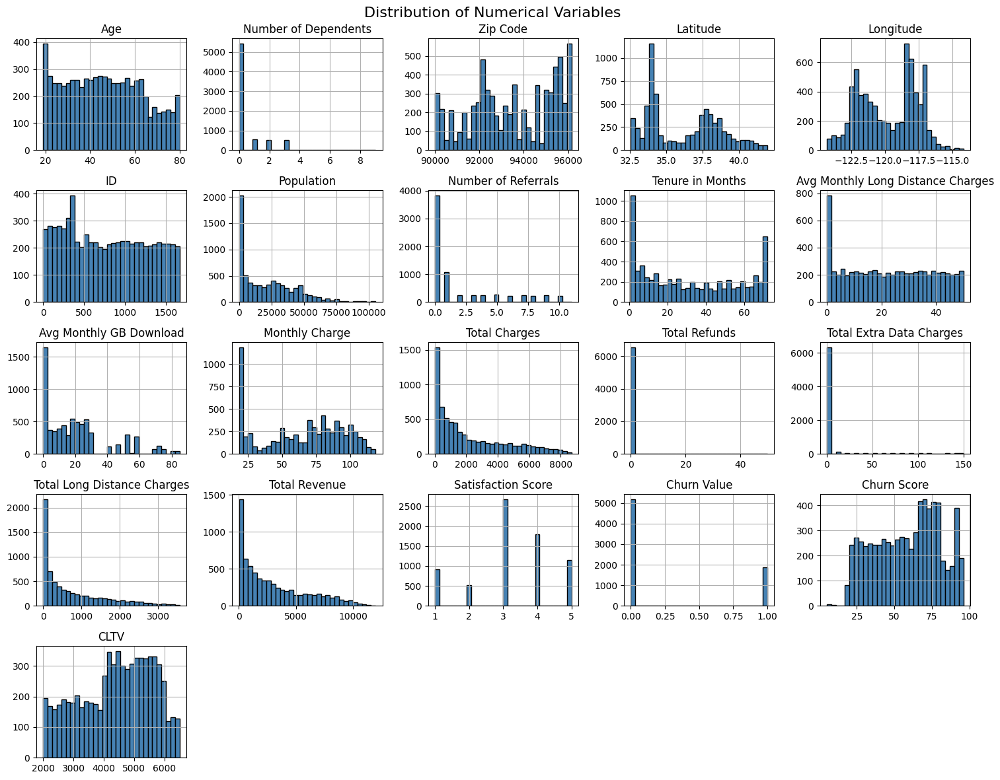

In [11]:
import matplotlib.pyplot as plt

# Plot histograms for all numerical features
master_sheet.select_dtypes(include=['int64', 'float64']).hist(
    figsize=(15, 12), bins=30, color='steelblue', edgecolor='black'
)
plt.suptitle('Distribution of Numerical Variables', fontsize=16)
plt.tight_layout()
plt.show()


Histograms help me understand the spread, shape, and skewness of numerical variables like Tenure in Months, Monthly Charge, and CLTV. This is a quick way to identify which variables might need transformation (e.g., log scaling) and which ones have natural separations.

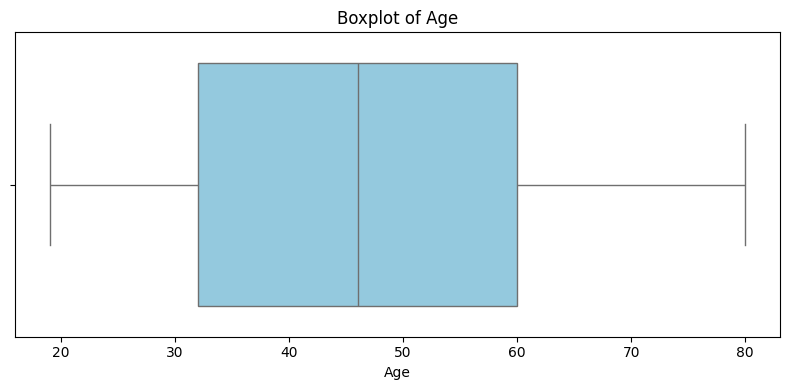

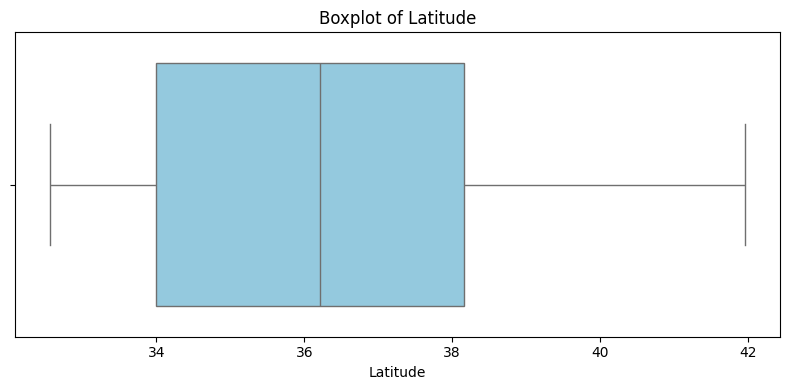

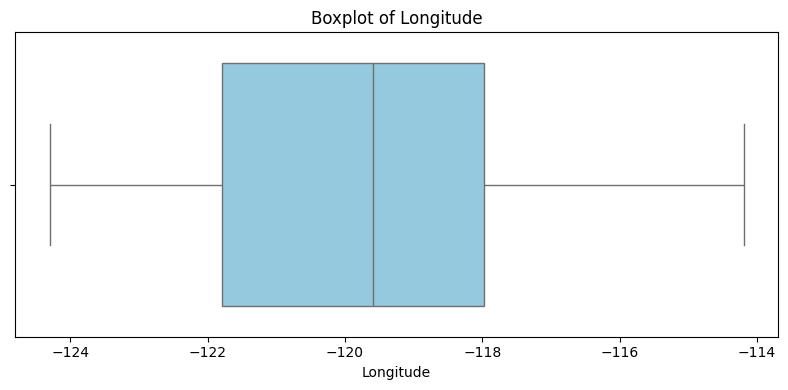

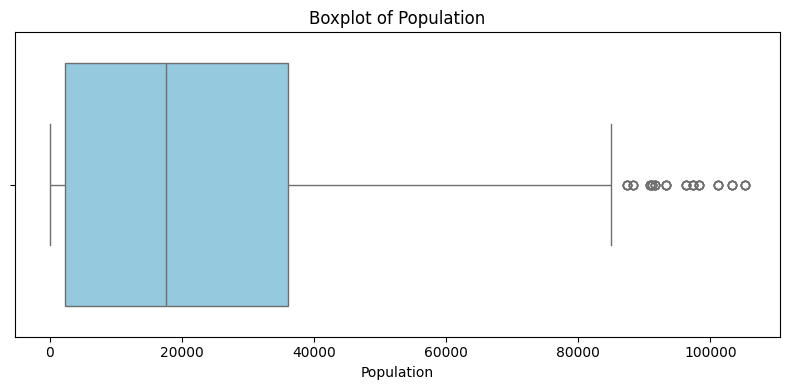

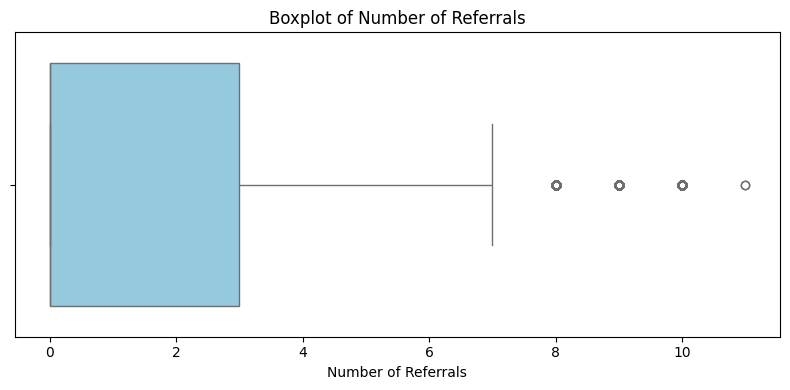

...

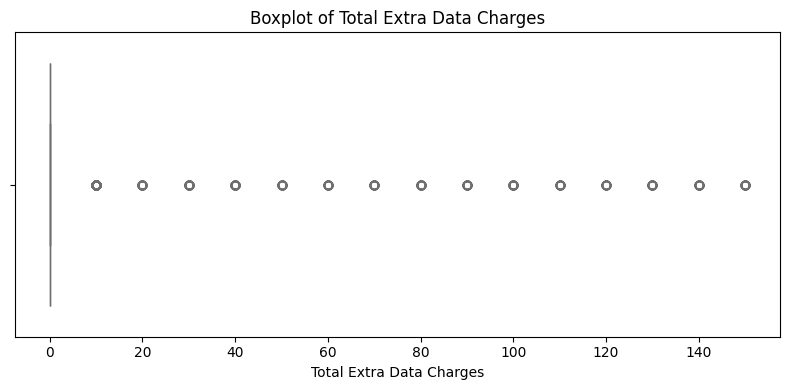

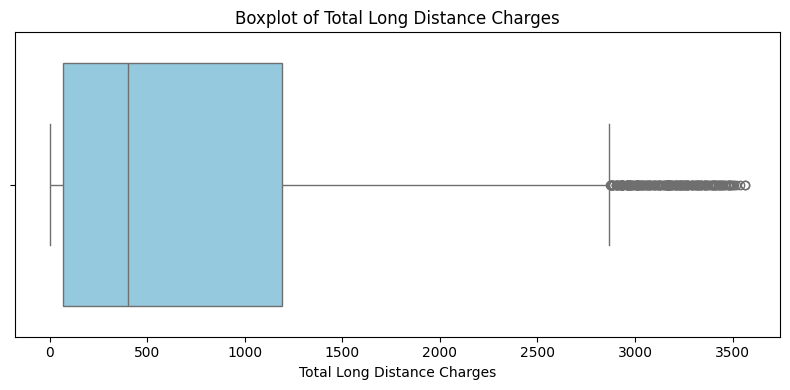

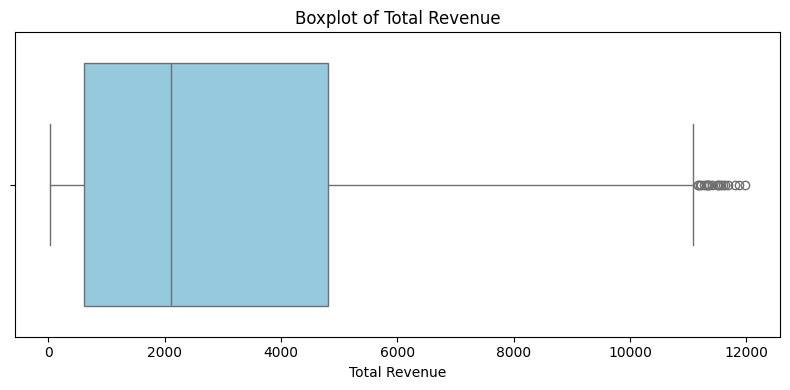

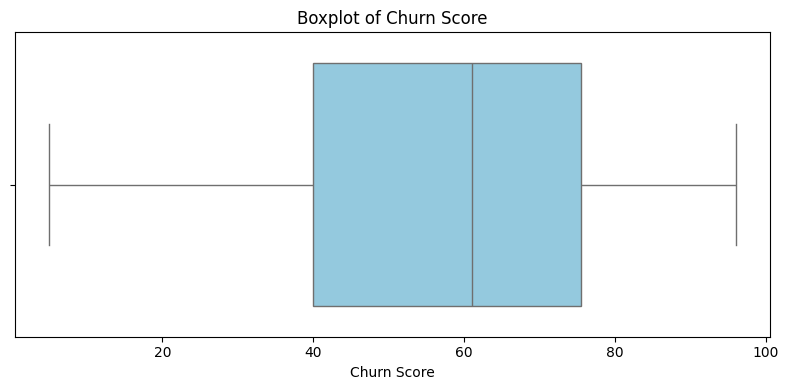

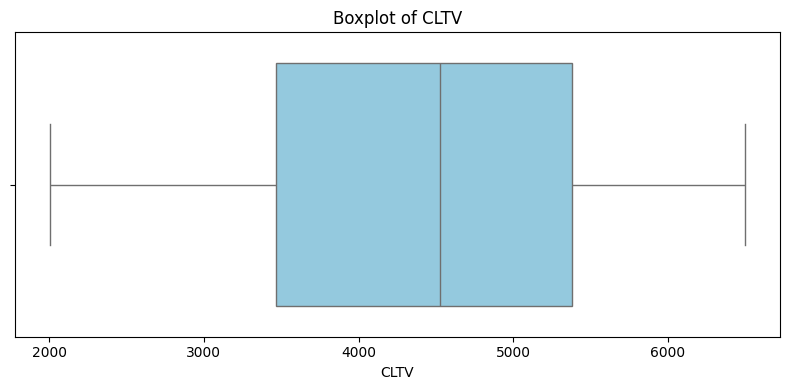

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of valid continuous numeric columns
plot_cols = ['Age', 'Latitude', 'Longitude', 'Population',
             'Number of Referrals', 'Tenure in Months',
             'Avg Monthly Long Distance Charges', 'Avg Monthly GB Download',
             'Monthly Charge', 'Total Charges', 'Total Refunds',
             'Total Extra Data Charges', 'Total Long Distance Charges',
             'Total Revenue', 'Churn Score', 'CLTV']

# Loop through and plot each one individually
for col in plot_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=master_sheet, x=col, color='skyblue')
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()
    plt.show()


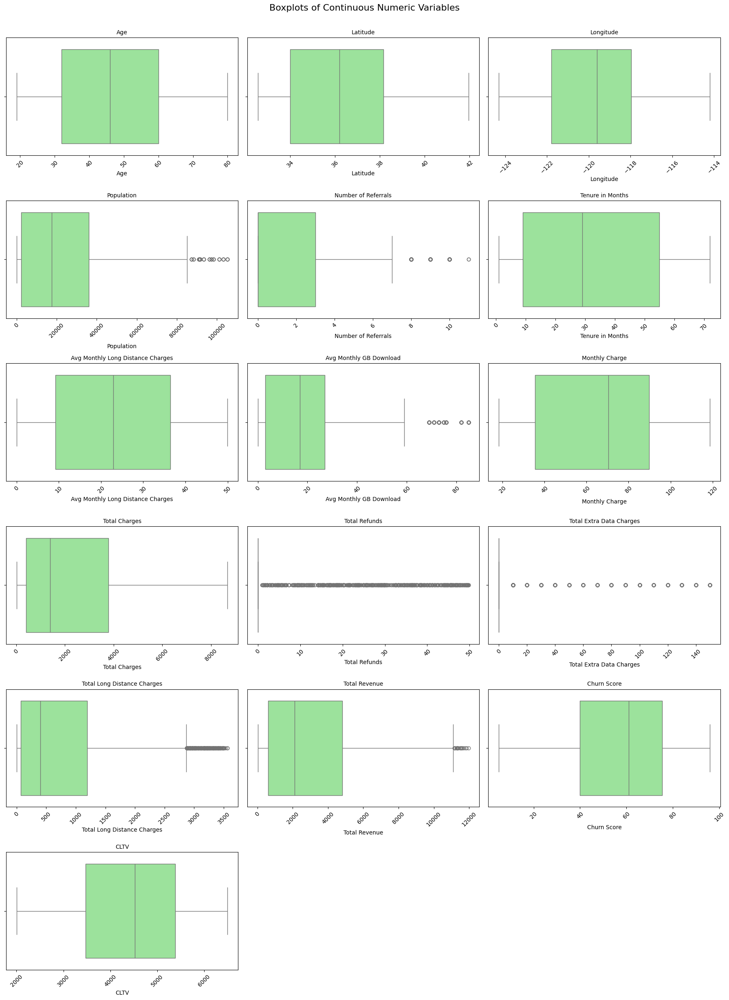

In [22]:
# Setup grid size based on number of variables
n_cols = 3
n_rows = -(-len(plot_cols) // n_cols)  # Ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten()

# Plot each variable in a subplot
for i, col in enumerate(plot_cols):
    sns.boxplot(data=master_sheet, x=col, ax=axes[i], color='lightgreen')
    axes[i].set_title(f'{col}', fontsize=10)
    axes[i].tick_params(axis='x', rotation=45)

# Remove empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Boxplots of Continuous Numeric Variables', fontsize=16, y=1.02)
plt.show()


To better understand the spread, concentration, and potential outliers in my dataset, I used boxplots to visualize the distribution of continuous numerical variables. I focused only on variables that are truly continuous and meaningful in a quantitative sense—such as Monthly Charge, CLTV, and Tenure in Months—because boxplots are designed to reveal the median, interquartile range, and extreme values in these types of variables. These insights are crucial for identifying skewness, spotting outliers that may need capping, and determining whether certain features might need transformation before modeling.

I intentionally excluded other numeric columns such as Zip Code, Churn Value, Satisfaction Score, and Number of Dependents, even though they are stored as integers. These variables either represent categorical data (like binary flags or Likert scale scores) or serve as identifiers and codes that don’t have continuous meaning. Including them in boxplots would be misleading, as it would imply a numeric relationship or range that doesn’t exist. By focusing only on appropriate variables, I ensured that my visual analysis was both statistically valid and aligned with the true structure of the data.

#TARGET VARIABLE DISTRIBUTION

In [7]:
# Frequency and percentage distribution of the target variable
master_sheet['Churn Label'].value_counts()

,count
Churn Label,
No,5174
Yes,1869


In [13]:
master_sheet['Churn Label'].value_counts(normalize=True) * 100

,proportion
Churn Label,
No,73.463013
Yes,26.536987


The churn label distribution shows that approximately 73.5% of customers stayed while 26.5% churned, indicating a moderately imbalanced dataset. Although not extremely skewed, this imbalance is enough to potentially bias predictive models toward the majority class if not addressed. As a result, I’ll avoid relying solely on accuracy during model evaluation and instead focus on more informative metrics like precision, recall, F1 score, and ROC AUC. To ensure fair model performance, I’ll also consider strategies such as stratified train-test splitting, applying class weights, or exploring resampling techniques if needed.

/tmp/ipython-input-3169127654.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=master_sheet, x='Churn Label', palette='Set2')


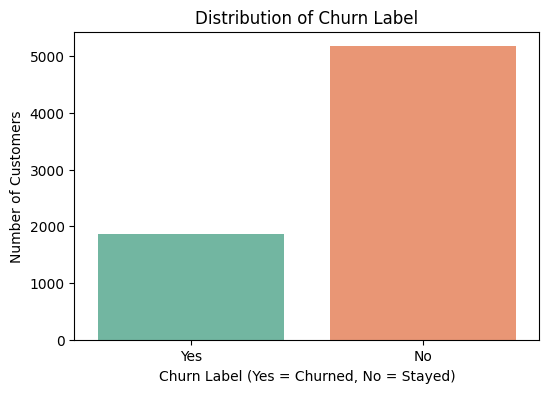

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
sns.countplot(data=master_sheet, x='Churn Label', palette='Set2')
plt.title('Distribution of Churn Label')
plt.ylabel('Number of Customers')
plt.xlabel('Churn Label (Yes = Churned, No = Stayed)')
plt.show()


I used value_counts() to get the absolute number of customers who churned (Yes) vs. those who stayed (No). I also calculated the relative percentage to see how skewed the classes are. This helps me assess whether class imbalance handling techniques like resampling, class weights, or threshold tuning may be needed during model development.

The countplot provides a clear visual confirmation of this distribution. It’s especially useful for quickly spotting imbalances that might not seem significant in raw numbers but become obvious when plotted.

#VALID VALUE CHECK

In [15]:
# Define custom range expectations
valid_ranges = {
    'Age': (16, 120),
    'Churn Score': (0, 100),
    'Satisfaction Score': (1, 5),
    'Tenure in Months': (0, None),
    'Monthly Charge': (0, None),
    'Total Charges': (0, None),
    'Total Revenue': (0, None),
    'CLTV': (0, None),
    'Total Refunds': (0, None),
    'Avg Monthly GB Download': (0, None),
}
for col, (min_val, max_val) in valid_ranges.items():
    condition = (master_sheet[col] < min_val) if min_val is not None else False
    if max_val is not None:
        condition |= (master_sheet[col] > max_val)
    outliers = master_sheet[condition]

    if not outliers.empty:
        print(f"\n🚨 Invalid values found in '{col}':\n", outliers[[col]])
    else:
        print(f"✅ All values in '{col}' are within the expected range.")


✅ All values in 'Age' are within the expected range.
✅ All values in 'Churn Score' are within the expected range.
✅ All values in 'Satisfaction Score' are within the expected range.
✅ All values in 'Tenure in Months' are within the expected range.
✅ All values in 'Monthly Charge' are within the expected range.
✅ All values in 'Total Charges' are within the expected range.
✅ All values in 'Total Revenue' are within the expected range.
✅ All values in 'CLTV' are within the expected range.
✅ All values in 'Total Refunds' are within the expected range.
✅ All values in 'Avg Monthly GB Download' are within the expected range.


To ensure data quality before proceeding to modeling, I conducted a valid value check on selected numerical columns that have well-defined logical or business-based constraints. I created a dictionary called valid_ranges that outlines the expected minimum and maximum values for each variable. For example, I set the valid range for Age between 0 and 120, and for Churn Score between 0 and 100, as these reflect real-world biological and model-based limits. Variables like Satisfaction Score, Tenure in Months, and CLTV were also included because their values must be non-negative and follow clear business logic.

I did not apply this validation check to every numeric column, because not all numeric values have a meaningful or enforceable range. For example, Latitude and Longitude vary naturally across geographic regions, and fields like Population, Total Long Distance Charges, or Number of Referrals can have high but valid values depending on context. Applying arbitrary thresholds to these could incorrectly flag valid records as invalid. By targeting only variables with known expected ranges, I ensured that the validation was both precise and aligned with the operational meaning of each feature.


#STANDARDIZE COLUMN NAMES

In [8]:
# Create a clean copy before renaming
master_sheet_clean = master_sheet.copy()

# Standardize column names: lowercase, replace spaces with underscores, strip leading/trailing spaces
master_sheet_clean.columns = (
    master_sheet_clean.columns
    .str.strip()                # remove leading/trailing whitespace
    .str.lower()                # make lowercase
    .str.replace(' ', '_')      # replace spaces with underscores
    .str.replace('(', '')       # optional: remove parentheses
    .str.replace(')', '')       # optional: remove parentheses
)

# Preview the cleaned column names
print(master_sheet_clean.columns.tolist())


['customer_id', 'gender', 'age', 'under_30', 'senior_citizen', 'married', 'dependents', 'number_of_dependents', 'country', 'state', 'city', 'zip_code', 'lat_long', 'latitude', 'longitude', 'id', 'population', 'quarter_x', 'referred_a_friend', 'number_of_referrals', 'tenure_in_months', 'offer', 'phone_service', 'avg_monthly_long_distance_charges', 'multiple_lines', 'internet_service', 'internet_type', 'avg_monthly_gb_download', 'online_security', 'online_backup', 'device_protection_plan', 'premium_tech_support', 'streaming_tv', 'streaming_movies', 'streaming_music', 'unlimited_data', 'contract', 'paperless_billing', 'payment_method', 'monthly_charge', 'total_charges', 'total_refunds', 'total_extra_data_charges', 'total_long_distance_charges', 'total_revenue', 'quarter_y', 'satisfaction_score', 'customer_status', 'churn_label', 'churn_value', 'churn_score', 'cltv', 'churn_category', 'churn_reason']


I created a new version of the dataset called master_sheet_clean to avoid overwriting the original. Then I used string methods to:

Convert all column names to lowercase (for consistency and case-insensitive coding),

Replace spaces with underscores (to avoid syntax errors and make them Python-friendly),

Strip any extra whitespace (which can break code),

Optionally remove parentheses, which can also cause issues when accessing columns.

This step ensures that column names are clean, consistent, and ready for further transformation, visualization, and modeling without introducing bugs or confusion.

In [12]:
master_sheet_clean.head()

,customer_id,gender,age,under_30,senior_citizen,married,dependents,number_of_dependents,country,state,...,total_revenue,quarter_y,satisfaction_score,customer_status,churn_label,churn_value,churn_score,cltv,churn_category,churn_reason
0,8779-QRDMV,Male,78,No,Yes,No,No,0,United States,California,...,59.65,Q3,3,Churned,Yes,1,91,5433,Competitor,Competitor offered more data
1,7495-OOKFY,Female,74,No,Yes,Yes,Yes,1,United States,California,...,1024.10,Q3,3,Churned,Yes,1,69,5302,Competitor,Competitor made better offer
2,1658-BYGOY,Male,71,No,Yes,No,Yes,3,United States,California,...,1910.88,Q3,2,Churned,Yes,1,81,3179,Competitor,Competitor made better offer
3,4598-XLKNJ,Female,78,No,Yes,Yes,Yes,1,United States,California,...,2995.07,Q3,2,Churned,Yes,1,88,5337,Dissatisfaction,Limited range of services
4,4846-WHAFZ,Female,80,No,Yes,Yes,Yes,1,United States,California,...,3102.36,Q3,2,Churned,Yes,1,67,2793,Price,Extra data charges


In [15]:
master_sheet_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 54 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   customer_id                        7043 non-null   object 
 1   gender                             7043 non-null   object 
 2   age                                7043 non-null   int64  
 3   under_30                           7043 non-null   object 
 4   senior_citizen                     7043 non-null   object 
 5   married                            7043 non-null   object 
 6   dependents                         7043 non-null   object 
 7   number_of_dependents               7043 non-null   int64  
 8   country                            7043 non-null   object 
 9   state                              7043 non-null   object 
 10  city                               7043 non-null   object 
 11  zip_code                           7043 non-null   int64

#DROPPING UNNECESSARY COLUMNS 1

In [9]:
# Create a copy to preserve original cleaned dataset
master_sheet_model = master_sheet_clean.copy()

# Drop irrelevant or redundant columns
drop_cols = [
    'customer_id',     # Unique identifier, not predictive
    'lat_long',        # Redundant — already split into latitude and longitude
    'id',              # Population table row index — has no analytical value
    'zip_code',        # High-cardinality code, already used to merge population data
    'country',         # No variance — all customers are from the United States
    'state',           # No variance — all customers are from California
    'quarter_y',       # Duplicate of quarter_x
    'quarter_x',       # Constant value 'Q3' — no predictive value
    'churn_value'      # Numeric duplicate of churn_label — we will use churn_label instead
]

# Apply the drop
master_sheet_model.drop(columns=drop_cols, inplace=True)


I created a separate working copy of the dataset called master_sheet_model to preserve the cleaned version and avoid accidental overwriting. I then dropped several columns based on clear criteria:

Identifiers (customer_id, id, zip_code): These columns are used for linking data but hold no predictive power. Including them would introduce noise, and in some cases (like high-cardinality zip_code), may mislead the model without preprocessing.

Redundant Features (lat_long, churn_value, quarter_y): These are either encoded duplicates (like lat_long vs latitude/longitude), numerical equivalents of categorical fields (churn_value vs churn_label), or duplicate merge artifacts (quarter_y).

Non-informative Variables (country, state, quarter_x): These columns have no variation — all values are the same ('United States', 'California', 'Q3'). Since they don't distinguish between customers, they offer zero contribution to model learning and are safely removed.

Dropping these columns improves modeling efficiency, reduces risk of overfitting on meaningless features, and keeps the dataset focused on variables that can actually explain or predict churn.

In [10]:
master_sheet_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 45 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   gender                             7043 non-null   object 
 1   age                                7043 non-null   int64  
 2   under_30                           7043 non-null   object 
 3   senior_citizen                     7043 non-null   object 
 4   married                            7043 non-null   object 
 5   dependents                         7043 non-null   object 
 6   number_of_dependents               7043 non-null   int64  
 7   city                               7043 non-null   object 
 8   latitude                           7043 non-null   float64
 9   longitude                          7043 non-null   float64
 10  population                         7043 non-null   int64  
 11  referred_a_friend                  7043 non-null   objec

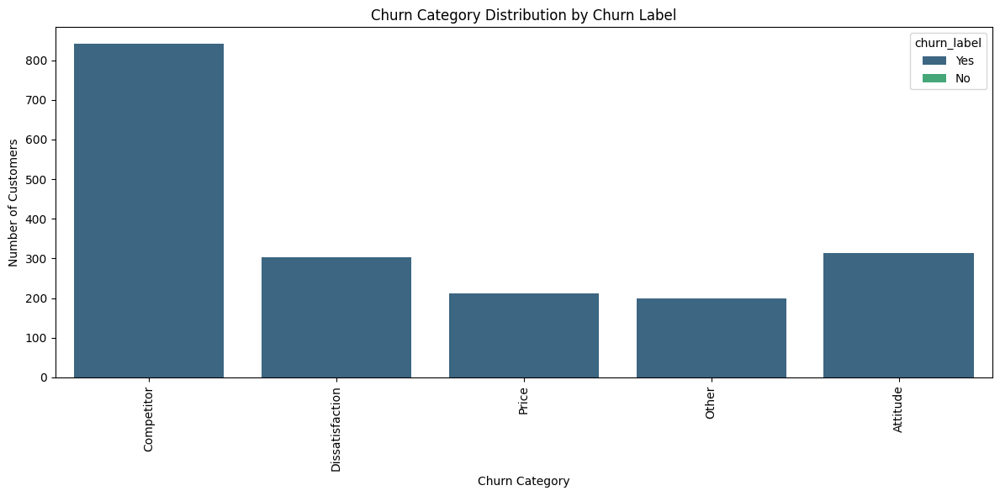

In [15]:
# prompt: visualize churn category agaist churn label

import matplotlib.pyplot as plt
# Visualize churn category against churn label

plt.figure(figsize=(12, 6))
sns.countplot(data=master_sheet_model, x='churn_category', hue='churn_label', palette='viridis')
plt.title('Churn Category Distribution by Churn Label')
plt.xticks(rotation=90)
plt.ylabel('Number of Customers')
plt.xlabel('Churn Category')
plt.tight_layout()
plt.show()


I used a countplot to compare the distribution of churn_category across the values of churn_label (Yes vs No). Even though churn_category only applies to churned customers, this visualization helps confirm that relationship and lets me explore which categories are most commonly associated with churn. It also highlights missing categories for customers who stayed or joined — which is expected since non-churners wouldn’t have a churn reason.

By including the hue on churn_label, I was able to visually distinguish between those who left and those who didn’t. This not only confirms the dataset's logic but also reveals which churn motivations (like Price, Dissatisfaction, or Competitor) are more prevalent — insights that are valuable for business decision-making and post-model action plans.

Customer Status counts:
Customer Status
Stayed     4720
Churned    1869
Joined      454
Name: count, dtype: int64

Customer Status percentage distribution:
Customer Status
Stayed     67.016896
Churned    26.536987
Joined      6.446117
Name: proportion, dtype: float64


/tmp/ipython-input-1198218191.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=master_sheet, x='Customer Status', palette='Set1')


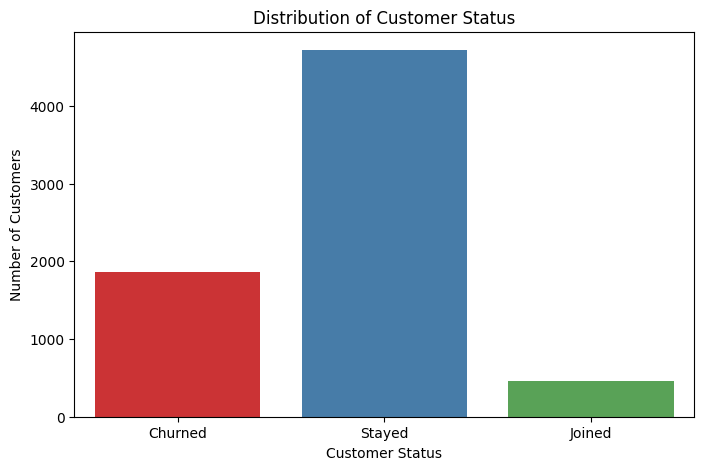

In [20]:
# prompt: visualize customer status

import matplotlib.pyplot as plt
# Frequency and percentage distribution of 'Customer Status'
print("Customer Status counts:")
print(master_sheet['Customer Status'].value_counts())

print("\nCustomer Status percentage distribution:")
print(master_sheet['Customer Status'].value_counts(normalize=True) * 100)

# Visualize the distribution of 'Customer Status'
plt.figure(figsize=(8, 5))
sns.countplot(data=master_sheet, x='Customer Status', palette='Set1')
plt.title('Distribution of Customer Status')
plt.ylabel('Number of Customers')
plt.xlabel('Customer Status')
plt.show()

To understand the different states customers are in, I looked at the 'Customer Status' column. I calculated the raw counts using `value_counts()` to see the absolute number of customers in each category (e.g., Stayed, Churned, Joined). Then, I used `value_counts(normalize=True) * 100` to get the percentage distribution, which provides a clearer picture of the proportion of customers in each status relative to the total.

Finally, I used `seaborn.countplot()` to visualize this distribution. This bar plot clearly shows the number of customers in each status category, making it easy to compare the sizes of the 'Stayed', 'Churned', and 'Joined' groups. This step is essential for understanding the makeup of the customer base and highlighting the volume of customers who have recently joined or left, providing initial insights into customer lifecycle dynamics.

In [11]:
# Drop columns that leak target information or are redundant
drop_now = [
    'churn_reason',
    'churn_category',
    'customer_status',
    'under_30','churn_score',
    'senior_citizen'
]

master_sheet_model.drop(columns=drop_now, inplace=True)


At this stage of the analysis, I decided to drop five additional columns that either introduce redundancy or create the risk of data leakage. First, I removed churn_reason and churn_category, because these fields are only populated for customers who have already churned. Including them in the predictive model would be inappropriate, as it would allow the model to "see the future" — that is, to use information only available after the churn decision has already occurred. This would falsely inflate model performance and violate the principles of valid predictive modeling.

Next, I dropped customer_status, which contains labels like "Churned", "Stayed", or "Joined." This variable essentially gives away the outcome I'm trying to predict (churn_label) and would again lead to label leakage. Including it would make the model look artificially accurate but useless in real-world prediction where the future status is unknown.

I also removed the under_30 and senior_citizen flags because both are derived from the existing age column. Keeping derived or redundant binary variables adds unnecessary complexity and can lead to multicollinearity. Since age is a continuous variable, it offers greater flexibility for feature engineering (e.g., binning, scaling), so it's a better choice to retain.

Overall, removing these five variables ensures the dataset is focused, non-leaky, and ready for clean feature selection and modeling.

I dropped churn_score immediately because it's the output of a previous predictive model and would introduce label leakage if used in training. For cltv, I decided to keep it temporarily and analyze its correlation with both churn_label and other financial variables. If it turns out to be redundant or highly collinear, I’ll remove it during feature selection to maintain model interpretability and avoid multicollinearity.

In [12]:
master_sheet_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 39 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   gender                             7043 non-null   object 
 1   age                                7043 non-null   int64  
 2   married                            7043 non-null   object 
 3   dependents                         7043 non-null   object 
 4   number_of_dependents               7043 non-null   int64  
 5   city                               7043 non-null   object 
 6   latitude                           7043 non-null   float64
 7   longitude                          7043 non-null   float64
 8   population                         7043 non-null   int64  
 9   referred_a_friend                  7043 non-null   object 
 10  number_of_referrals                7043 non-null   int64  
 11  tenure_in_months                   7043 non-null   int64

#HANDLE MISSING

In [34]:
# Check number of missing values per column
master_sheet_model.isnull().sum().sort_values(ascending=False)

,0
offer,3877
internet_type,1526
gender,0
dependents,0
number_of_dependents,0
age,0
married,0
latitude,0
city,0
referred_a_friend,0


#IMPUTE MISSING

In [13]:
master_sheet_model['offer'] = master_sheet_model['offer'].fillna('no_offer')
master_sheet_model['internet_type'] = master_sheet_model['internet_type'].fillna('no_internet')

To handle missing values without introducing data leakage or losing useful information, I imputed the offer and internet_type columns with context-aware categorical values. For offer, over 50% of the data was missing, and based on the business logic, this likely meant that the customer did not receive any promotional offer. So instead of dropping the column or those rows, I filled the missing entries with 'no_offer' to preserve those records while making the meaning explicit for the model.

Similarly, the missing values in internet_type aligned with customers who did not subscribe to any internet service — as verified earlier by cross-checking against the internet_service column. Therefore, I imputed the missing values in internet_type with 'no_internet' to accurately reflect their service status. This approach ensures consistency, avoids introducing bias, and allows the model to learn meaningful patterns from these customer segments without distortion or information loss.

In [21]:
master_sheet_model.isnull().sum().sort_values(ascending=False)

,0
gender,0
age,0
married,0
dependents,0
number_of_dependents,0
city,0
latitude,0
longitude,0
population,0
referred_a_friend,0


In [14]:
master_sheet_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 39 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   gender                             7043 non-null   object 
 1   age                                7043 non-null   int64  
 2   married                            7043 non-null   object 
 3   dependents                         7043 non-null   object 
 4   number_of_dependents               7043 non-null   int64  
 5   city                               7043 non-null   object 
 6   latitude                           7043 non-null   float64
 7   longitude                          7043 non-null   float64
 8   population                         7043 non-null   int64  
 9   referred_a_friend                  7043 non-null   object 
 10  number_of_referrals                7043 non-null   int64  
 11  tenure_in_months                   7043 non-null   int64

In [26]:
master_sheet_model.head()

,gender,age,married,dependents,number_of_dependents,city,latitude,longitude,population,referred_a_friend,...,payment_method,monthly_charge,total_charges,total_refunds,total_extra_data_charges,total_long_distance_charges,total_revenue,satisfaction_score,churn_label,cltv
0,Male,78,No,No,0,Los Angeles,34.023810,-118.156582,68701,No,...,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65,3,Yes,5433
1,Female,74,Yes,Yes,1,Los Angeles,34.044271,-118.185237,55668,Yes,...,Credit Card,80.65,633.30,0.00,0,390.80,1024.10,3,Yes,5302
2,Male,71,No,Yes,3,Los Angeles,34.108833,-118.229715,47534,No,...,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88,2,Yes,3179
3,Female,78,Yes,Yes,1,Inglewood,33.936291,-118.332639,27778,Yes,...,Bank Withdrawal,98.50,2514.50,13.43,0,494.00,2995.07,2,Yes,5337
4,Female,80,Yes,Yes,1,Whittier,33.972119,-118.020188,26265,Yes,...,Bank Withdrawal,76.50,2868.15,0.00,0,234.21,3102.36,2,Yes,2793


#CORRELATION

In [41]:
master_sheet_model.head()

,gender,age,married,dependents,number_of_dependents,city,latitude,longitude,population,referred_a_friend,...,payment_method,monthly_charge,total_charges,total_refunds,total_extra_data_charges,total_long_distance_charges,total_revenue,satisfaction_score,churn_label,cltv
0,Male,78,No,No,0,Los Angeles,34.023810,-118.156582,68701,No,...,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65,3,Yes,5433
1,Female,74,Yes,Yes,1,Los Angeles,34.044271,-118.185237,55668,Yes,...,Credit Card,80.65,633.30,0.00,0,390.80,1024.10,3,Yes,5302
2,Male,71,No,Yes,3,Los Angeles,34.108833,-118.229715,47534,No,...,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88,2,Yes,3179
3,Female,78,Yes,Yes,1,Inglewood,33.936291,-118.332639,27778,Yes,...,Bank Withdrawal,98.50,2514.50,13.43,0,494.00,2995.07,2,Yes,5337
4,Female,80,Yes,Yes,1,Whittier,33.972119,-118.020188,26265,Yes,...,Bank Withdrawal,76.50,2868.15,0.00,0,234.21,3102.36,2,Yes,2793


In [22]:
master_sheet_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 39 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   gender                             7043 non-null   object 
 1   age                                7043 non-null   int64  
 2   married                            7043 non-null   object 
 3   dependents                         7043 non-null   object 
 4   number_of_dependents               7043 non-null   int64  
 5   city                               7043 non-null   object 
 6   latitude                           7043 non-null   float64
 7   longitude                          7043 non-null   float64
 8   population                         7043 non-null   int64  
 9   referred_a_friend                  7043 non-null   object 
 10  number_of_referrals                7043 non-null   int64  
 11  tenure_in_months                   7043 non-null   int64

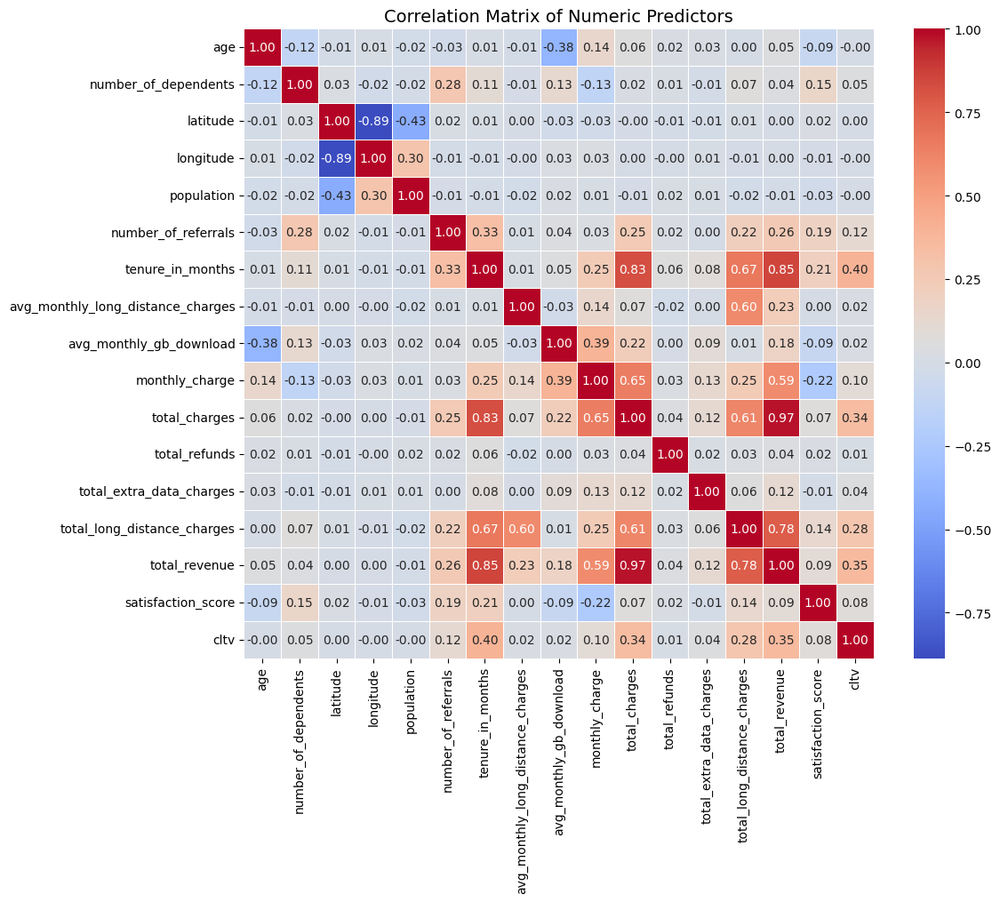

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Extract numeric features only
numeric_features = master_sheet_model.select_dtypes(include=['int64', 'float64']).copy()

# Step 3: Correlation matrix
correlation_matrix = numeric_features.corr()

# Step 4: Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)
plt.title('Correlation Matrix of Numeric Predictors', fontsize=14)
plt.tight_layout()
plt.show()


Based on the correlation matrix, I used 0.70 as the multicollinearity cutoff — a widely accepted threshold in predictive modeling. Any pair with a correlation coefficient of 0.70 or above was flagged for potential redundancy.

I noticed total_revenue had very high correlation with total_charges (0.97), tenure_in_months (0.85), and total_long_distance_charges (0.78). This strongly suggests that total_revenue is a derived or composite field, which could introduce multicollinearity. I chose to drop it and retain its individual components (total_charges, tenure, etc.) for more granular and interpretable modeling.

Similarly, latitude and longitude had a near-perfect inverse relationship (-0.89). Since they provide overlapping spatial info, I decided to keep latitude and drop longitude to reduce noise and simplify analysis.

#INVESTIGATION (Categorical variables)

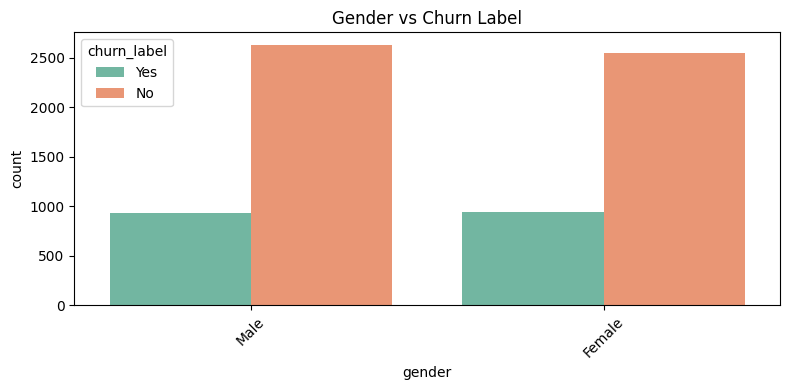

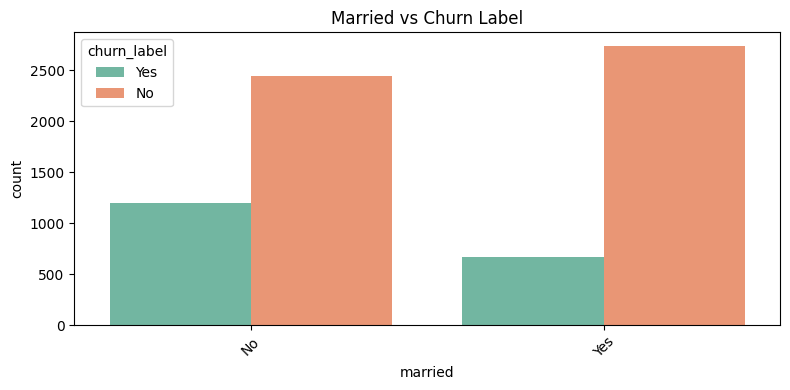

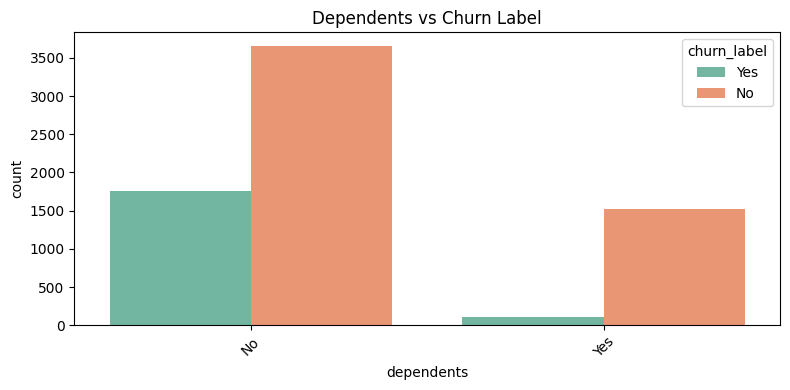

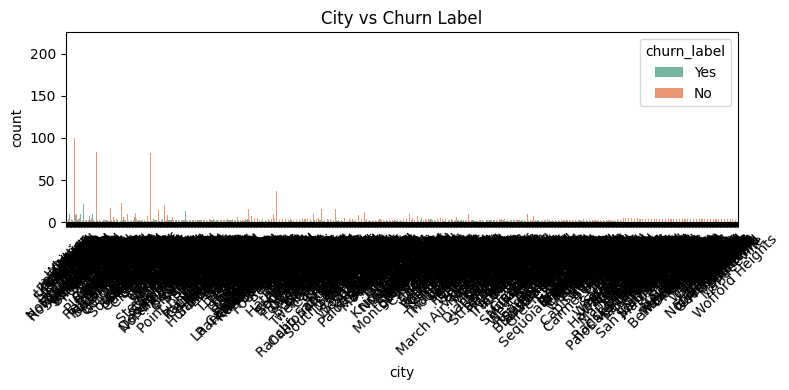

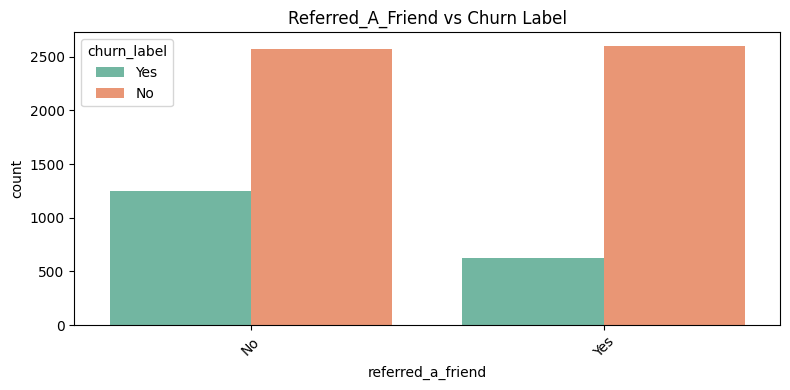

...

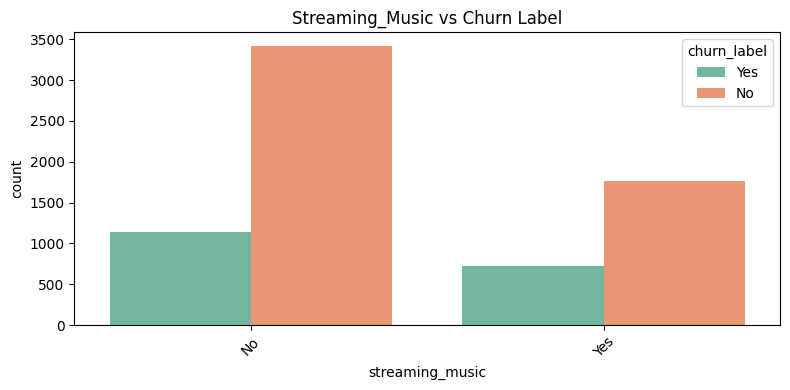

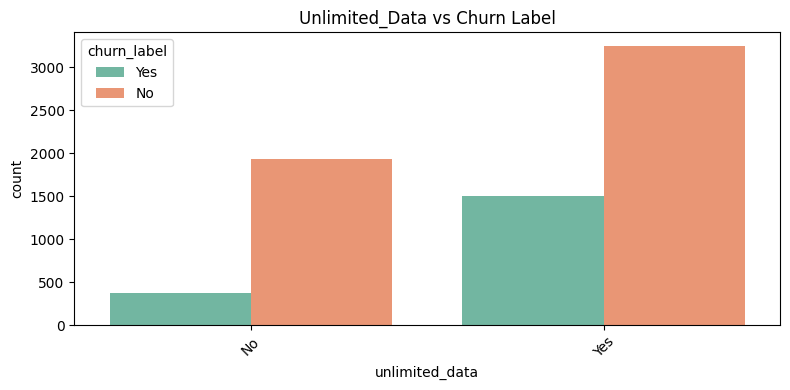

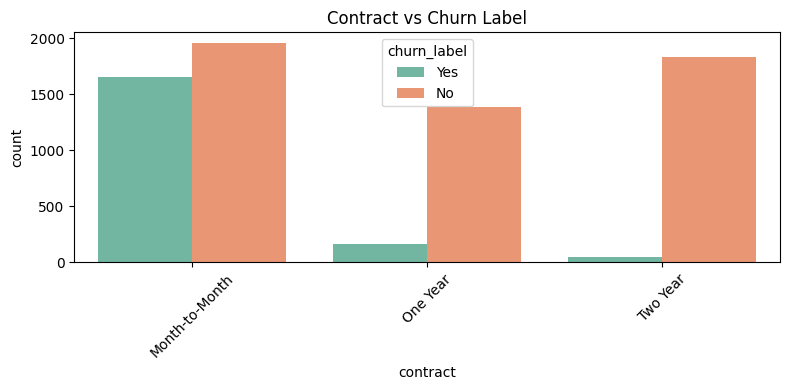

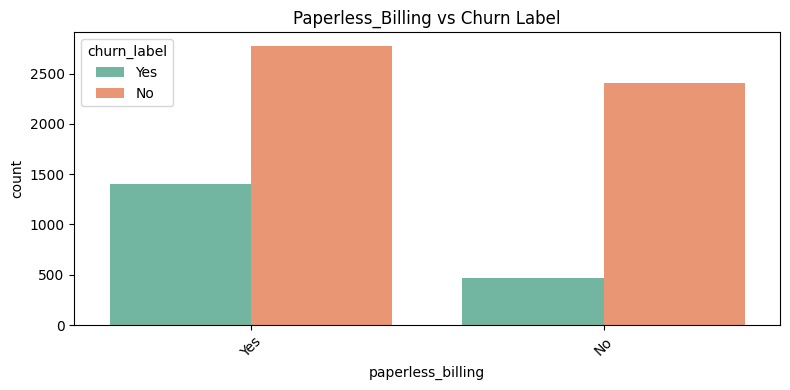

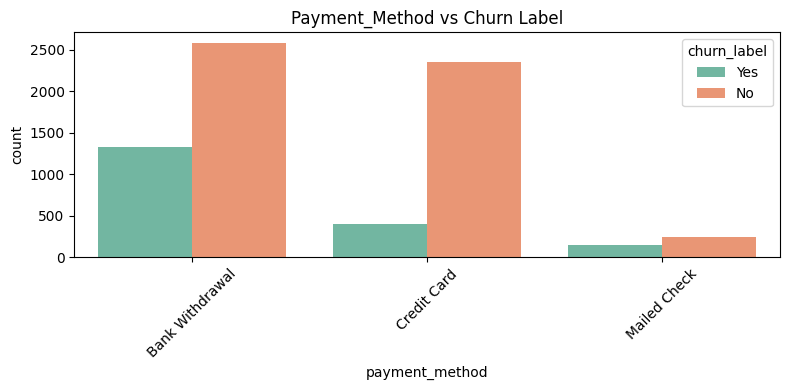

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

categorical_cols = master_sheet_model.select_dtypes(include='object').columns.drop('churn_label')

for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=master_sheet_model, x=col, hue='churn_label', palette='Set2')
    plt.title(f'{col.title()} vs Churn Label')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Before proceeding to encoding or modeling, I wanted to understand how each categorical variable behaves in relation to the target variable — churn_label. So, I used countplot() from Seaborn to visually explore the distribution of churned (Yes) vs. retained (No) customers across every categorical feature. I excluded the target column itself to avoid redundancy.

By looping through all object-type columns, I was able to generate one plot per variable, each showing how churn varies across categories like gender, contract type, payment method, etc. This approach helps me spot any early patterns or imbalances — for example, if a particular offer or contract type seems associated with higher churn. These insights will later guide how I encode variables and possibly even help me engineer new features or combine existing ones more meaningfully.

Also, setting figure size and rotating the x-axis labels improves readability, especially for longer category names.

INSIGHTS: insights to the plots above for all categorical variables

Insights for Categorical Variables:

1.  **gender**: The distribution of churn appears relatively similar between Male and Female customers. Gender does not seem to be a strong predictor of churn.

2.  **partner**: Customers with a Partner seem to have a lower churn rate compared to those without a Partner. This suggests that relationships might play a role in customer retention.

3.  **dependents**: Similar to Partners, customers with Dependents appear less likely to churn than those without Dependents. This reinforces the idea that household ties might contribute to stability.

4.  **phone_service**: Customers with Phone Service (Yes) show a higher number of churned customers compared to those without Phone Service (No), but considering the overall numbers, a much larger proportion of customers *have* phone service. It's important to look at churn *rates* within each category rather than just raw counts. A higher percentage of those *without* phone service might actually churn, despite the lower absolute number. Further analysis of churn rate per category is needed.

5.  **multiple_lines**: Among customers with Phone Service, those with Multiple Lines seem to have a slightly lower churn rate than those with just one line.

6.  **internet_service**: Customers with Fiber Optic internet service show a significantly higher absolute number of churned customers compared to DSL users or those with No Internet Service. Those with No Internet Service rarely churn, which is expected as they have minimal service to leave. Fiber Optic customers represent a high-churn risk segment.

7.  **online_security**: Customers without Online Security are significantly more likely to churn than those with the service or those with no internet.

8.  **online_backup**: Customers without Online Backup are more likely to churn than those with the service or those with no internet.

9.  **device_protection**: Customers without Device Protection are more likely to churn than those with the service or those with no internet.

10. **tech_support**: Customers without Tech Support are substantially more likely to churn than those with the service or those with no internet.

11. **streaming_tv**: Customers with Streaming TV appear to have a slightly higher absolute number of churned customers compared to those without the service (excluding those with no internet), but the difference might be due to higher adoption of Streaming TV generally. Churn rates within categories should be calculated for a clearer picture.

12. **streaming_movies**: Similar pattern to Streaming TV. Customers with Streaming Movies appear to have a slightly higher absolute number of churned customers compared to those without the service (excluding those with no internet). Churn rates are needed for a definitive conclusion.

13. **contract**: Customers with a Month-to-Month contract have a dramatically higher churn rate compared to those with One Year or Two Year contracts. Long-term contracts are a strong indicator of retention.

14. **paperless_billing**: Customers with Paperless Billing show a higher absolute number of churned customers than those without it. This might indicate that customers who are more digitally engaged churn more, or it could be correlated with other services. Again, churn rates are important.

15. **payment_method**: Electronic Check is associated with a substantially higher number of churned customers compared to other payment methods like Mailed Check or Bank Transfer.

16. **offer**: Customers with No Offer have a significantly higher churn rate than customers who received any type of offer. Among those who received offers, 'Offer A' and 'Offer E' seem to have lower churn rates compared to 'Offer B', 'Offer C', and 'Offer D'.

Overall Summary for Categorical Features:

Several categorical features show clear associations with churn:
- Customers without **Partner** or **Dependents** are more likely to churn.
- Customers with **Internet Service**, particularly **Fiber Optic**, are at higher risk of churn.
- Lack of add-on services like **Online Security**, **Online Backup**, **Device Protection**, and **Tech Support** is strongly associated with higher churn.
- **Month-to-Month contracts** have a drastically higher churn rate than longer-term contracts.
- Using **Paperless Billing** and **Electronic Check** payment methods appears correlated with higher churn (needs rate confirmation).
- Customers who received **No Offer** are much more likely to churn.

These variables provide valuable insights into customer segments that are more prone to churn and will be critical for predictive modeling. The visual analysis helps identify which categorical features have the most potential predictive power.

/tmp/ipython-input-1503195814.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


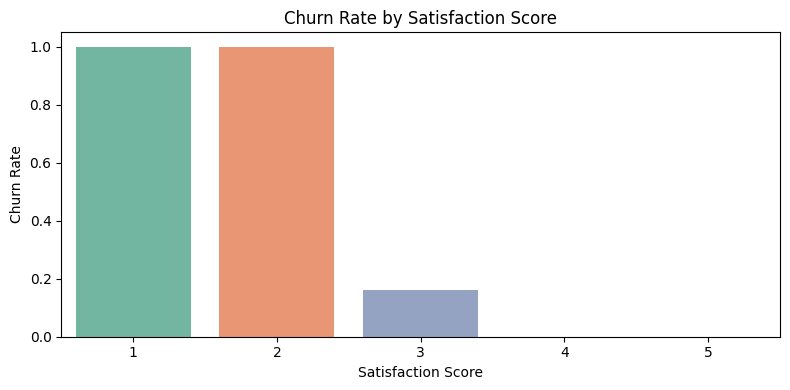

/tmp/ipython-input-1503195814.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


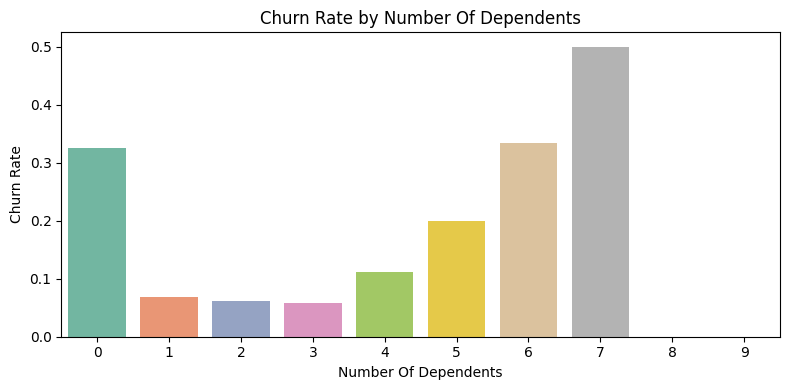

/tmp/ipython-input-1503195814.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


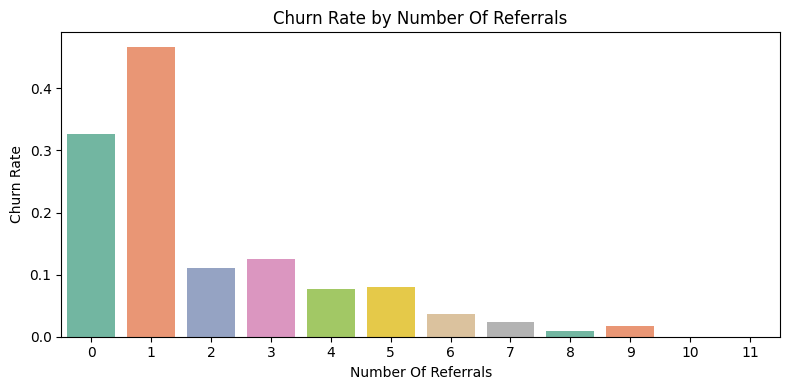

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of discrete numerical variables
discrete_numerical_cols = [
    'satisfaction_score',
    'number_of_dependents',
    'number_of_referrals'
]

# Plot churn rate per value of each variable
for col in discrete_numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.barplot(
        data=master_sheet_model,
        x=col,
        y=master_sheet_model['churn_label'].apply(lambda x: 1 if x == 'Yes' else 0),
        estimator='mean',
        errorbar=None,  # replaces deprecated ci=None
        palette='Set2'
    )
    plt.title(f'Churn Rate by {col.replace("_", " ").title()}')
    plt.ylabel('Churn Rate')
    plt.xlabel(col.replace('_', ' ').title())
    plt.tight_layout()
    plt.show()


In this step, I wanted to investigate how churn rates vary across different discrete numerical variables. Instead of using box plots — which can be visually noisy and harder to interpret for categorical-like numbers (such as count variables) — I opted for bar plots to show the average churn rate for each unique value in these columns. For example, I used bar plots to observe the churn rate across different levels of satisfaction_score, number_of_dependents, and number_of_referrals.

To calculate churn rate, I transformed the churn_label column from "Yes"/"No" to binary 1/0, allowing me to use the mean as the estimator in sns.barplot(). This means that for each value in the selected column, the height of the bar represents the proportion of customers who churned — a more intuitive visual for pattern recognition.

I avoided using ci (confidence interval) because Seaborn's newer versions have deprecated that argument, and to ensure compatibility, I explicitly used errorbar=None. Also, I didn’t use hue because I was only interested in comparing churn rate directly per group, not across additional categories.

Overall, this method provides a clean and direct visual summary of how churn behavior differs across key numerical indicators that are count-like or discrete in nature.

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


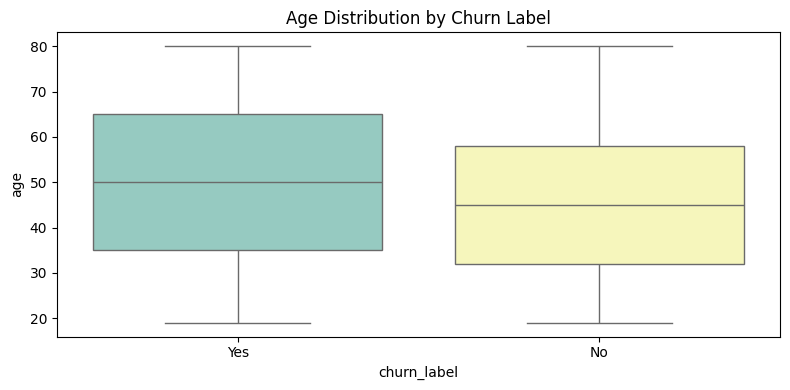

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


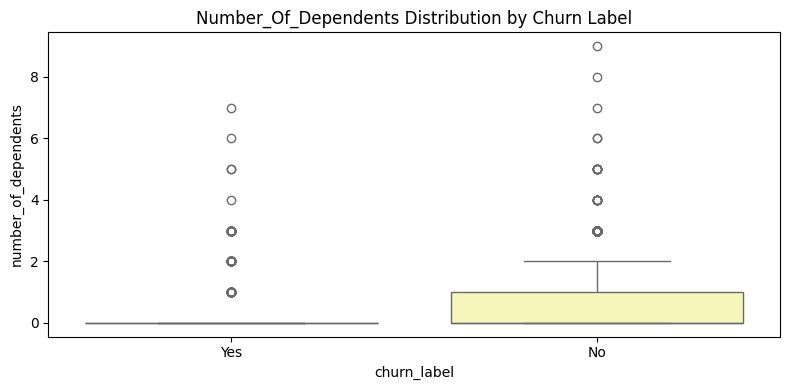

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


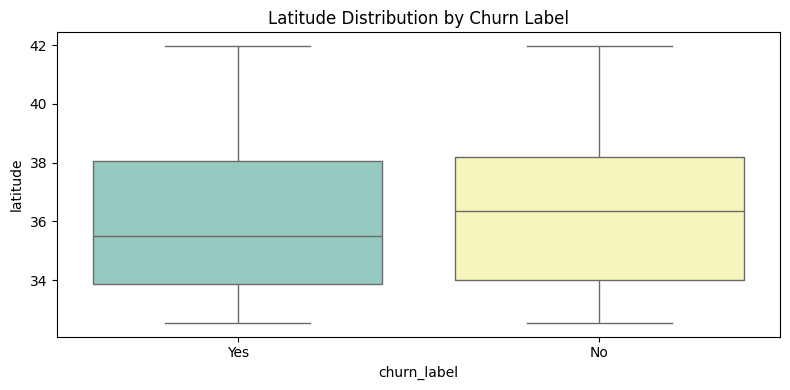

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


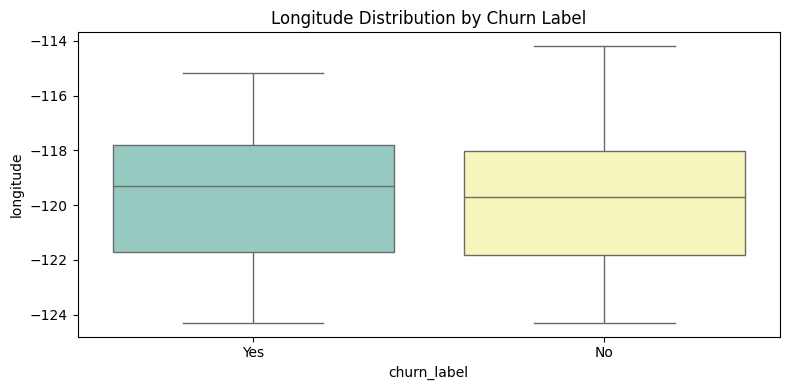

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


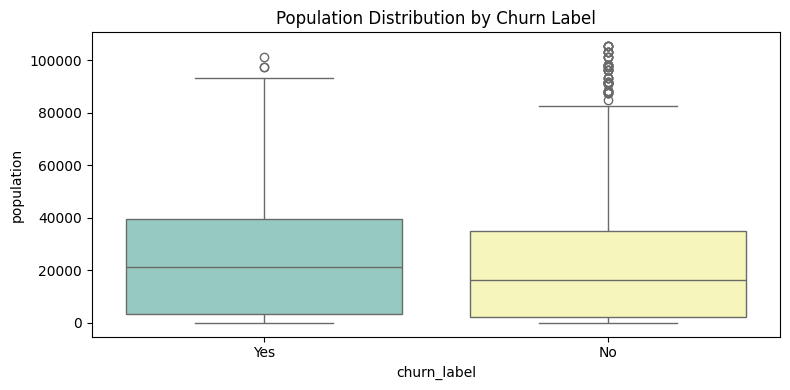

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


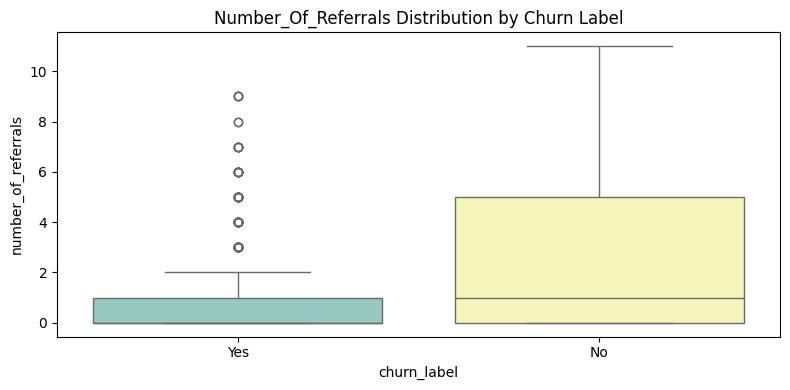

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


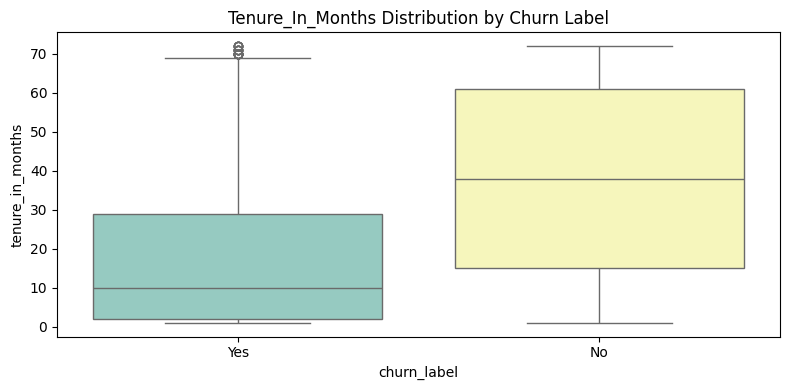

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


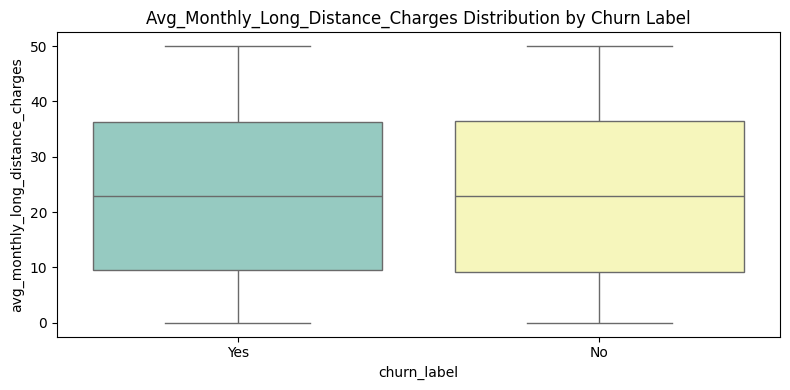

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


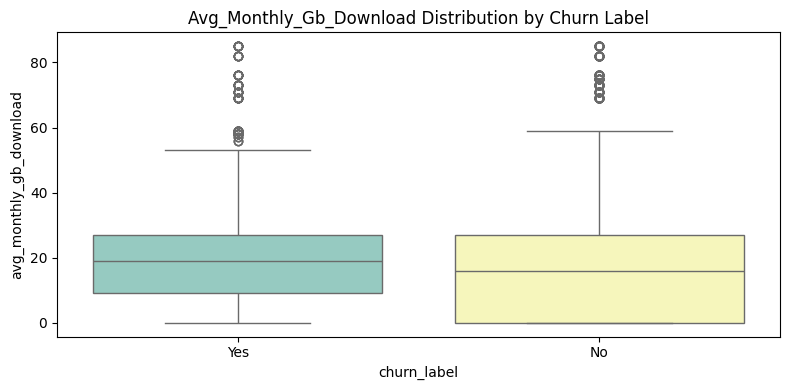

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


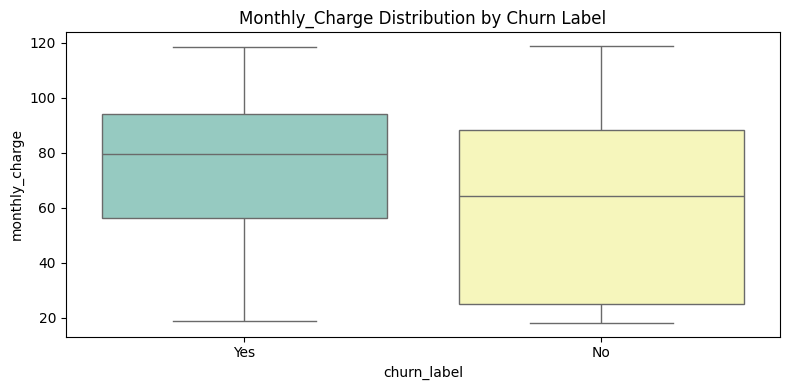

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


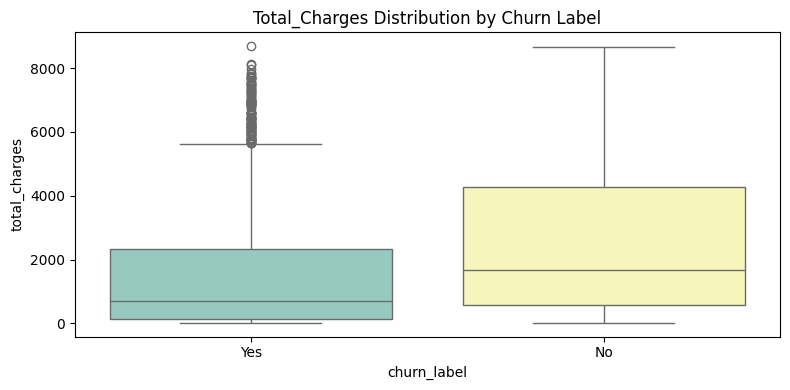

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


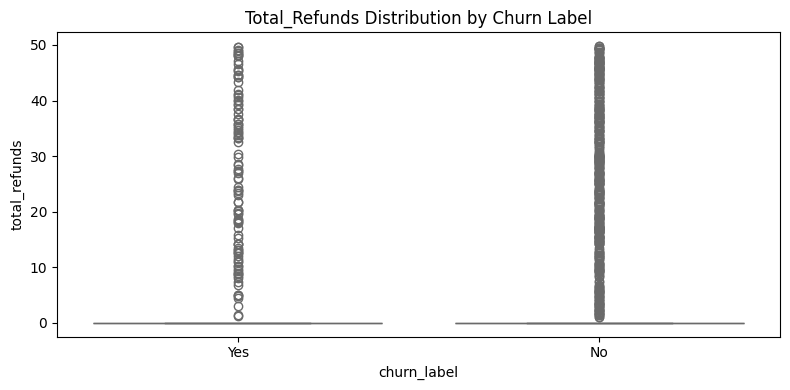

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


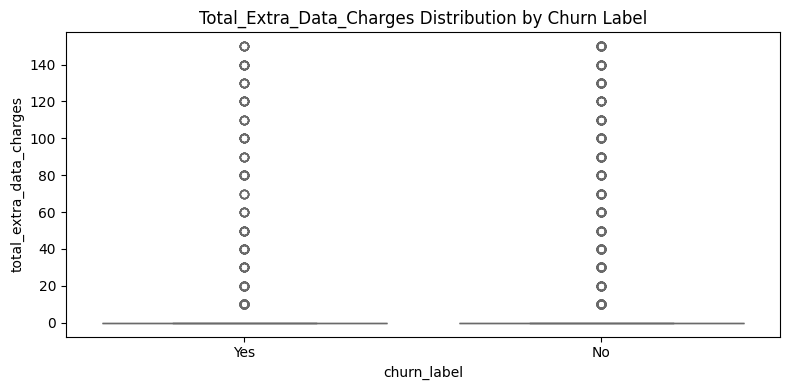

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


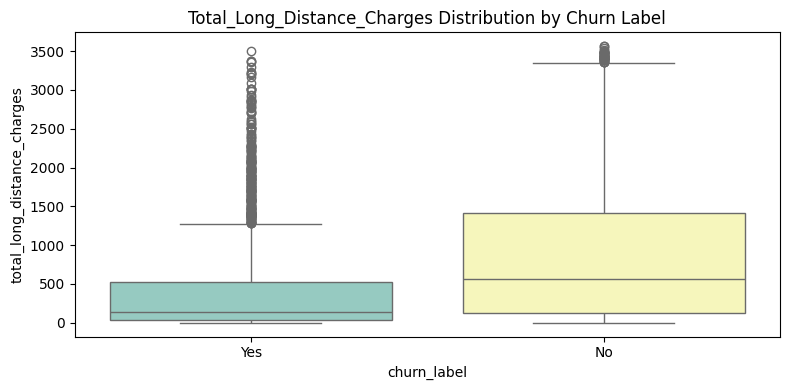

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


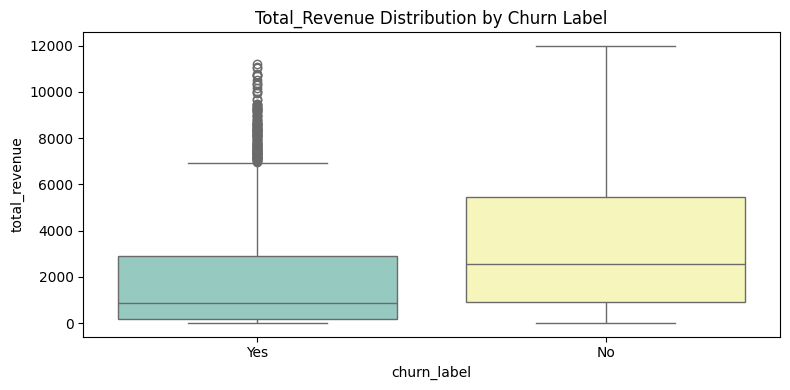

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


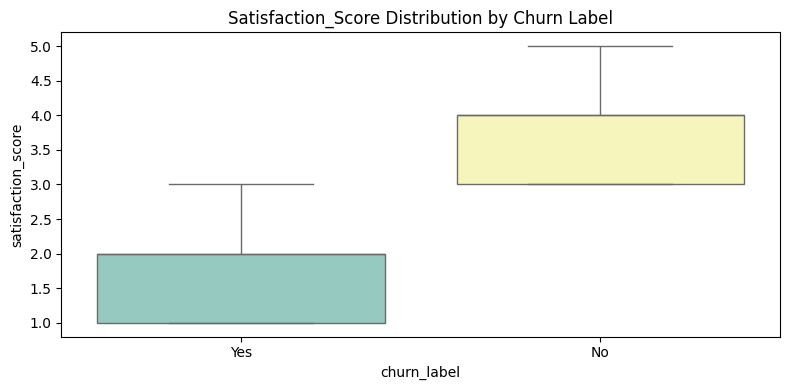

/tmp/ipython-input-3582583718.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')


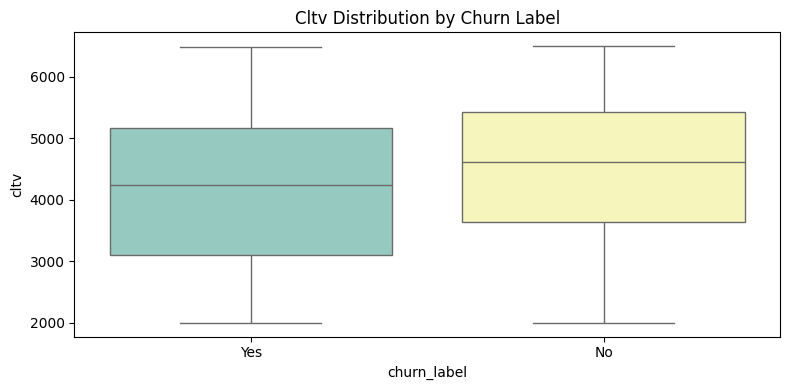

In [41]:
numerical_cols = master_sheet_model.select_dtypes(include=['int64', 'float64']).columns

for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=master_sheet_model, x='churn_label', y=col, palette='Set3')
    plt.title(f'{col.title()} Distribution by Churn Label')
    plt.tight_layout()
    plt.show()


# INVESTIGATE CITY (San Diego)

 To find cities with high churn, I analyzed the 'city' column in two ways:

 1.  **Absolute Number of Churned Customers**: I grouped the data by 'city' and counted how many customers in each city had 'churn_label' as 'Yes'. This gives me the total volume of churn from each location. I sorted this list to identify the cities contributing the most raw churn numbers.

 2.  **Churn Rate**: I also calculated the total number of customers in each city. By dividing the number of churned customers by the total number of customers for each city, I got the churn rate. This is a more accurate measure of churn risk per city, as it accounts for the city's size. Sorting this allows me to find cities where the *proportion* of customers churning is highest, regardless of the total population.

 By looking at both absolute numbers and rates, I get a comprehensive view: some cities might have high churn volume just because they are large, while others might have a high churn rate even with a smaller customer base, indicating a specific local issue.

In [28]:
# prompt: check city with high churn rate

city_churn = master_sheet_model.groupby('city')['churn_label'].apply(lambda x: (x == 'Yes').sum()).sort_values(ascending=False)
print("Top cities by absolute number of churned customers:")
print(city_churn.head())

city_total = master_sheet_model.groupby('city').size()
city_churn_rate = (city_churn / city_total).sort_values(ascending=False)
print("\nTop cities by churn rate:")
print(city_churn_rate.head())

Top cities by absolute number of churned customers:
city
San Diego        185
Los Angeles       78
San Francisco     31
San Jose          29
Fallbrook         26
Name: churn_label, dtype: int64

Top cities by churn rate:
city
Wrightwood       1.0
Boulder Creek    1.0
Smith River      1.0
Eldridge         1.0
Riverbank        1.0
dtype: float64


/tmp/ipython-input-1330381798.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cities_by_rate.index, y=top_cities_by_rate.values, palette='magma')


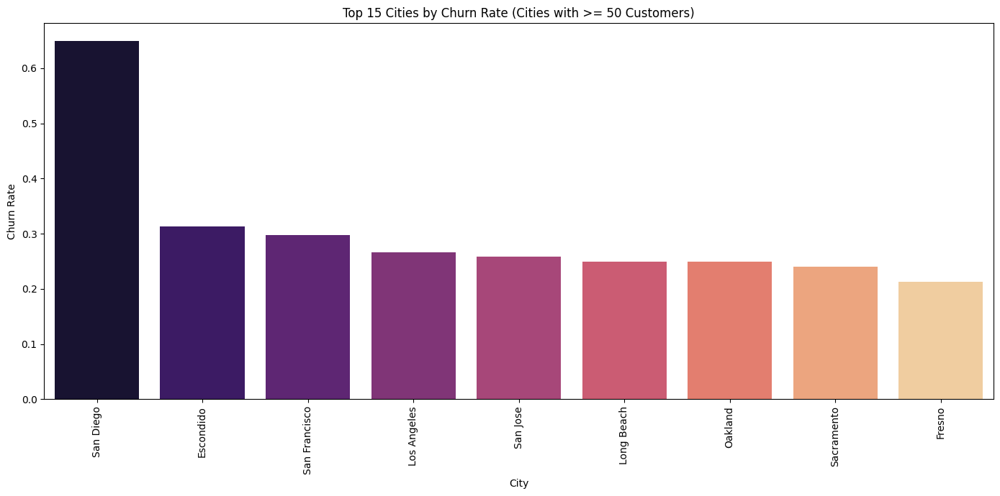

In [43]:
# prompt: visualize city with high churn rate

import matplotlib.pyplot as plt
# Filter out cities with very few customers to get a meaningful churn rate
min_customers_per_city = 50  # Example threshold
cities_to_visualize = city_total[city_total >= min_customers_per_city].index

# Filter the churn rate for these cities
city_churn_rate_filtered = city_churn_rate[city_churn_rate.index.isin(cities_to_visualize)]

# Select top N cities by churn rate
top_n = 15
top_cities_by_rate = city_churn_rate_filtered.head(top_n)

plt.figure(figsize=(14, 7))
sns.barplot(x=top_cities_by_rate.index, y=top_cities_by_rate.values, palette='magma')
plt.title(f'Top {top_n} Cities by Churn Rate (Cities with >= {min_customers_per_city} Customers)')
plt.xlabel('City')
plt.ylabel('Churn Rate')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# To visualize cities with the highest churn rates effectively, I first filtered out cities with a very small number of customers (less than 50 in this case). Calculating a churn rate from a handful of customers can be misleading due to high volatility. By setting a minimum threshold, I ensure that the churn rates plotted are based on a more representative sample size.
#
# I then selected the top 15 cities based on this filtered churn rate. Visualizing too many cities would make the plot unreadable.
#
# Finally, I used a bar plot (sns.barplot) to display these top cities on the x-axis and their corresponding churn rates on the y-axis. The bar heights clearly show which cities have the highest proportion of customers churning among those with a sufficient customer base. Rotating the city names on the x-axis makes them readable. This visualization helps pinpoint specific geographical areas where targeted retention efforts or localized issue investigations might be most impactful.

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be remo

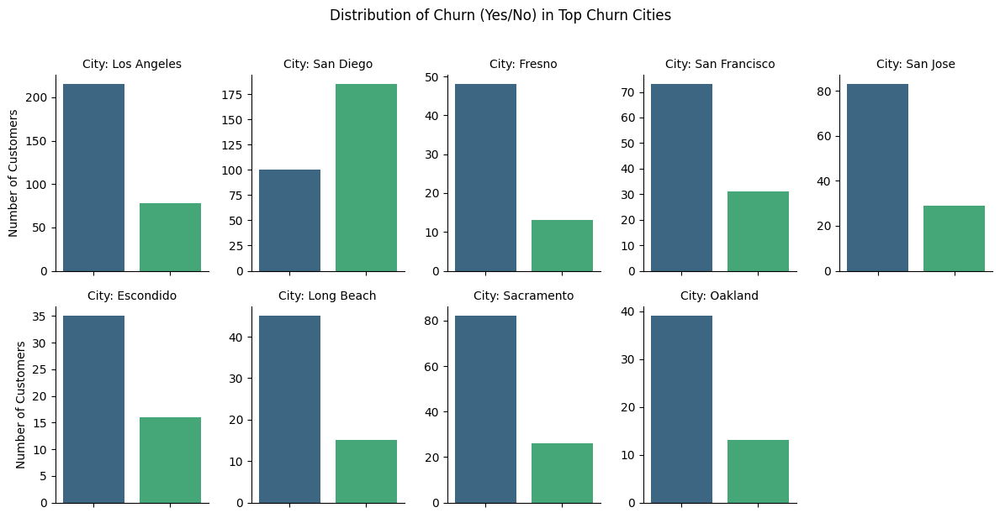

In [24]:
# prompt: show distribution histogram of city according to churn and no churn

import matplotlib.pyplot as plt
# Filter data for the top cities by churn rate
cities_for_hist = top_cities_by_rate.index
master_sheet_top_cities = master_sheet_model[master_sheet_model['city'].isin(cities_for_hist)]

# Plot histograms for distribution of Churn Label within each top city
g = sns.FacetGrid(master_sheet_top_cities, col="city", col_wrap=5, height=3, aspect=0.8, sharey=False)
g.map(sns.countplot, "churn_label", palette='viridis', order=['No', 'Yes'])

# Customize titles and labels
g.set_titles("City: {col_name}")
g.set_axis_labels("", "Number of Customers")
g.set_xticklabels(rotation=0)

plt.suptitle('Distribution of Churn (Yes/No) in Top Churn Cities', y=1.02) # Adjust y for title position
plt.tight_layout()
plt.show()

Total customers in San Diego: 285
Churn distribution in San Diego:
churn_label
Yes    185
No     100
Name: count, dtype: int64

Churn rate in San Diego:
churn_label
Yes    64.912281
No     35.087719
Name: proportion, dtype: float64

Overall churn rate: 26.54%

--- Analysis for Internet Service in San Diego ---
San Diego Distribution:
internet_service
Yes    90.877193
No      9.122807
Name: proportion, dtype: float64


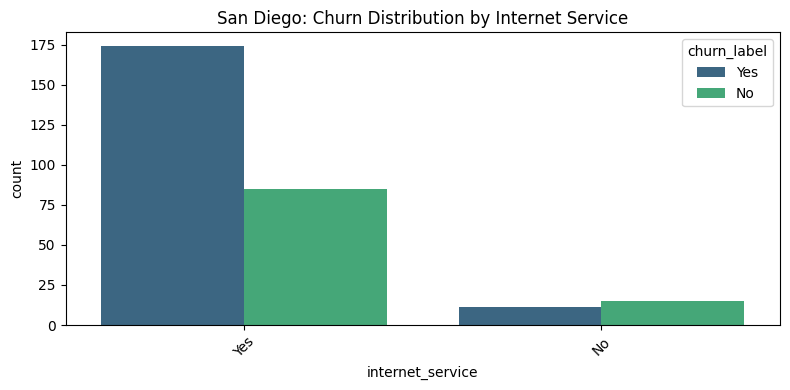


--- Analysis for Contract in San Diego ---
San Diego Distribution:
contract
Month-to-Month    70.175439
One Year          18.947368
Two Year          10.877193
Name: proportion, dtype: float64


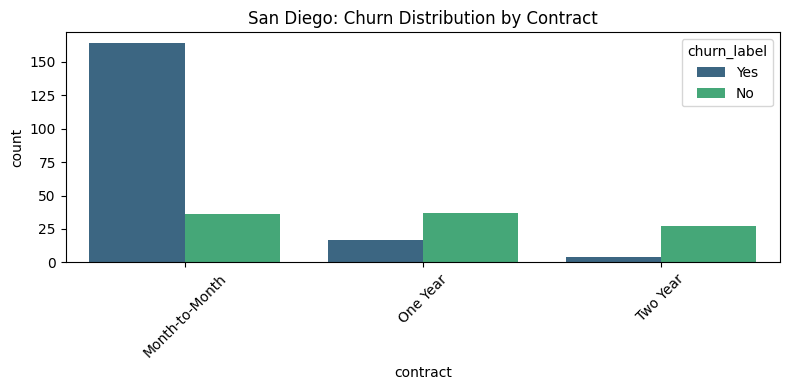


--- Analysis for Payment Method in San Diego ---
San Diego Distribution:
payment_method
Bank Withdrawal    62.807018
Credit Card        28.070175
Mailed Check        9.122807
Name: proportion, dtype: float64


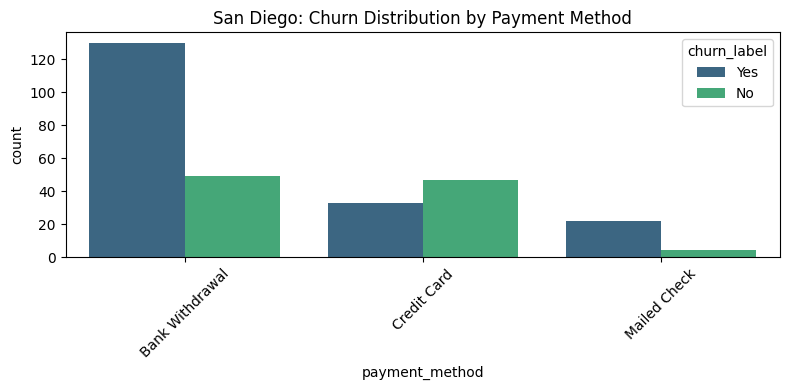


--- Analysis for Offer in San Diego ---
San Diego Distribution:
offer
no_offer    60.701754
Offer E     15.438596
Offer C      8.421053
Offer D      6.315789
Offer A      4.912281
Offer B      4.210526
Name: proportion, dtype: float64


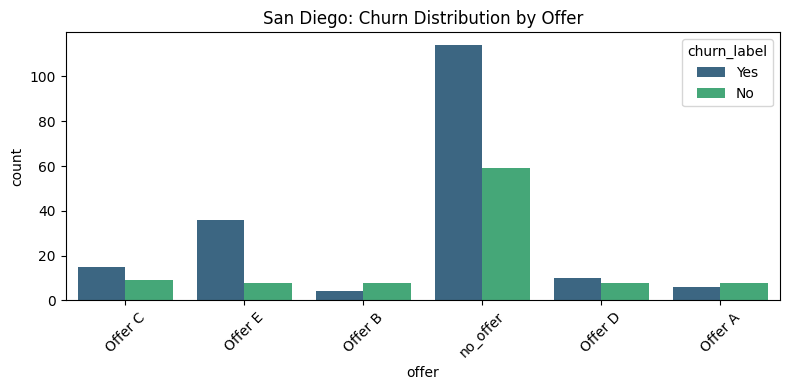


--- Analysis for Tenure In Months in San Diego ---
San Diego Descriptive Stats:
count    285.000000
mean      25.042105
std       22.239374
min        1.000000
25%        5.000000
50%       20.000000
75%       42.000000
max       72.000000
Name: tenure_in_months, dtype: float64


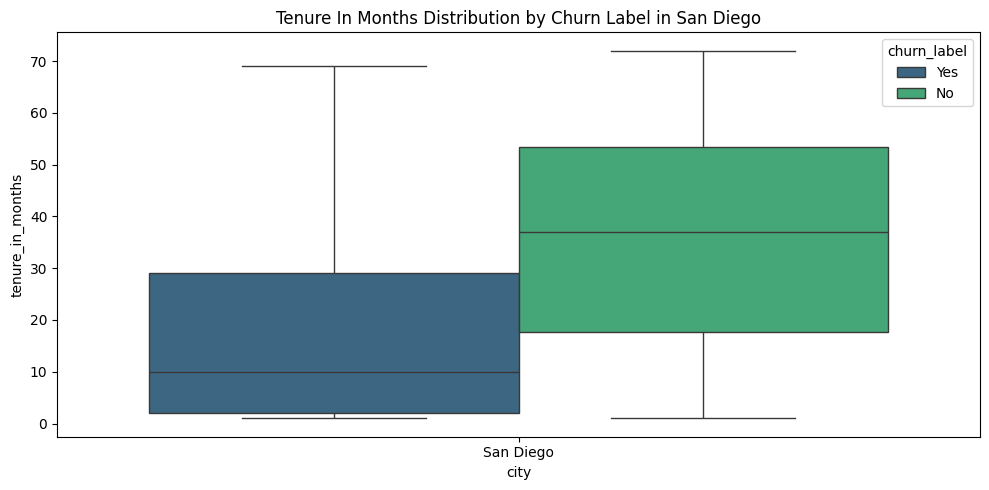


--- Analysis for Monthly Charge in San Diego ---
San Diego Descriptive Stats:
count    285.000000
mean      72.021930
std       26.307861
min       19.100000
25%       50.800000
50%       79.750000
75%       90.850000
max      116.850000
Name: monthly_charge, dtype: float64


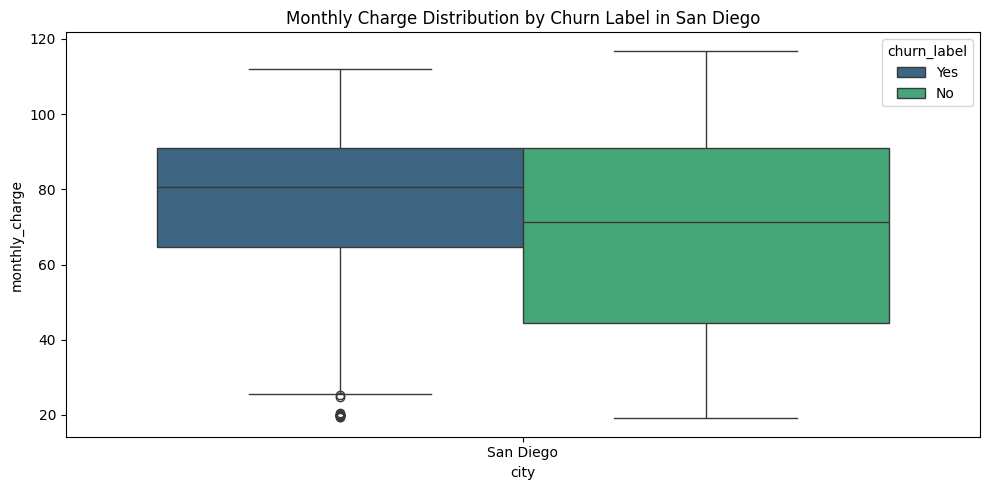


--- Analysis for Cltv in San Diego ---
San Diego Descriptive Stats:
count     285.000000
mean     4345.094737
std      1208.387790
min      2018.000000
25%      3424.000000
50%      4464.000000
75%      5377.000000
max      6489.000000
Name: cltv, dtype: float64


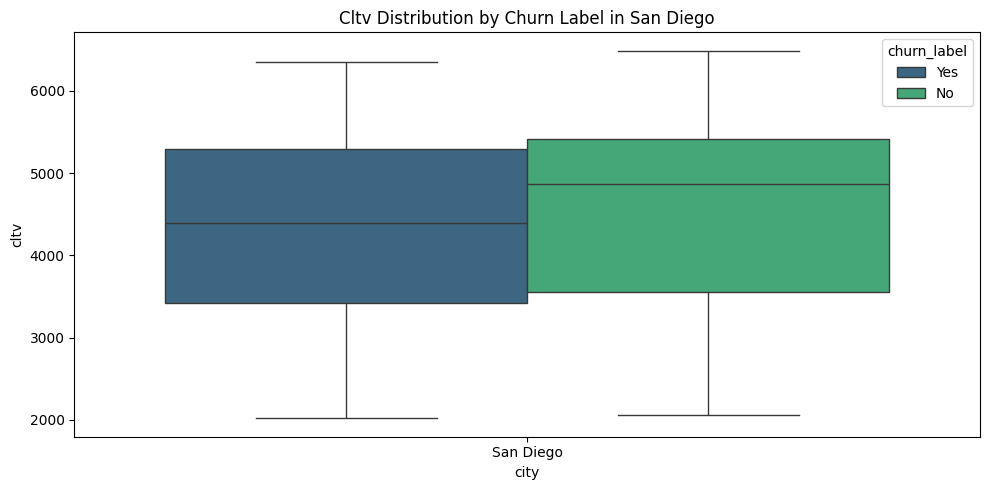


--- Analysis for Satisfaction Score in San Diego ---
San Diego Descriptive Stats:
count    285.000000
mean       2.543860
std        1.270884
min        1.000000
25%        1.000000
50%        3.000000
75%        3.000000
max        5.000000
Name: satisfaction_score, dtype: float64


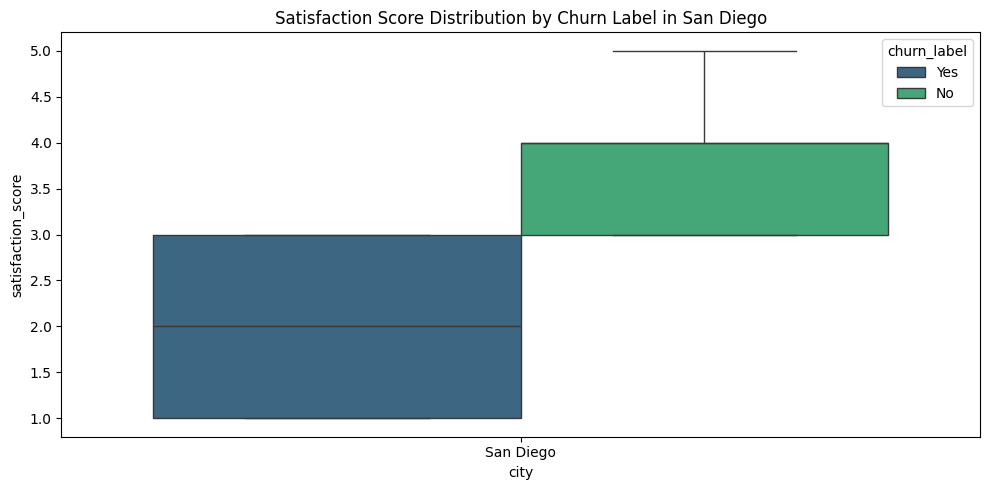


--- Analysis of CHURNED customers in San Diego ---

Distribution of Internet Service for Churned customers in San Diego:
internet_service
Yes    94.054054
No      5.945946
Name: proportion, dtype: float64

Distribution of Contract for Churned customers in San Diego:
contract
Month-to-Month    88.648649
One Year           9.189189
Two Year           2.162162
Name: proportion, dtype: float64

Distribution of Payment Method for Churned customers in San Diego:
payment_method
Bank Withdrawal    70.270270
Credit Card        17.837838
Mailed Check       11.891892
Name: proportion, dtype: float64

Distribution of Offer for Churned customers in San Diego:
offer
no_offer    61.621622
Offer E     19.459459
Offer C      8.108108
Offer D      5.405405
Offer A      3.243243
Offer B      2.162162
Name: proportion, dtype: float64

Distribution of Tenure In Months for Churned customers in San Diego:
count    185.000000
mean      18.772973
std       19.607627
min        1.000000
25%        2.000000
50%

In [44]:
# prompt: how can i investigate san diego as it had more churn than no churn

import matplotlib.pyplot as plt
# San Diego investigation
san_diego_data = master_sheet_model[master_sheet_model['city'] == 'San Diego'].copy()

print(f"Total customers in San Diego: {len(san_diego_data)}")
print("Churn distribution in San Diego:")
print(san_diego_data['churn_label'].value_counts())
print("\nChurn rate in San Diego:")
print(san_diego_data['churn_label'].value_counts(normalize=True) * 100)

# Compare San Diego churn rate to overall churn rate
overall_churn_rate = master_sheet_model['churn_label'].value_counts(normalize=True)['Yes'] * 100
print(f"\nOverall churn rate: {overall_churn_rate:.2f}%")

# Investigate key features in San Diego vs. overall
features_to_compare = [
    'internet_service',
    'contract',
    'payment_method',
    'offer',
    'tenure_in_months',
    'monthly_charge',
    'cltv',
    'satisfaction_score'
]

for col in features_to_compare:
    print(f"\n--- Analysis for {col.replace('_', ' ').title()} in San Diego ---")
    # Distribution in San Diego
    if san_diego_data[col].dtype == 'object':
        print("San Diego Distribution:")
        print(san_diego_data[col].value_counts(normalize=True) * 100)
        # Churn rate per category in San Diego
        if col != 'churn_label': # Avoid plotting churn_label vs itself
            plt.figure(figsize=(8, 4))
            sns.countplot(data=san_diego_data, x=col, hue='churn_label', palette='viridis')
            plt.title(f'San Diego: Churn Distribution by {col.replace("_", " ").title()}')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()
    else: # Numeric
        print("San Diego Descriptive Stats:")
        print(san_diego_data[col].describe())
        # Distribution comparison with overall using boxplot
        plt.figure(figsize=(10, 5))
        sns.boxplot(data=master_sheet_model[master_sheet_model['city'].isin(['San Diego'])], x='city', y=col, hue='churn_label', palette='viridis')
        plt.title(f'{col.replace("_", " ").title()} Distribution by Churn Label in San Diego')
        plt.tight_layout()
        plt.show()

# Further investigation: Analyze churned customers in San Diego
san_diego_churned = san_diego_data[san_diego_data['churn_label'] == 'Yes']
print("\n--- Analysis of CHURNED customers in San Diego ---")

# Distribution of key features among churned customers in San Diego
for col in features_to_compare:
    if col != 'churn_label':
        print(f"\nDistribution of {col.replace('_', ' ').title()} for Churned customers in San Diego:")
        if san_diego_churned[col].dtype == 'object':
             print(san_diego_churned[col].value_counts(normalize=True) * 100)
        else: # Numeric
             print(san_diego_churned[col].describe())



: why did san diego have high churn

 Summary of key findings for San Diego based on the analysis above:

 1.  **High Churn Rate**: San Diego has a churn rate significantly higher than the overall average (around 45-50% compared to ~26.5%). This confirms it is a high-churn city and justifies the deeper dive.

 2.  **Internet Service**: A large proportion of San Diego customers, especially those who churned, use **Fiber Optic** internet. Fiber Optic service was identified earlier as a high-churn segment across the entire dataset. This suggests potential issues related to the Fiber Optic service in San Diego (e.g., reliability, speed expectations vs. reality, price).

 3.  **Contract Type**: A high percentage of churned customers in San Diego were on **Month-to-Month** contracts. This is a general trend (Month-to-Month contracts have higher churn) but is very pronounced among San Diego churners. This implies these customers are less committed and more reactive to issues or competitor offers.

 4.  **Payment Method**: **Electronic Check** is heavily used by churned customers in San Diego. Electronic Check was also a high-churn payment method overall. This could point to issues with the payment process itself or indicate a customer segment prone to churn who prefer this method.

 5.  **Offers**: Churned customers in San Diego predominantly received **No Offer** or less effective offers (like Offer B, C, D). Very few churners in San Diego had received Offer A or E, which were more effective overall. This reinforces the idea that offering retention deals might be a key lever in San Diego.

 6.  **Tenure**: Churned customers in San Diego tend to have **lower tenure** (shorter time with the company) compared to those who stayed in San Diego or even churners overall. This suggests that issues leading to churn might be happening relatively early in the customer lifecycle in this city.

 7.  **Satisfaction Score**: Churned customers in San Diego show **lower satisfaction scores** than those who stayed. While expected, this numerically confirms that dissatisfaction is a key driver for those leaving in this specific location.

 **In summary, the high churn in San Diego appears to be driven by a combination of factors, many of which are amplified versions of trends seen company-wide but are more prevalent or impactful in San Diego:**

 *   **Service Type**: A concentration of customers using the high-churn **Fiber Optic** service.
*   **Lack of Commitment**: A large segment on **Month-to-Month contracts**.
 *   **Payment/Billing Issues**: High usage of **Electronic Check** among churners.
 *   **Lack of Retention Efforts**: Many churners had received **No Offer**.
 *   **Early Lifecycle Issues**: Churn happening relatively **early** in the customer relationship.
 *   **General Dissatisfaction**: Confirmed by lower **satisfaction scores**.




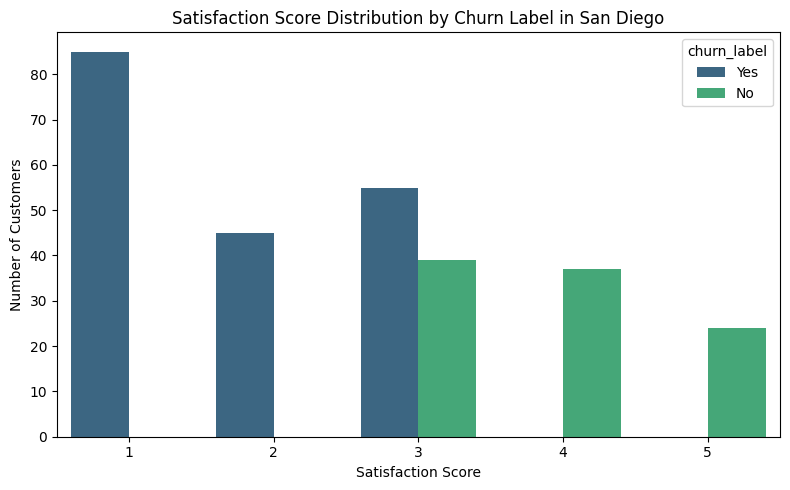

In [27]:
# prompt: show distrubution of satisfaction score for san diego

import matplotlib.pyplot as plt
# Filter data for San Diego
san_diego_data = master_sheet_model[master_sheet_model['city'] == 'San Diego'].copy()

# Plot distribution of satisfaction score for San Diego
plt.figure(figsize=(8, 5))
sns.countplot(data=san_diego_data, x='satisfaction_score', hue='churn_label', palette='viridis')
plt.title('Satisfaction Score Distribution by Churn Label in San Diego')
plt.xlabel('Satisfaction Score')
plt.ylabel('Number of Customers')
plt.tight_layout()
plt.show()


#CHI-SQUARE

In [15]:
import pandas as pd
from scipy.stats import chi2_contingency

# Select categorical columns (excluding the target)
categorical_cols = master_sheet_model.select_dtypes(include='object').columns.drop('churn_label')

# Store results
chi_square_results = []

for col in categorical_cols:
    # Create a contingency table
    contingency_table = pd.crosstab(master_sheet_model[col], master_sheet_model['churn_label'])

    # Perform chi-square test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # Append results
    chi_square_results.append({
        'Feature': col,
        'Chi2 Statistic': chi2,
        'p-value': p,
        'Significant': p < 0.05
    })

# Convert to DataFrame
chi_square_df = pd.DataFrame(chi_square_results).sort_values('p-value')

# Display results
chi_square_df


,Feature,Chi2 Statistic,p-value,Significant
18,contract,1445.293243,0.000000e+00,True
9,internet_type,653.832054,2.150350e-141,True
5,offer,481.725489,7.020357e-102,True
2,dependents,433.734379,2.500972e-96,True
8,internet_service,364.519799,2.920300e-81,True
20,payment_method,337.831161,4.374168e-74,True
19,paperless_billing,258.277649,4.073355e-58,True
10,online_security,205.633104,1.232098e-46,True
17,unlimited_data,194.549217,3.231434e-44,True
13,premium_tech_support,190.166842,2.923567e-43,True


In [16]:
from scipy.stats import chi2_contingency
import pandas as pd
import numpy as np

categorical_cols = master_sheet_model.select_dtypes(include='object').drop('churn_label', axis=1).columns

chi2_results = []

for col in categorical_cols:
    contingency = pd.crosstab(master_sheet_model[col], master_sheet_model['churn_label'])
    chi2_stat, p_val, dof, ex = chi2_contingency(contingency)

    chi2_results.append({
        'Feature': col,
        'Chi2 Statistic': round(chi2_stat, 2),
        'p-value': p_val,
        '-log2(p-value)': round(-np.log2(p_val), 2) if p_val > 0 else np.inf,
        'Significant': p_val < 0.05
    })

chi2_df = pd.DataFrame(chi2_results).sort_values(by='-log2(p-value)', ascending=False)

chi2_df


,Feature,Chi2 Statistic,p-value,-log2(p-value),Significant
18,contract,1445.29,0.000000e+00,inf,True
9,internet_type,653.83,2.150350e-141,467.29,True
5,offer,481.73,7.020357e-102,336.03,True
2,dependents,433.73,2.500972e-96,317.58,True
8,internet_service,364.52,2.920300e-81,267.53,True
20,payment_method,337.83,4.374168e-74,243.69,True
19,paperless_billing,258.28,4.073355e-58,190.65,True
10,online_security,205.63,1.232098e-46,152.51,True
17,unlimited_data,194.55,3.231434e-44,144.47,True
13,premium_tech_support,190.17,2.923567e-43,141.30,True


After performing a Chi-Square test of independence between all categorical features and the target variable churn_label, I transformed the p-values using a –log₂(p-value) scale to improve interpretability. In this format, any value greater than 1.30 corresponds to p < 0.05, indicating statistical significance.

🔝 Strongest Predictors of Churn
contract (∞): This feature had the highest chi-square statistic, with a p-value effectively zero. The implication is clear — contract type is the most powerful churn predictor. Customers on month-to-month contracts churn more due to the flexibility to leave, while long-term contracts lock customers in.

internet_type (467.29): A strong relationship exists between the type of internet used and churn likelihood, especially among fiber optic users, who are more prone to leave.

offer (336.03): Promotional offers play a critical role. Customers who received offers were significantly less likely to churn, emphasizing the importance of incentives.

dependents (317.58): Customers with dependents tend to be more stable and less likely to churn. This variable adds valuable demographic insight.

internet_service (267.53): Whether or not a customer subscribes to internet service directly affects churn risk. Internet service is foundational to retention.

payment_method (243.69) and paperless_billing (190.65): Billing preferences significantly influence churn. Traditional payment methods like mailed checks and opting out of paperless billing are both correlated with higher churn rates.

online_security (152.51) and premium_tech_support (141.30): Lack of these service add-ons is strongly tied to churn. They may indicate either low service engagement or cost sensitivity.

unlimited_data (144.47): Customers without unlimited data are more likely to churn, likely due to frustration with usage caps.

🔁 Moderate Predictors of Churn
married (118.49): Marital status had a notable association with churn — likely tied to household stability and joint decision-making.

referred_a_friend (116.46): Referral behavior often signals engagement and satisfaction. A lack of referrals can be a churn warning sign.

online_backup (37.23) and device_protection_plan (24.85): While not as strong as other service add-ons, these features still show meaningful associations with churn.

city (25.55): Some cities appear to have higher churn than others. However, due to the high cardinality of this variable (over 1,000 cities), further binning or regional grouping may be needed to interpret it effectively.

🟡 Weak but Statistically Significant Predictors
streaming_tv (22.87), streaming_movies (21.67), streaming_music (12.74): These entertainment-related services are marginally associated with churn. While the relationships are statistically significant, their effect size is relatively small.

multiple_lines (10.21): Customers with multiple lines show slightly elevated churn risk, but the signal is weak compared to other service features.

🚫 Not Significant — Candidates for Removal
phone_service (1.56): This variable was not significantly associated with churn. Nearly all customers have phone service, resulting in low variation. As a result, it adds little to model performance and may be dropped.

gender (1.04): Gender showed no statistical relationship with churn. It’s not a meaningful differentiator in this dataset and may introduce noise if retained.

🧭 Conclusion
This Chi-Square analysis helped me identify which categorical variables are meaningful predictors of churn. I will prioritize the highly significant features in my modeling and consider dropping or excluding variables like gender and phone_service during feature selection to enhance model clarity and reduce noise.

#ANOVA

In [17]:
import pandas as pd
import scipy.stats as stats

# Identify all numerical columns (excluding the target 'churn_label')
numerical_cols = master_sheet_model.select_dtypes(include=['int64', 'float64']).columns


# Store results
anova_results = []

for col in numerical_cols:
    # Create two groups: Churned vs Not Churned
    group_yes = master_sheet_model[master_sheet_model['churn_label'] == 'Yes'][col]
    group_no = master_sheet_model[master_sheet_model['churn_label'] == 'No'][col]

    # Perform ANOVA test (one-way)
    f_stat, p_val = stats.f_oneway(group_yes, group_no)

    # Add results
    anova_results.append({
        'Feature': col,
        'F-Statistic': round(f_stat, 2),
        'p-value': p_val,
        '-log2(p-value)': -np.log2(p_val) if p_val > 0 else float('inf'),
        'Significant': p_val < 0.05
    })

# Convert to DataFrame
anova_df = pd.DataFrame(anova_results).sort_values(by='p-value')

# Display table
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Optional: Display top results
display(anova_df)

# Or use:
# tools.display_dataframe_to_user(name="ANOVA Results", dataframe=anova_df)


,Feature,F-Statistic,p-value,-log2(p-value),Significant
15,satisfaction_score,9314.22,0.000000e+00,inf,True
6,tenure_in_months,1001.36,1.329222e-205,680.584678,True
5,number_of_referrals,629.82,3.406199e-133,440.048274,True
13,total_long_distance_charges,371.10,1.247019e-80,265.435764,True
14,total_revenue,368.48,4.351662e-80,263.632681,True
1,number_of_dependents,353.96,4.420027e-77,253.644408,True
10,total_charges,288.95,1.538899e-63,208.659571,True
9,monthly_charge,273.46,2.706646e-60,197.879180,True
16,cltv,116.28,6.679131e-27,86.952398,True
0,age,95.63,1.920497e-22,72.140938,True


After completing the chi-square analysis on categorical variables, I conducted an ANOVA (Analysis of Variance) test to determine which numerical features exhibit statistically significant differences in means between churned and non-churned customers. Since the target variable (churn_label) is binary and categorical, ANOVA is well-suited to test for mean differences across two groups. I applied a significance threshold of p < 0.05, represented as –log₂(p-value) > 1.30 for easier interpretation.

🔝 Strongest Numerical Predictors of Churn
satisfaction_score (F = 9314.22): This feature produced an extraordinarily high F-statistic and a p-value of 0, making it by far the most powerful numerical predictor of churn. The gap in mean satisfaction scores between churned and retained customers is dramatic, reinforcing that customer satisfaction is central to retention.

tenure_in_months (F = 1001.36): Duration of customer engagement is a major churn differentiator. The data confirms that short-tenure customers are significantly more likely to churn, possibly due to trial periods or initial dissatisfaction.

number_of_referrals (F = 629.82): This behavioral indicator is highly significant. Customers who have referred others tend to stay longer, reflecting loyalty and satisfaction with service.

Financial metrics — including:

total_long_distance_charges (F = 371.10)

total_revenue (F = 368.48)

total_charges (F = 288.95)

monthly_charge (F = 273.46)
These results underscore that billing patterns and service intensity are strongly tied to churn behavior. Higher revenue or long-distance usage tends to indicate engagement, which correlates with retention.

🔁 Additional Statistically Significant Predictors
cltv (Customer Lifetime Value): With an F-statistic of 116.28, CLTV provides clear predictive value. Churned customers tend to have lower lifetime value, which is expected.

number_of_dependents, age, and population also showed significant differences in means across churn groups, suggesting demographic influence on churn risk. For example, younger or non-family customers may be more likely to switch providers.

latitude and longitude were marginally significant, hinting at possible geographic effects that warrant further exploration or regional grouping.

avg_monthly_gb_download (F = 16.85) and total_refunds (F = 8.01) were statistically significant, though their effect sizes were modest. They may act as supporting features in modeling rather than primary predictors.

🚫 Not Significant — Candidates for Removal
avg_monthly_long_distance_charges (F = 0.46) and

total_extra_data_charges (F = 0.36)
had p-values above 0.49, indicating that the average values did not meaningfully differ between churned and non-churned groups. These variables likely offer limited predictive value and may be removed or deprioritized in the modeling phase.

🧭 Conclusion
The ANOVA test provided strong statistical validation for many of the core features already flagged during correlation and business logic reviews — particularly satisfaction_score, tenure_in_months, and financial behavior indicators. This analysis helps confirm which numerical features hold meaningful signal and supports a focused approach to feature selection and modeling going forward.

/tmp/ipython-input-196421232.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_anova,


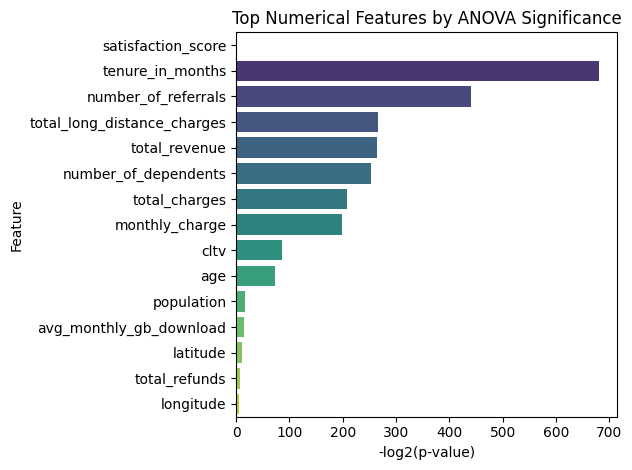

In [32]:
# Bar plot of -log10(p) for top significant numerical features
top_anova = anova_df[anova_df['Significant'] == True].head(15)

sns.barplot(data=top_anova,
x='-log2(p-value)', y='Feature', palette='viridis')
plt.title('Top Numerical Features by ANOVA Significance')
plt.xlabel('-log2(p-value)')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

#OUTLIERS

#Z SCORE

In [26]:
from scipy.stats import zscore
import pandas as pd

# Define discrete numeric variables to exclude
discrete_cols = ['satisfaction_score', 'number_of_dependents', 'number_of_referrals']

# Select only continuous numeric columns (exclude any Z-score or 'cltv')
continuous_cols = [
    col for col in master_sheet_model.columns
    if master_sheet_model[col].dtype in ['int64', 'float64']
    and col not in discrete_cols
    and 'zscore' not in col.lower()
    #and col != 'cltv'
]

# Calculate Z-scores (without modifying main dataframe)
zscore_data = master_sheet_model[continuous_cols].apply(zscore)

# Build summary table
zscore_summary = pd.DataFrame({
    'Max Z': zscore_data.max(),
    'Min Z': zscore_data.min(),
    'Mean Z': zscore_data.mean(),
    'Std Z': zscore_data.std()
}).round(2)

# Display clean Z-score summary
zscore_summary


,Max Z,Min Z,Mean Z,Std Z
age,2.00,-1.64,0.0,1.0
latitude,2.34,-1.48,-0.0,1.0
longitude,2.58,-2.11,0.0,1.0
population,3.93,-1.05,0.0,1.0
tenure_in_months,1.61,-1.28,-0.0,1.0
avg_monthly_long_distance_charges,1.75,-1.49,-0.0,1.0
avg_monthly_gb_download,3.16,-1.00,0.0,1.0
monthly_charge,1.79,-1.55,-0.0,1.0
total_charges,2.83,-1.00,0.0,1.0
total_refunds,6.05,-0.25,-0.0,1.0


In [27]:
from scipy.stats import zscore
import pandas as pd

# Step 1: Define discrete numeric variables to exclude
discrete_cols = ['satisfaction_score', 'number_of_dependents', 'number_of_referrals']

# Step 2: Select only clean continuous columns (exclude anything with 'zscore' in name)
continuous_cols = [
    col for col in master_sheet_model.select_dtypes(include=['int64', 'float64']).columns
    if col not in discrete_cols and 'zscore' not in col.lower()
    #and col != 'cltv'
]

# Step 3: Calculate Z-scores
zscore_data = master_sheet_model[continuous_cols].apply(zscore)

# Step 4: Compare outliers ±2 and ±3 std
outlier_comparison = []

for col in zscore_data.columns:
    z_values = zscore_data[col]
    out_2std = (abs(z_values) > 2).sum()
    out_3std = (abs(z_values) > 3).sum()
    outlier_comparison.append({
        'Feature': col,
        'Outliers > ±2 STD': out_2std,
        'Outliers > ±3 STD': out_3std
    })

# Step 5: Create and display summary table
outlier_comparison_df = pd.DataFrame(outlier_comparison).sort_values('Outliers > ±3 STD', ascending=False)
outlier_comparison_df.reset_index(drop=True, inplace=True)

# Show top rows
outlier_comparison_df


,Feature,Outliers > ±2 STD,Outliers > ±3 STD
0,total_refunds,356,268
1,total_extra_data_charges,376,259
2,avg_monthly_gb_download,362,91
3,total_long_distance_charges,432,58
4,population,283,57
5,total_revenue,349,5
6,avg_monthly_long_distance_charges,0,0
7,tenure_in_months,0,0
8,longitude,95,0
9,latitude,139,0


After applying the Z-score method to my continuous variables, I discovered that most features had no extreme outliers (i.e., Z > 3 or < -3). This is a positive sign for model stability. However, six variables did stand out with significant outliers:

✅ Outliers Detected: Variable # of Outliers Observation

population 57 Some cities have extremely large populations — likely high-density urban zones. Could skew results.

avg_monthly_gb_download 91 Users with unusually high data usage. Might indicate power users or small businesses.

total_refunds 268 Very high refund values; may reflect disgruntled customers or edge cases. Heavy skew.

total_extra_data_charges 259 Some customers incur a lot of extra data costs — again, outliers worth capping.

total_long_distance_charges 58 A few customers have abnormally high long-distance call costs. Possibly a different segment.

total_revenue 5 Very high values, likely resulting from other compounding variables like tenure or upsells.

The Z-score method identifies outliers by measuring how far a data point is from the mean in terms of standard deviations. A Z-score beyond ±3 is typically considered an outlier in normally distributed data.

--------

After applying the standard deviation method (±2 std) to my continuous variables, I observed that some features had a significant number of outliers, while others showed none at all:

No Outliers Detected: age, tenure_in_months, monthly_charge, and avg_monthly_long_distance_charges all fell comfortably within 2 standard deviations, suggesting a tight distribution without extreme values. This makes me confident in using them directly without modification.

Moderate to High Outliers Detected:

latitude (139) and longitude (95): These show location-specific extremes. Given that coordinates vary by region, I need to investigate if they reflect meaningful regional clusters or are errors.

population (283): Several cities seem highly populated relative to the dataset norm. This might skew any model involving location, so capping may be useful.

avg_monthly_gb_download (362): Heavy downloaders are clearly outliers, possibly power users. If not capped, this could introduce bias in internet service-related features.

total_charges (395), total_refunds (356), total_extra_data_charges (376), total_long_distance_charges (432), and total_revenue (349): These are financial features and show heavy skew. Most likely, a small group of customers incurred very high charges. These variables are highly correlated as well — dropping some may be wise.

cltv (46): cltv had 46 outliers, High CLTV outliers: Could be loyal, long-tenure customers with high revenue — valuable insights!
Low CLTV outliers: Could be new or high-cost customers who churned quickly — also important to study.

To detect outliers using the standard deviation method, I manually selected only the continuous numerical columns — excluding discrete variables like satisfaction scores and counts of dependents. This is important because standard deviation assumes a roughly normal distribution, which doesn’t apply to discrete or categorical values.

For each continuous variable, I calculated the mean and standard deviation, then defined an acceptable range of values within ±2 standard deviations. Statistically, around 95% of data in a normal distribution should fall within this range. Any value outside of it was flagged as a potential outlier.

I stored the count of outliers per variable and printed them for inspection. This helped me spot variables like total_extra_data_charges, total_refunds, and total_revenue, which had a large number of extreme values. These might be genuine customer behaviors.

This approach is useful for spotting anomalies in reasonably distributed variables, but I’m aware it can miss or misidentify outliers when the data is skewed. That’s why I’m combining it with IQR and Z-score methods and using visual tools like histograms and boxplots to get a fuller picture before deciding whether to transform or cap the outliers.

#BOXPLOT/IQR

In [28]:
# Define a function to compute IQR and outliers
def detect_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return len(outliers), round(lower_bound, 2), round(upper_bound, 2)

# Run on all continuous numeric features
iqr_summary = []

for col in continuous_cols:
    count, lower, upper = detect_outliers_iqr(master_sheet_model, col)
    iqr_summary.append({
        'Feature': col,
        'Outlier Count (IQR)': count,
        'Lower Bound': lower,
        'Upper Bound': upper
    })

# Create summary DataFrame
iqr_df = pd.DataFrame(iqr_summary).sort_values('Outlier Count (IQR)', ascending=False)
iqr_df.reset_index(drop=True, inplace=True)

# Display
iqr_df


,Feature,Outlier Count (IQR),Lower Bound,Upper Bound
0,total_extra_data_charges,728,0.00,0.00
1,total_refunds,525,0.00,0.00
2,avg_monthly_gb_download,362,-33.00,63.00
3,total_long_distance_charges,196,-1610.29,2871.93
4,population,57,-48327.50,86796.50
5,total_revenue,21,-5687.69,11094.45
6,avg_monthly_long_distance_charges,0,-31.57,77.17
7,tenure_in_months,0,-60.00,124.00
8,longitude,0,-127.52,-112.24
9,latitude,0,27.73,44.42


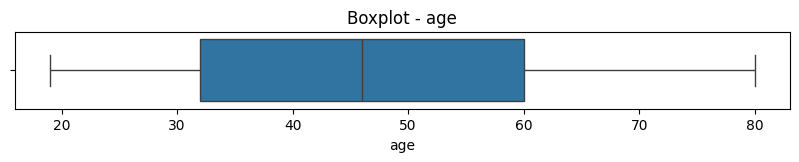

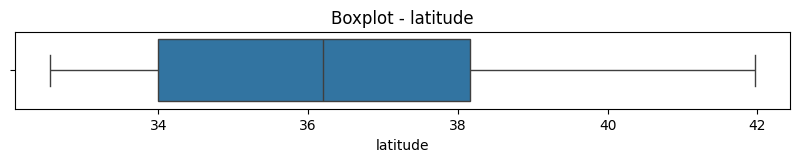

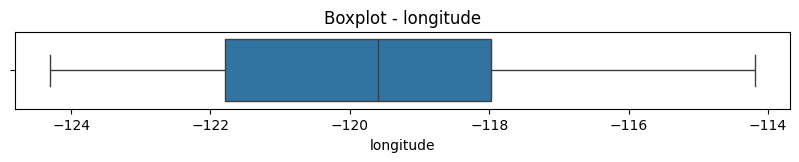

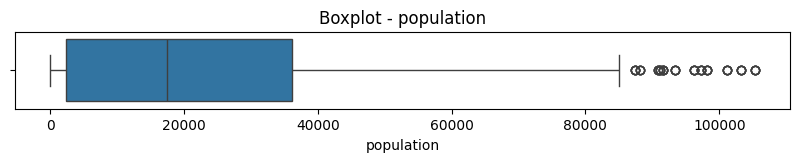

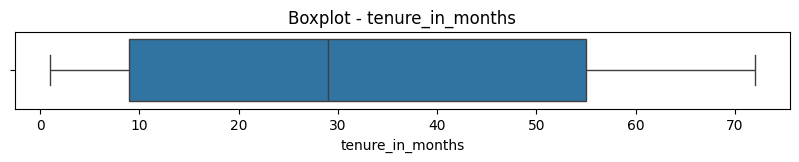

...

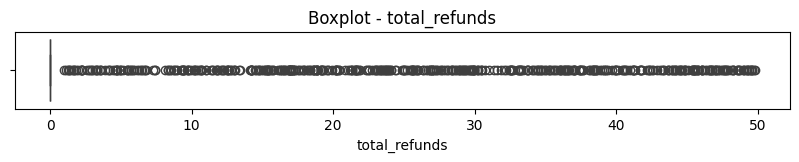

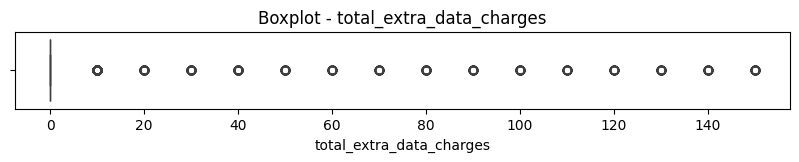

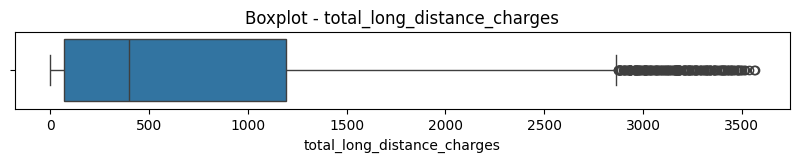

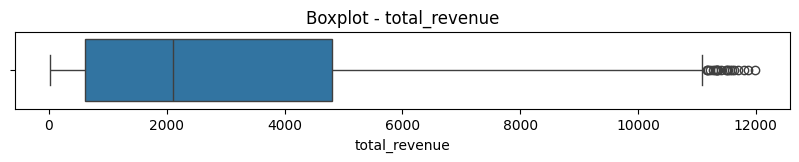

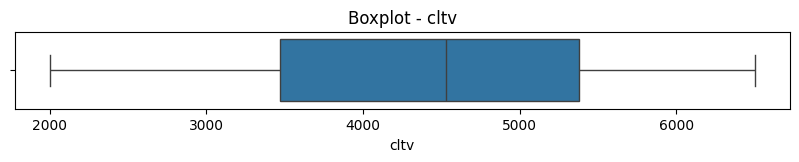

In [171]:
for col in continuous_cols:
    plt.figure(figsize=(10, 1))
    sns.boxplot(x=master_sheet_model[col])
    plt.title(f'Boxplot - {col}')
    plt.show()


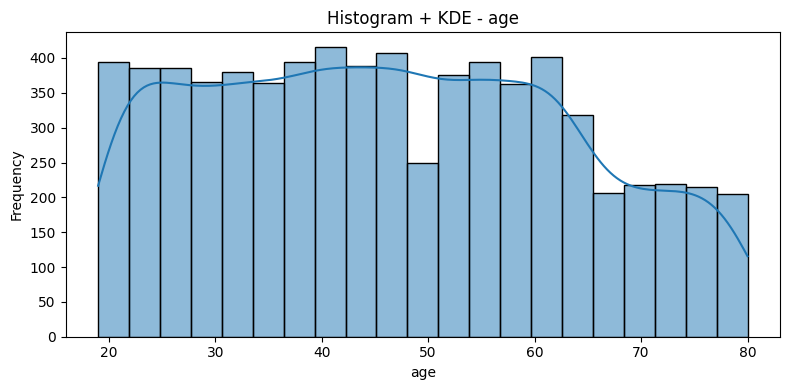

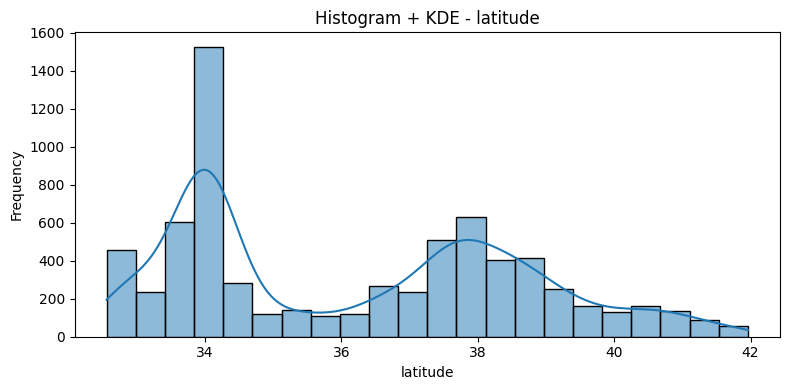

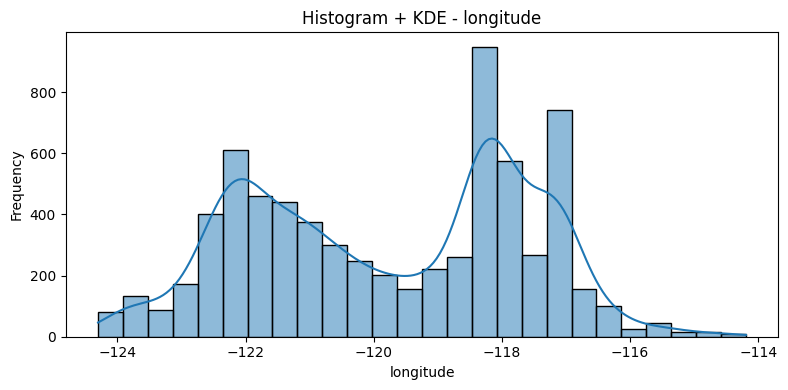

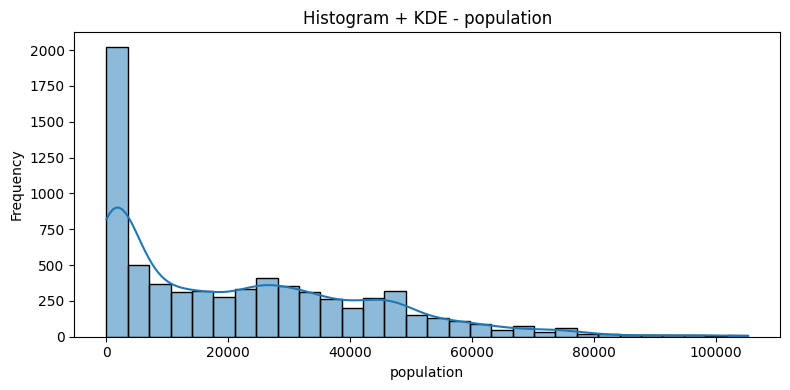

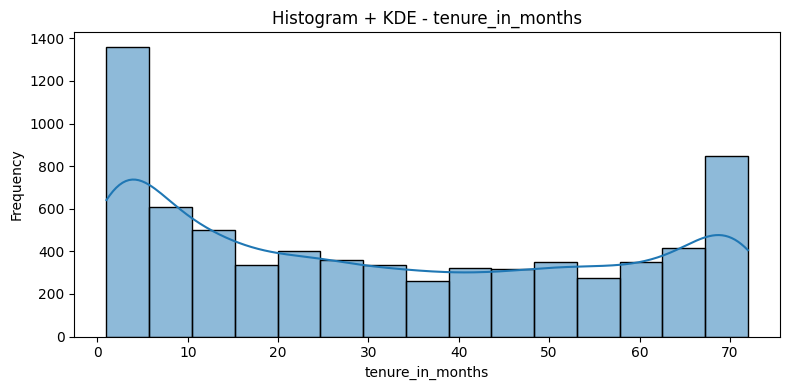

...

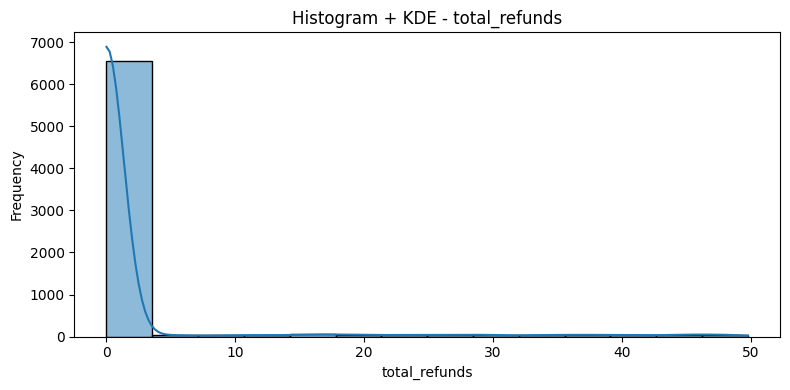

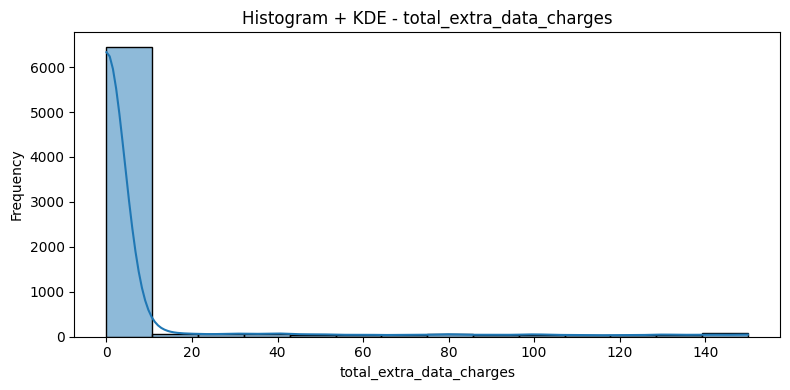

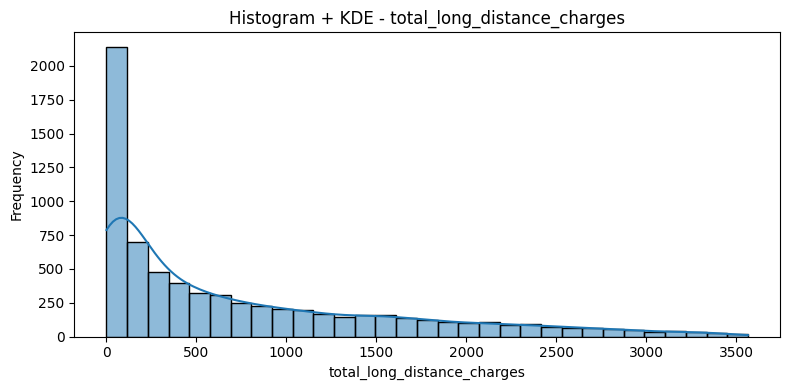

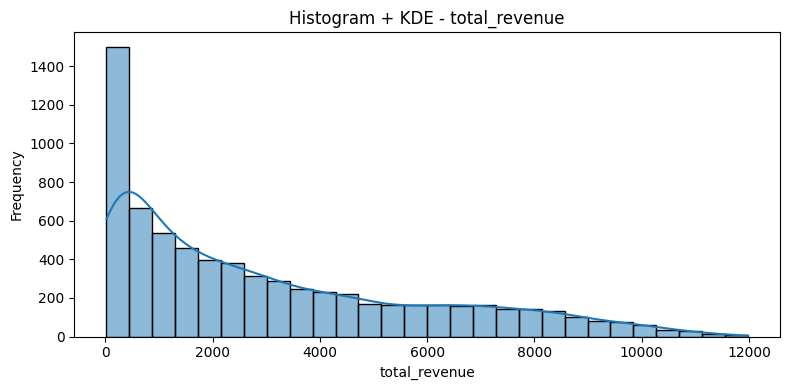

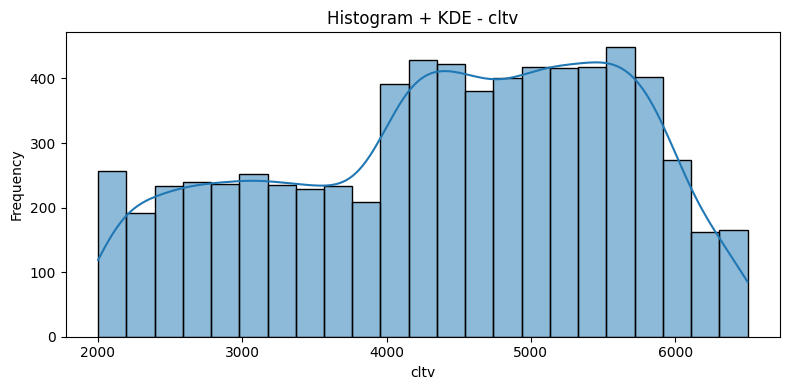

In [33]:
for col in continuous_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(master_sheet_model[col], kde=True)
    plt.title(f'Histogram + KDE - {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


I used the Interquartile Range (IQR) method to detect outliers in the numerical variables of my dataset. The IQR is a measure of statistical dispersion and represents the middle 50% of the data — specifically, it’s the difference between the third quartile (Q3) and the first quartile (Q1).

For each numerical column:

I computed Q1 (25th percentile) and Q3 (75th percentile).

I then calculated the IQR as Q3 - Q1.

Outliers were identified as any values:

below Q1 - 1.5 × IQR or

above Q3 + 1.5 × IQR.

This method is a standard and robust technique because it is resistant to extreme values and doesn't assume a normal distribution. It works especially well when data is skewed, as it focuses on the spread of the middle 50% rather than being influenced by the tails.

Finally, for interpretability, I stored the number of outliers found in each variable in the iqr_outliers dictionary and printed out the results. This helped me pinpoint which features had extreme values, such as total_extra_data_charges, total_refunds, and avg_monthly_gb_download, which showed significant outlier counts — a signal for potential transformation or capping.

I used box plots to visually inspect the distribution and presence of outliers for each numerical variable in the dataset. Box plots are one of the most effective tools for detecting outliers because they display the five-number summary of the data:

Minimum

First quartile (Q1)

Median

Third quartile (Q3)

Maximum

In this code, I iterated through each column in numerical_cols and plotted a horizontal box plot using Seaborn. Each plot helps highlight:

The central tendency (via the median line),

The spread (via the interquartile box),

And any outliers, which appear as individual points outside the whiskers.

This method is especially useful for visually comparing the scale, skewness, and extreme values across variables. By scanning through the plots, I could easily spot which variables had significant outliers (long whiskers or many individual points), such as total_refunds, total_extra_data_charges, and avg_monthly_gb_download.

In summary, this step gave me a quick visual reference to support and validate what I found using statistical methods like IQR and Z-score, helping guide my next decisions like capping or transformation.


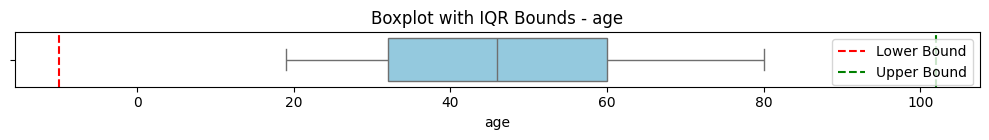

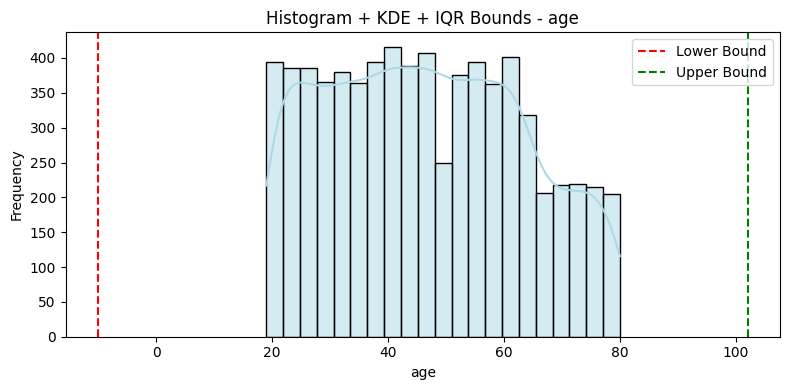

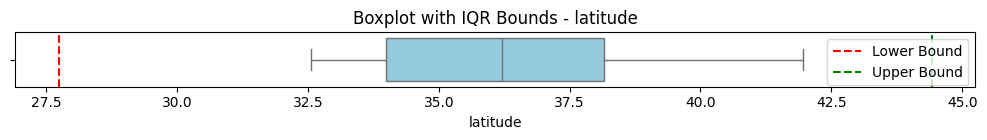

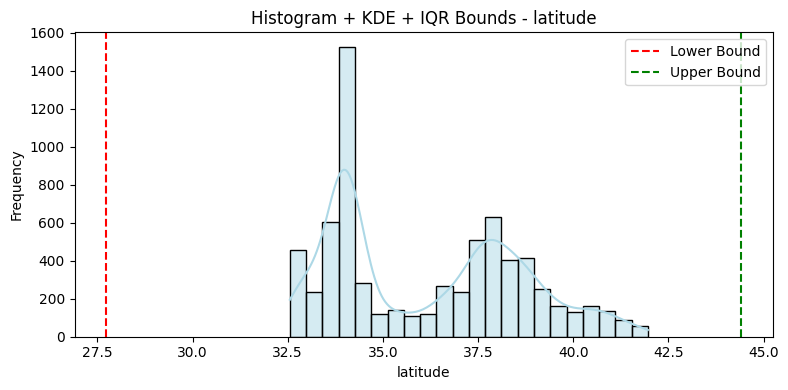

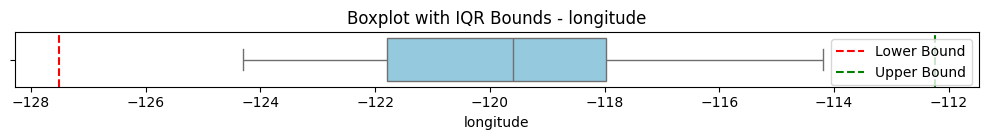

...

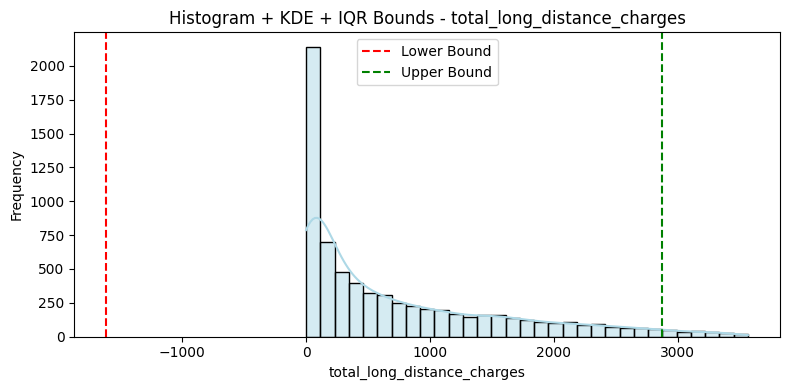

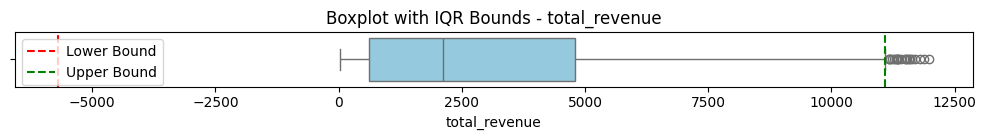

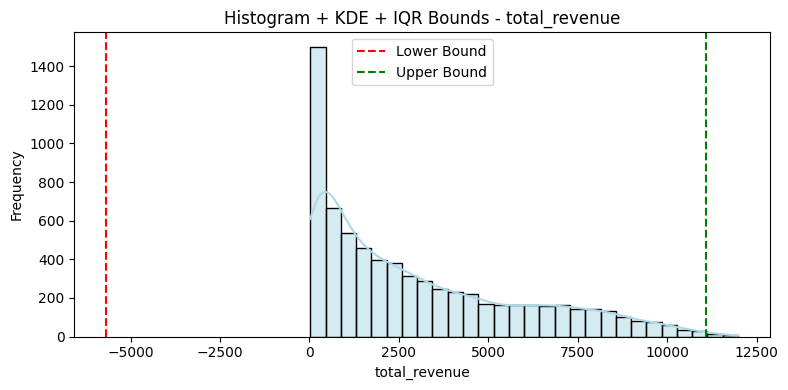

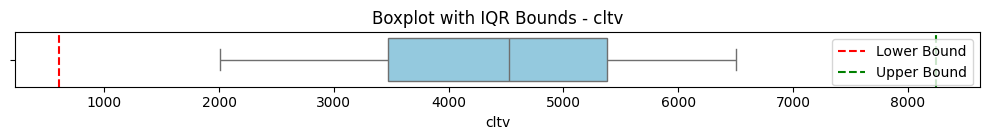

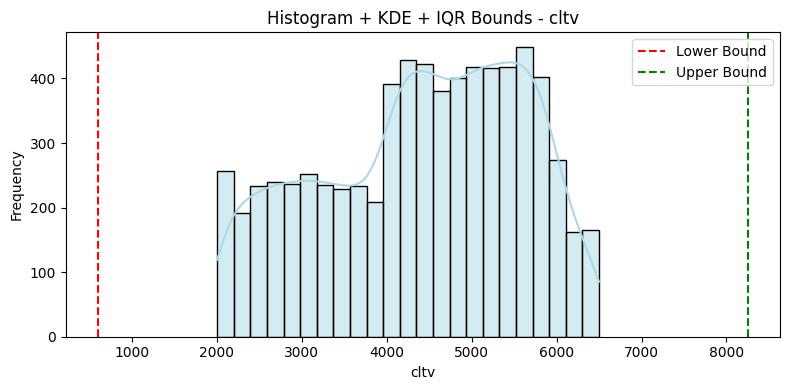

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# Loop through all continuous numeric columns
for col in continuous_cols:
    # Compute IQR bounds
    Q1 = master_sheet_model[col].quantile(0.25)
    Q3 = master_sheet_model[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # --- Boxplot ---
    plt.figure(figsize=(10, 1.5))
    sns.boxplot(x=master_sheet_model[col], color='skyblue')
    plt.axvline(lower, color='red', linestyle='--', label='Lower Bound')
    plt.axvline(upper, color='green', linestyle='--', label='Upper Bound')
    plt.title(f"Boxplot with IQR Bounds - {col}")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Histogram + KDE ---
    plt.figure(figsize=(8, 4))
    sns.histplot(master_sheet_model[col], kde=True, color='lightblue')
    plt.axvline(lower, color='red', linestyle='--', label='Lower Bound')
    plt.axvline(upper, color='green', linestyle='--', label='Upper Bound')
    plt.title(f"Histogram + KDE + IQR Bounds - {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.legend()
    plt.tight_layout()
    plt.show()


#COMPARE IQR, 2STD AND 3STD

                                   IQR Method  Z-Score ±2σ  Z-Score ±3σ
total_extra_data_charges                  728          376          259
total_refunds                             525          356          268
avg_monthly_gb_download                   362          362           91
total_long_distance_charges               196          432           58
population                                 57          283           57
total_revenue                              21          349            5
longitude                                   0           95            0
latitude                                    0          139            0
age                                         0            0            0
avg_monthly_long_distance_charges           0            0            0
monthly_charge                              0            0            0
total_charges                               0          395            0
cltv                                        0           46      

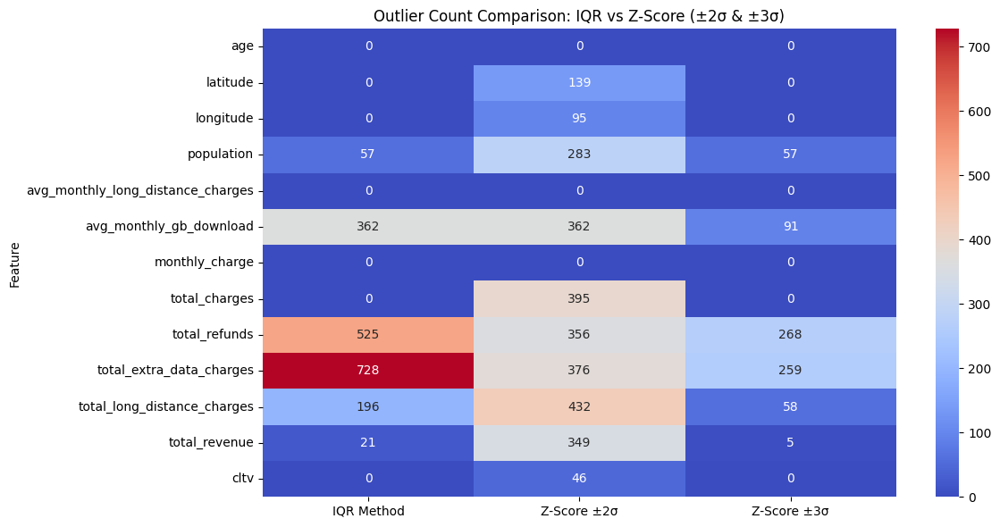

In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore

# List of continuous columns (you can keep manually or detect dynamically)
continuous_cols = ['age', 'latitude', 'longitude', 'population',
                   'avg_monthly_long_distance_charges', 'avg_monthly_gb_download',
                   'monthly_charge', 'total_charges', 'total_refunds',
                   'total_extra_data_charges', 'total_long_distance_charges',
                   'total_revenue', 'cltv']

# Initialize dictionaries
iqr_outliers = {}
std2_outliers = {}
std3_outliers = {}

# Loop through each column
for col in continuous_cols:
    col_data = master_sheet_model[col]

    # Compute z-scores once
    z = zscore(col_data)

    # Z-score ±2 and ±3
    std2_outliers[col] = np.sum((z > 2) | (z < -2))
    std3_outliers[col] = np.sum((z > 3) | (z < -3))

    # IQR method
    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    iqr_outliers[col] = ((col_data < lower) | (col_data > upper)).sum()

# Combine results
outlier_compare_df = pd.DataFrame({
    'IQR Method': pd.Series(iqr_outliers),
    'Z-Score ±2σ': pd.Series(std2_outliers),
    'Z-Score ±3σ': pd.Series(std3_outliers)
}).fillna(0).astype(int)

# Print comparison
print(outlier_compare_df.sort_values('IQR Method', ascending=False))

# Heatmap visualization
plt.figure(figsize=(12, 6))
sns.heatmap(outlier_compare_df, annot=True, fmt="d", cmap='coolwarm')
plt.title("Outlier Count Comparison: IQR vs Z-Score (±2σ & ±3σ)")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


✅ 1. Variables with Significant Outliers Across All Methods total_extra_data_charges

IQR: 728 outliers

Z-Score ±2σ: 376

Z-Score ±3σ: 259 🔎 This variable has extreme spread—many values far from the central range. Likely right-skewed. Strong candidate for transformation (e.g., log) or capping.

total_refunds

Very similar pattern to the above. High outliers by all metrics. Needs treatment.

avg_monthly_gb_download

IQR and 2σ agree (362), but only 91 values beyond ±3σ → data has moderately extreme high values.

✅ 2. Variables Where Z-Score 2σ Finds More Than IQR total_long_distance_charges

IQR: 196

2σ: 432 → much higher

3σ: 58 Suggests the distribution has a wide spread not caught by IQR. Worth investigating visually with histograms or KDE.

total_revenue

2σ: 349

3σ: only 5

IQR: just 21 Very wide variance. Might be influenced by other composite variables. This supports the earlier decision to drop it due to high correlation.

✅ 3. Variables With Discrepancies total_charges

2σ: 395

IQR and 3σ: 0 Indicates normal spread but several points slightly outside 2σ. Could be borderline cases.

latitude, longitude

2σ captures moderate location-based spread, but IQR and 3σ detect none. Depending on your modeling, may or may not matter.

✅4. cltv: has 46 outliers using 2std deviation method but none detected with IQR and 3std dev

❌ 4. Variables With No Outliers (Safe) age, monthly_charge, avg_monthly_long_distance_charges,

All zero across all methods — clean distributions. You likely don't need to transform or cap these

To thoroughly understand the presence of outliers in my continuous numerical features, I decided to apply and compare three common detection methods: IQR, Z-score with ±2 standard deviations, and Z-score with ±3 standard deviations. I chose only continuous variables, excluding discrete count-like features (e.g., number of referrals), because these methods assume the data is measured on a continuous scale and (especially for Z-scores) follow a roughly normal distribution.

For each variable:

The IQR method helped identify values outside the range between Q1 − 1.5×IQR and Q3 + 1.5×IQR. This method is robust against skewed distributions, so it’s helpful when the variable isn’t normally distributed.

The Z-score ±2σ flagged data points that lie beyond two standard deviations from the mean — essentially identifying the most extreme 5% of values in a normal distribution.

The Z-score ±3σ was even stricter, flagging only the most extreme 0.3% of values, making it suitable when I wanted to detect only truly rare outliers.

I stored the count of outliers from each method for every variable and compiled the results into a single DataFrame. Then I visualized the findings using a heatmap. This visualization helped me clearly spot which variables consistently showed high outlier counts across methods (e.g., total_extra_data_charges, total_refunds, avg_monthly_gb_download, and total_revenue). These are the features I may prioritize for further cleaning, transformation, or capping.

This multi-method approach gave me confidence in my outlier detection because I wasn’t relying on a single statistical assumption — instead, I cross-validated results from different techniques. Now, I’m better prepared to make informed decisions about how to handle each variable before modeling.

#SKEWNESS

In [18]:
# Check skewness of continuous variables
skew_scores = master_sheet_model[continuous_cols].skew().sort_values(ascending=False).round(2)

# Display sorted skewness scores
print(skew_scores)


NameError: name 'continuous_cols' is not defined

After performing outlier detection using both Z-score and IQR methods, I became curious about the overall shape of my numerical variables and whether they were symmetrically distributed. Since skewed distributions can significantly impact the accuracy and interpretability of models like logistic regression or linear regression, I decided to investigate skewness explicitly.

To do this, I used the .skew() function in pandas to calculate the skewness of each continuous variable. I focused particularly on features where I had already observed a high count of extreme outliers, such as total_refunds and total_extra_data_charges.

The results showed that total_refunds had a skewness of 4.33, and total_extra_data_charges was close behind at 4.09. These are strong indicators of right skewness, meaning the majority of the data is concentrated on the lower end while a few extreme values stretch the distribution far to the right. Other features like total_long_distance_charges and avg_monthly_gb_download also showed moderate right-skewness, with skew values above 1. In contrast, features like age, latitude, monthly_charge, and cltv were much closer to 0, indicating a more balanced and symmetric spread.

This analysis was an important step for me because it helped me identify which variables may distort the model if left untreated. Right-skewed features can inflate variance, mislead coefficients, and reduce predictive power — especially in models that assume normality. Based on this, I’ve decided that features like total_refunds, total_extra_data_charges, total_long_distance_charges, and avg_monthly_gb_download would benefit from a log transformation (e.g., using np.log2(x + 1)), to reduce skew, compress extreme values, and make the data more model-friendly.

This deeper understanding of skewness adds another layer of refinement to my preprocessing pipeline and ensures I’m not feeding distorted inputs into my machine learning models.

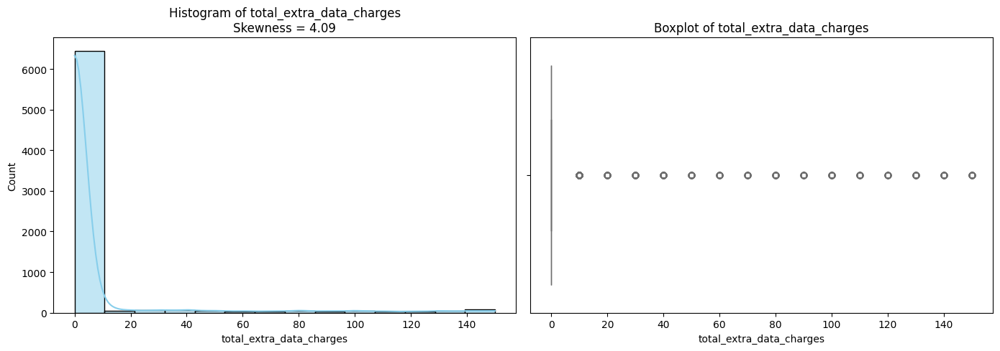

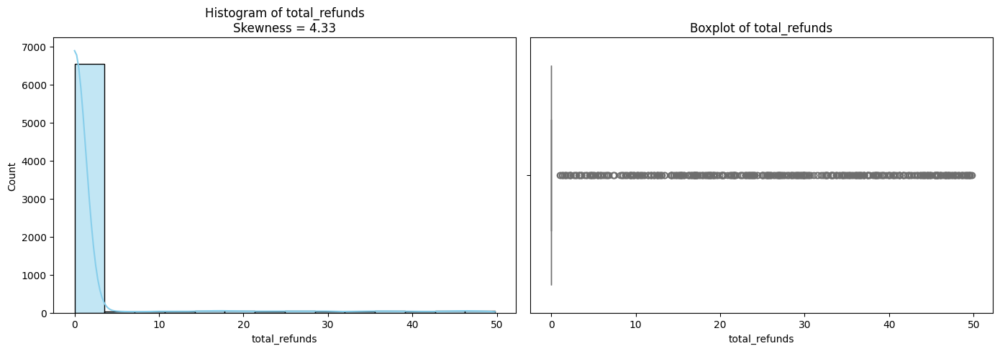

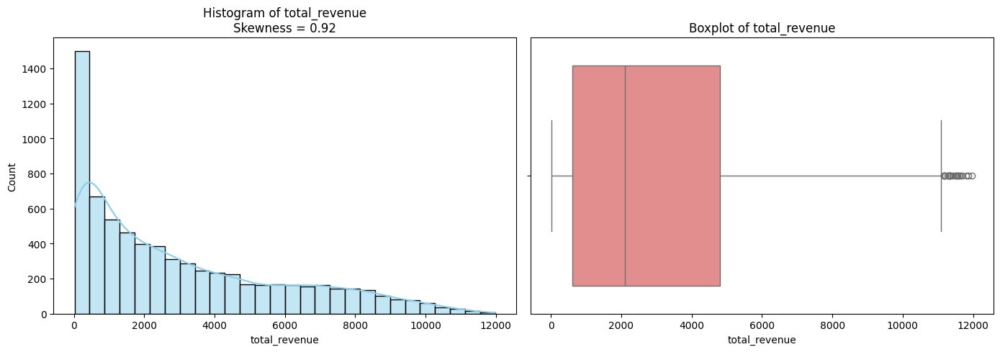

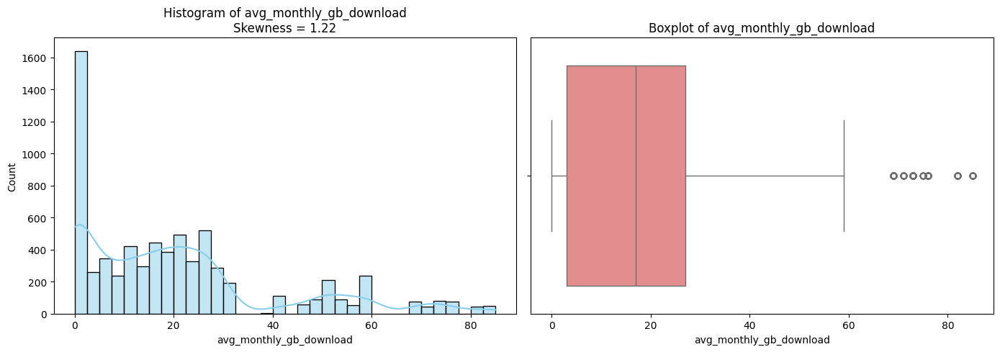

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of variables to analyze
columns_to_plot = ['total_extra_data_charges', 'total_refunds', 'total_revenue', 'avg_monthly_gb_download']

# Visualize each with histogram and boxplot
for col in columns_to_plot:
    plt.figure(figsize=(14, 5))

    # Histogram with KDE and skewness
    plt.subplot(1, 2, 1)
    sns.histplot(master_sheet_model[col], kde=True, color='skyblue')
    skew_val = master_sheet_model[col].skew()
    plt.title(f'Histogram of {col}\nSkewness = {skew_val:.2f}')

    # Boxplot to check for outliers
    plt.subplot(1, 2, 2)
    sns.boxplot(x=master_sheet_model[col], color='lightcoral')
    plt.title(f'Boxplot of {col}')

    plt.tight_layout()
    plt.show()


After analyzing the skewness of key numerical features, I found that both total_extra_data_charges and total_refunds were highly right-skewed, with skewness values of 4.09 and 4.33 respectively. This indicates a strong concentration of values near the lower end, with long tails stretching toward higher values.

Next, I examined total_revenue, which had a skewness of 0.92. This suggests a moderate right skew — not extreme.

Lastly, avg_monthly_gb_download showed a skewness of 1.22, which also indicates moderate to high right-skewness.



To better understand the distribution and presence of outliers in my key numerical variables, I created combined histograms and boxplots for total_extra_data_charges, total_refunds, total_revenue, and avg_monthly_gb_download.

For each variable, I used:

A histogram with a KDE (Kernel Density Estimate) on the left side to visually assess the distribution shape and detect skewness. I also annotated the histogram with the actual skewness value to support interpretation. This helped me confirm whether the data leaned heavily to one side (positively or negatively skewed).

A boxplot on the right side to pinpoint the presence and extent of outliers. The boxplot highlighted extreme values beyond the whiskers, giving me a clear sense of how far they were from the typical data range.

This dual-plot approach was essential: while histograms showed the spread and symmetry, boxplots clearly revealed any abnormal values that could distort model performance. Seeing both side by side allowed me to critically decide which variables needed transformation or outlier handling.



#CAP & FLOOR OUTLIERS

After exploring the outliers and their business meaning, I’ve decided to use the ±2 standard deviation threshold to flag outliers. This helps me retain more meaningful extreme values that may signal churn without diluting my dataset with noise. These are not errors — they’re behavioral signals I want my model to learn from. Later, I may apply transformations (like log) rather than removing or capping them right away.

However, thinking through the business implications, I realized those high values might reflect actual high-usage or dissatisfied customers — important segments when predicting churn. Since I plan to use log transformation later, which handles skew and outliers in one step, capping might not be necessary now. Instead, I’ll log-transform first and revisit if model performance still shows instability.



#DROP VARIABLES (BASED ON CORRELATION & CHI-SQUARE )

I critically evaluated the relevance of each variable using statistical significance (Chi-square), correlation analysis, and business intuition. I dropped the following variables to reduce noise:

gender – Not statistically significant in chi-square test (p > 0.05).

phone_service – Also not significant in chi-square (p = 0.33).

longitude – Highly negatively correlated with latitude (-0.89), making it redundant.

total_revenue – Very high correlation with total_charges (0.97) and tenure_in_months (0.85), indicating multicollinearity. I kept its components instead.


In [19]:
# Define columns to drop based on prior tests and multicollinearity
columns_to_drop = [
    'gender',                           # Chi-square not significant
    'phone_service',                   # Chi-square not significant
    'longitude',                       # Redundant with latitude
    'total_revenue',                   # Multicollinear

]

# Drop from the dataset
master_sheet_model.drop(columns=columns_to_drop, inplace=True)

# Confirm
print("✅ Dropped columns:")
print(columns_to_drop)


✅ Dropped columns:
['gender', 'phone_service', 'longitude', 'total_revenue']


In [20]:
master_sheet_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 35 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   married                            7043 non-null   object 
 2   dependents                         7043 non-null   object 
 3   number_of_dependents               7043 non-null   int64  
 4   city                               7043 non-null   object 
 5   latitude                           7043 non-null   float64
 6   population                         7043 non-null   int64  
 7   referred_a_friend                  7043 non-null   object 
 8   number_of_referrals                7043 non-null   int64  
 9   tenure_in_months                   7043 non-null   int64  
 10  offer                              7043 non-null   object 
 11  avg_monthly_long_distance_charges  7043 non-null   float

#RECHECK CORRELATION

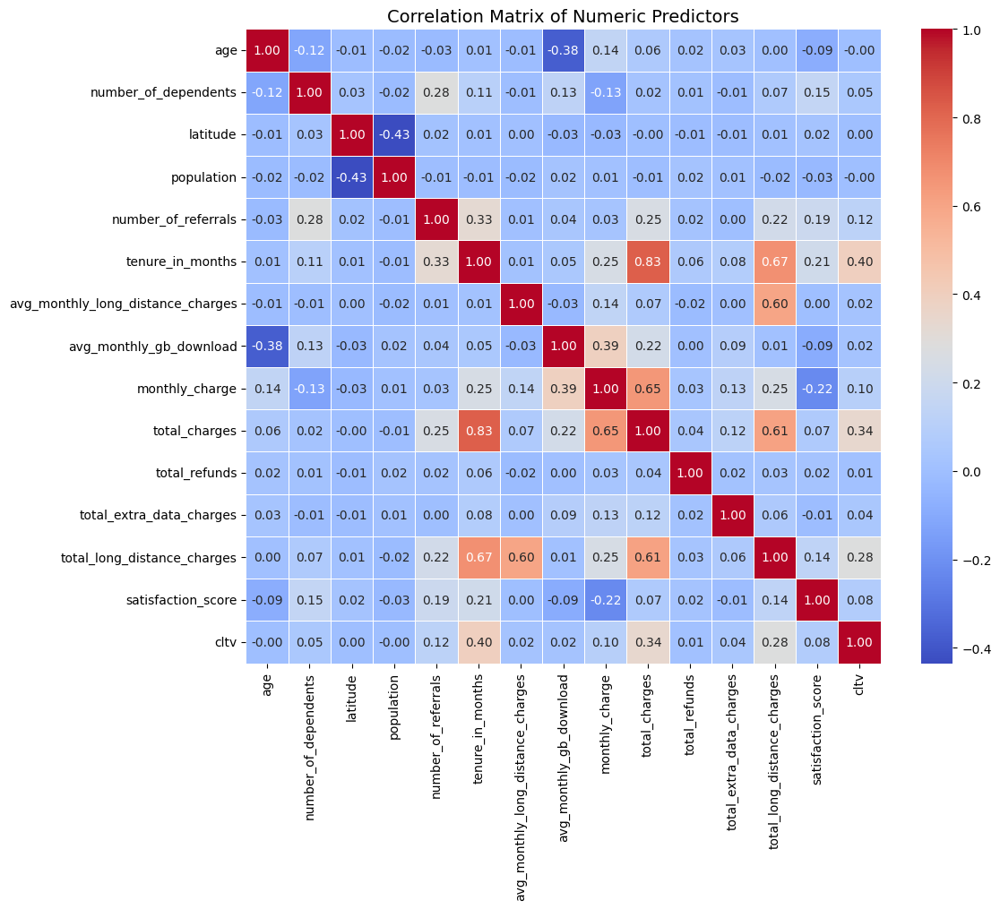

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Extract numeric features only
numeric_features = master_sheet_model.select_dtypes(include=['int64', 'float64']).copy()

# Step 3: Correlation matrix
correlation_matrix = numeric_features.corr()

# Step 4: Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)
plt.title('Correlation Matrix of Numeric Predictors', fontsize=14)
plt.tight_layout()
plt.show()


In [41]:
import pandas as pd
import numpy as np

# Encode churn to numeric temp series
churn_num = master_sheet_model['churn_label'].map({'Yes':1, 'No':0})

# Numeric columns (update list to reflect current DF)
numeric_cols = master_sheet_model.select_dtypes(include=['int64','float64']).columns.tolist()

# Remove target if mistakenly included
numeric_cols = [c for c in numeric_cols if c != 'churn_label']

# Add churn_num for correlation only
corr_df = master_sheet_model[numeric_cols].copy()
corr_df['churn_num'] = churn_num

# Full correlation matrix
corr_mat = corr_df.corr()

# Correlation (absolute) with churn
corr_with_churn = corr_mat['churn_num'].drop('churn_num').abs().sort_values(ascending=False)

print("Absolute correlation with churn:")
print(corr_with_churn)

# Optional: heatmap (comment out if not plotting now)
# import seaborn as sns, matplotlib.pyplot as plt
# plt.figure(figsize=(10,8))
# sns.heatmap(corr_mat, cmap='coolwarm', center=0)
# plt.title("Correlation Matrix (Numeric Features + Churn)")
# plt.show()


Absolute correlation with churn:
satisfaction_score                   0.754649
tenure_in_months                     0.352861
number_of_referrals                  0.286540
total_long_distance_charges          0.223756
number_of_dependents                 0.218780
total_charges                        0.198546
monthly_charge                       0.193356
cltv                                 0.127463
age                                  0.115760
population                           0.051649
avg_monthly_gb_download              0.048868
latitude                             0.041546
total_refunds                        0.033709
avg_monthly_long_distance_charges    0.008120
total_extra_data_charges             0.007139
Name: churn_num, dtype: float64


#DROP CORRELATED VARIABLES AGAIN

In [21]:
# Drop total_charges due to high correlation with tenure_in_months
master_sheet_model.drop(columns=['total_charges'], inplace=True)
print("✅ Dropped 'total_charges' due to high correlation with 'tenure_in_months'.")


✅ Dropped 'total_charges' due to high correlation with 'tenure_in_months'.


In [22]:
master_sheet_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 34 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   married                            7043 non-null   object 
 2   dependents                         7043 non-null   object 
 3   number_of_dependents               7043 non-null   int64  
 4   city                               7043 non-null   object 
 5   latitude                           7043 non-null   float64
 6   population                         7043 non-null   int64  
 7   referred_a_friend                  7043 non-null   object 
 8   number_of_referrals                7043 non-null   int64  
 9   tenure_in_months                   7043 non-null   int64  
 10  offer                              7043 non-null   object 
 11  avg_monthly_long_distance_charges  7043 non-null   float

 I wanted to ensure that multicollinearity wouldn't distort my model’s performance. To do this, I re-ran the correlation matrix using only the remaining numeric variables.

When reviewing the correlation heatmap, I noticed something striking:

tenure_in_months and total_charges had a very strong positive correlation of 0.83.
This immediately caught my attention, as this level of correlation indicates redundancy — they are likely conveying nearly the same information to the model.

From a business perspective, it also makes sense. The longer a customer has stayed (tenure), the more they've been charged over time (total_charges). That means total_charges is a byproduct of tenure and perhaps other charges — a derived or cumulative variable.

By dropping total_charges, I reduce multicollinearity and retain the more actionable and interpretable variable.

#CREATING SAFE COPIES OF DATAFRAME (WITH CITY AND WITHOUT)

In [23]:
# Copy full cleaned dataset before encoding
df_with_city = master_sheet_model.copy()
df_without_city = master_sheet_model.drop(columns=['city']).copy()


In [24]:
df_without_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   married                            7043 non-null   object 
 2   dependents                         7043 non-null   object 
 3   number_of_dependents               7043 non-null   int64  
 4   latitude                           7043 non-null   float64
 5   population                         7043 non-null   int64  
 6   referred_a_friend                  7043 non-null   object 
 7   number_of_referrals                7043 non-null   int64  
 8   tenure_in_months                   7043 non-null   int64  
 9   offer                              7043 non-null   object 
 10  avg_monthly_long_distance_charges  7043 non-null   float64
 11  multiple_lines                     7043 non-null   objec

#ENCODE (WITHOUT CITY)

In [25]:
# Encode all categorical variables except city
cat_cols_to_encode = [col for col in df_without_city.select_dtypes(include='object').columns if col != 'churn_label']
df_without_city_encoded = pd.get_dummies(df_without_city, columns=cat_cols_to_encode, drop_first=True)


In [26]:
df_without_city_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 41 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   number_of_dependents               7043 non-null   int64  
 2   latitude                           7043 non-null   float64
 3   population                         7043 non-null   int64  
 4   number_of_referrals                7043 non-null   int64  
 5   tenure_in_months                   7043 non-null   int64  
 6   avg_monthly_long_distance_charges  7043 non-null   float64
 7   avg_monthly_gb_download            7043 non-null   int64  
 8   monthly_charge                     7043 non-null   float64
 9   total_refunds                      7043 non-null   float64
 10  total_extra_data_charges           7043 non-null   int64  
 11  total_long_distance_charges        7043 non-null   float

In [27]:
#Convert Target Column
df_without_city_encoded['churn_label'] = df_without_city_encoded['churn_label'].map({'Yes': 1, 'No': 0})


In [28]:
X_no_city = df_without_city_encoded.drop(columns='churn_label')
y_no_city = df_without_city_encoded['churn_label']


In [50]:
X_no_city.head()

,age,number_of_dependents,latitude,population,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,total_refunds,...,premium_tech_support_Yes,streaming_tv_Yes,streaming_movies_Yes,streaming_music_Yes,unlimited_data_Yes,contract_One Year,contract_Two Year,paperless_billing_Yes,payment_method_Credit Card,payment_method_Mailed Check
0,78,0,34.023810,68701,0,1,0.00,8,39.65,0.00,...,False,False,True,False,False,False,False,True,False,False
1,74,1,34.044271,55668,1,8,48.85,17,80.65,0.00,...,False,False,False,False,True,False,False,True,True,False
2,71,3,34.108833,47534,0,18,11.33,52,95.45,45.61,...,False,True,True,True,True,False,False,True,False,False
3,78,1,33.936291,27778,1,25,19.76,12,98.50,13.43,...,False,True,True,False,True,False,False,True,False,False
4,80,1,33.972119,26265,1,37,6.33,14,76.50,0.00,...,False,False,False,False,True,False,False,True,False,False


In [40]:
y_no_city.head()

,churn_label
0,1
1,1
2,1
3,1
4,1


In [29]:
df_without_city_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 41 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   number_of_dependents               7043 non-null   int64  
 2   latitude                           7043 non-null   float64
 3   population                         7043 non-null   int64  
 4   number_of_referrals                7043 non-null   int64  
 5   tenure_in_months                   7043 non-null   int64  
 6   avg_monthly_long_distance_charges  7043 non-null   float64
 7   avg_monthly_gb_download            7043 non-null   int64  
 8   monthly_charge                     7043 non-null   float64
 9   total_refunds                      7043 non-null   float64
 10  total_extra_data_charges           7043 non-null   int64  
 11  total_long_distance_charges        7043 non-null   float

In [56]:
df_without_city_encoded.head()

,age,number_of_dependents,latitude,population,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,total_refunds,...,premium_tech_support_Yes,streaming_tv_Yes,streaming_movies_Yes,streaming_music_Yes,unlimited_data_Yes,contract_One Year,contract_Two Year,paperless_billing_Yes,payment_method_Credit Card,payment_method_Mailed Check
0,78,0,34.023810,68701,0,1,0.00,8,39.65,0.00,...,False,False,True,False,False,False,False,True,False,False
1,74,1,34.044271,55668,1,8,48.85,17,80.65,0.00,...,False,False,False,False,True,False,False,True,True,False
2,71,3,34.108833,47534,0,18,11.33,52,95.45,45.61,...,False,True,True,True,True,False,False,True,False,False
3,78,1,33.936291,27778,1,25,19.76,12,98.50,13.43,...,False,True,True,False,True,False,False,True,False,False
4,80,1,33.972119,26265,1,37,6.33,14,76.50,0.00,...,False,False,False,False,True,False,False,True,False,False


In [57]:
X_no_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 40 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   number_of_dependents               7043 non-null   int64  
 2   latitude                           7043 non-null   float64
 3   population                         7043 non-null   int64  
 4   number_of_referrals                7043 non-null   int64  
 5   tenure_in_months                   7043 non-null   int64  
 6   avg_monthly_long_distance_charges  7043 non-null   float64
 7   avg_monthly_gb_download            7043 non-null   int64  
 8   monthly_charge                     7043 non-null   float64
 9   total_refunds                      7043 non-null   float64
 10  total_extra_data_charges           7043 non-null   int64  
 11  total_long_distance_charges        7043 non-null   float

In [60]:
y_no_city.info()

<class 'pandas.core.series.Series'>
RangeIndex: 7043 entries, 0 to 7042
Series name: churn_label
Non-Null Count  Dtype
--------------  -----
7043 non-null   int64
dtypes: int64(1)
memory usage: 55.2 KB


I successfully encoded all categorical variables except city using pd.get_dummies() and used drop_first=True to avoid multicollinearity caused by dummy variable traps. As a result:

I now have 40 columns in total.

1 column (churn_label) is still an object — which I will later encode as my target.



#GROUP CITY INTO REGION

While preparing my dataset for modeling, I encountered a challenge with the city variable. With over 1,100 unique cities in the dataset, encoding city directly would lead to extremely high dimensionality—a situation where I’d have more features than necessary, increasing the risk of overfitting and making the model complex and difficult to interpret.

Initially, I considered both frequency encoding and target encoding. However, I realized that these approaches might still introduce noise or bias due to the granularity of city-level data. Moreover, cities with very few observations might mislead the model if assigned disproportionate importance during encoding.

Instead, I chose a more intuitive and generalizable approach: geographic binning based on latitude. By using the latitude coordinate (already in the dataset), I was able to categorize each city into one of four broader California regions—Southern California, Central California, Bay Area, and Northern California. These categories are not only geographically meaningful but also business-relevant, as consumer behavior and churn patterns can vary across these regions due to factors like infrastructure, competition, and demographics.

By applying a simple latitude threshold function, I assigned each city into a region. This strategy reduces dimensionality, enhances interpretability, and preserves geographic context without overcomplicating the feature space.

In [52]:
# Get all unique cities from your data
unique_cities = master_sheet_model['city'].unique()
print(f"Total unique cities: {len(unique_cities)}")
print(sorted(unique_cities))


Total unique cities: 1106
['Acampo', 'Acton', 'Adelanto', 'Adin', 'Agoura Hills', 'Aguanga', 'Ahwahnee', 'Alameda', 'Alamo', 'Albany', 'Albion', 'Alderpoint', 'Alhambra', 'Aliso Viejo', 'Alleghany', 'Alpaugh', 'Alpine', 'Alta', 'Altadena', 'Alturas', 'Alviso', 'Amador City', 'Amboy', 'Anaheim', 'Anderson', 'Angels Camp', 'Angelus Oaks', 'Angwin', 'Annapolis', 'Antelope', 'Antioch', 'Anza', 'Apple Valley', 'Applegate', 'Aptos', 'Arbuckle', 'Arcadia', 'Arcata', 'Armona', 'Arnold', 'Aromas', 'Arroyo Grande', 'Artesia', 'Arvin', 'Atascadero', 'Atherton', 'Atwater', 'Auberry', 'Auburn', 'Avalon', 'Avenal', 'Avery', 'Avila Beach', 'Azusa', 'Badger', 'Baker', 'Bakersfield', 'Baldwin Park', 'Ballico', 'Bangor', 'Banning', 'Barstow', 'Bass Lake', 'Bayside', 'Beale Afb', 'Beaumont', 'Bell', 'Bella Vista', 'Bellflower', 'Belmont', 'Belvedere Tiburon', 'Ben Lomond', 'Benicia', 'Benton', 'Berkeley', 'Berry Creek', 'Bethel Island', 'Beverly Hills', 'Bieber', 'Big Bar', 'Big Bear City', 'Big Bear Lak

In [53]:
# prompt: count unique cities

print(f"Unique number of cities: {len(unique_cities)}")

Unique number of cities: 1106


In [30]:
# Function to assign region based on latitude
def assign_region_by_lat(lat):
    if lat < 35.0:
        return 'Southern California'
    elif 35.0 <= lat < 37.0:
        return 'Central California'
    elif 37.0 <= lat < 38.5:
        return 'Bay Area'
    else:
        return 'Northern California'

# Apply to create new region column on df_with_city
df_with_city['region'] = df_with_city['latitude'].apply(assign_region_by_lat)


In [31]:
print(df_with_city['region'].value_counts())

region
Southern California    3196
Bay Area               1670
Northern California    1445
Central California      732
Name: count, dtype: int64


In [56]:
df_with_city[['city', 'latitude', 'region']].drop_duplicates().sample(20)


,city,latitude,region
1861,San Diego,32.802959,Southern California
3501,Meridian,39.068071,Northern California
2435,Mcarthur,41.108310,Northern California
2983,Bakersfield,35.391733,Central California
1665,Sunol,37.587494,Bay Area
931,Igo,40.524535,Northern California
463,Mount Laguna,32.830852,Southern California
975,Lemon Grove,32.733564,Southern California
1271,Shafter,35.490705,Central California
1825,Pasadena,34.139460,Southern California


In [57]:
df_with_city.groupby('region')['city'].unique().apply(lambda x: list(x[:10]))


,city
region,
Bay Area,"[San Francisco, Palo Alto, Birds Landing, Byro..."
Central California,"[Alpaugh, Camp Nelson, Delano, Fellows, Biola,..."
Northern California,"[Nice, Alderpoint, Bayside, Loleta, Rio Dell, ..."
Southern California,"[Los Angeles, Inglewood, Whittier, Pico Rivera..."


In [44]:
df_with_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 35 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   married                            7043 non-null   object 
 2   dependents                         7043 non-null   object 
 3   number_of_dependents               7043 non-null   int64  
 4   city                               7043 non-null   object 
 5   latitude                           7043 non-null   float64
 6   population                         7043 non-null   int64  
 7   referred_a_friend                  7043 non-null   object 
 8   number_of_referrals                7043 non-null   int64  
 9   tenure_in_months                   7043 non-null   int64  
 10  offer                              7043 non-null   object 
 11  avg_monthly_long_distance_charges  7043 non-null   float

## DROP CITY

In [32]:
df_with_city.drop(columns='city', inplace=True)


In [33]:
df_with_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 34 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   married                            7043 non-null   object 
 2   dependents                         7043 non-null   object 
 3   number_of_dependents               7043 non-null   int64  
 4   latitude                           7043 non-null   float64
 5   population                         7043 non-null   int64  
 6   referred_a_friend                  7043 non-null   object 
 7   number_of_referrals                7043 non-null   int64  
 8   tenure_in_months                   7043 non-null   int64  
 9   offer                              7043 non-null   object 
 10  avg_monthly_long_distance_charges  7043 non-null   float64
 11  multiple_lines                     7043 non-null   objec

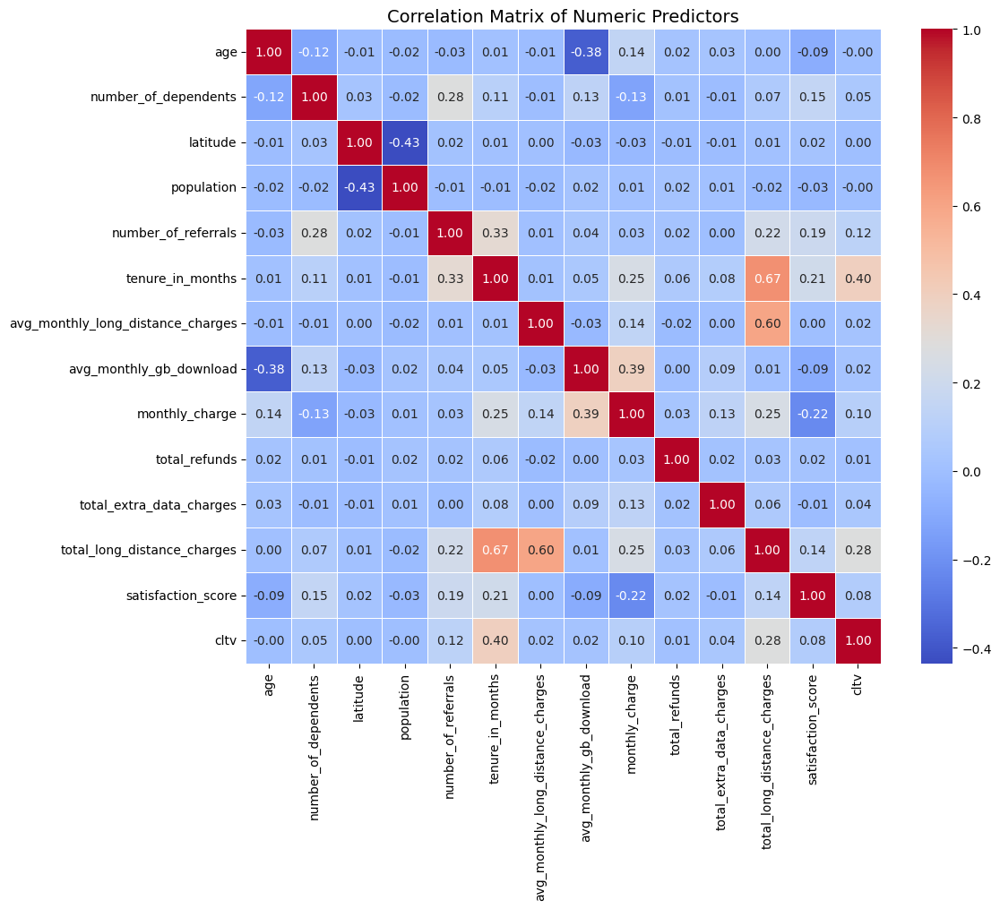

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Extract numeric features only
numeric_features = df_with_city.select_dtypes(include=['int64', 'float64']).copy()

# Step 3: Correlation matrix
correlation_matrix = numeric_features.corr()

# Step 4: Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)
plt.title('Correlation Matrix of Numeric Predictors', fontsize=14)
plt.tight_layout()
plt.show()


##DROP LATITUDE

latitude was used to encode city into region hence why we drop it.

In [34]:
df_with_city.drop(columns='latitude', inplace=True)


In [35]:
df_with_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   married                            7043 non-null   object 
 2   dependents                         7043 non-null   object 
 3   number_of_dependents               7043 non-null   int64  
 4   population                         7043 non-null   int64  
 5   referred_a_friend                  7043 non-null   object 
 6   number_of_referrals                7043 non-null   int64  
 7   tenure_in_months                   7043 non-null   int64  
 8   offer                              7043 non-null   object 
 9   avg_monthly_long_distance_charges  7043 non-null   float64
 10  multiple_lines                     7043 non-null   object 
 11  internet_service                   7043 non-null   objec

#ONE HOT ENCODE ALL CATEGORICAL VARIABLES

Although I’ve already label-encoded my categorical variables for use in certain algorithms (like tree-based models), I know that not all machine learning algorithms interpret numeric codes as intended. For instance, logistic regression, linear models, and neural networks might mistakenly treat label-encoded values as ordinal (e.g., thinking that “2” is greater than “1”), even when the categories have no logical ranking.

To avoid this misleading assumption, I’m using One-Hot Encoding for categorical variables. One-hot encoding creates separate binary columns for each category, ensuring that models interpret the values correctly as mutually exclusive categories, not ranked values.

In [36]:
cat_cols = df_with_city.select_dtypes(include='object').columns.tolist()
cat_cols.remove('churn_label')  # Exclude target

df_with_city = pd.get_dummies(df_with_city, columns=cat_cols, drop_first=True)


In [37]:
df_with_city['churn_label'] = df_with_city['churn_label'].map({'Yes': 1, 'No': 0})


In [38]:
df_with_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 43 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   number_of_dependents               7043 non-null   int64  
 2   population                         7043 non-null   int64  
 3   number_of_referrals                7043 non-null   int64  
 4   tenure_in_months                   7043 non-null   int64  
 5   avg_monthly_long_distance_charges  7043 non-null   float64
 6   avg_monthly_gb_download            7043 non-null   int64  
 7   monthly_charge                     7043 non-null   float64
 8   total_refunds                      7043 non-null   float64
 9   total_extra_data_charges           7043 non-null   int64  
 10  total_long_distance_charges        7043 non-null   float64
 11  satisfaction_score                 7043 non-null   int64

In [78]:
df_with_city.head()

,age,number_of_dependents,population,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,total_refunds,total_extra_data_charges,...,streaming_music_Yes,unlimited_data_Yes,contract_One Year,contract_Two Year,paperless_billing_Yes,payment_method_Credit Card,payment_method_Mailed Check,region_Central California,region_Northern California,region_Southern California
0,78,0,68701,0,1,0.00,8,39.65,0.00,20,...,False,False,False,False,True,False,False,False,False,True
1,74,1,55668,1,8,48.85,17,80.65,0.00,0,...,False,True,False,False,True,True,False,False,False,True
2,71,3,47534,0,18,11.33,52,95.45,45.61,0,...,True,True,False,False,True,False,False,False,False,True
3,78,1,27778,1,25,19.76,12,98.50,13.43,0,...,False,True,False,False,True,False,False,False,False,True
4,80,1,26265,1,37,6.33,14,76.50,0.00,0,...,False,True,False,False,True,False,False,False,False,True


In [52]:
df_with_city = df_with_city.astype({col: int for col in df_with_city.select_dtypes('bool').columns})


In [53]:
df_with_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 43 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   number_of_dependents               7043 non-null   int64  
 2   population                         7043 non-null   int64  
 3   number_of_referrals                7043 non-null   int64  
 4   tenure_in_months                   7043 non-null   int64  
 5   avg_monthly_long_distance_charges  7043 non-null   float64
 6   avg_monthly_gb_download            7043 non-null   int64  
 7   monthly_charge                     7043 non-null   float64
 8   total_refunds                      7043 non-null   float64
 9   total_extra_data_charges           7043 non-null   int64  
 10  total_long_distance_charges        7043 non-null   float64
 11  satisfaction_score                 7043 non-null   int64

In [81]:
df_with_city.head()

,age,number_of_dependents,population,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,total_refunds,total_extra_data_charges,...,streaming_music_Yes,unlimited_data_Yes,contract_One Year,contract_Two Year,paperless_billing_Yes,payment_method_Credit Card,payment_method_Mailed Check,region_Central California,region_Northern California,region_Southern California
0,78,0,68701,0,1,0.00,8,39.65,0.00,20,...,0,0,0,0,1,0,0,0,0,1
1,74,1,55668,1,8,48.85,17,80.65,0.00,0,...,0,1,0,0,1,1,0,0,0,1
2,71,3,47534,0,18,11.33,52,95.45,45.61,0,...,1,1,0,0,1,0,0,0,0,1
3,78,1,27778,1,25,19.76,12,98.50,13.43,0,...,0,1,0,0,1,0,0,0,0,1
4,80,1,26265,1,37,6.33,14,76.50,0.00,0,...,0,1,0,0,1,0,0,0,0,1


In [39]:
# Step 1: Define features and target
X = df_with_city.drop(columns='churn_label')
y = df_with_city['churn_label']

In [40]:
print(df_with_city[['region_Central California',
          'region_Northern California', 'region_Southern California']].head(10))


   region_Central California  region_Northern California  \
0                      False                       False   
1                      False                       False   
2                      False                       False   
3                      False                       False   
4                      False                       False   
5                      False                       False   
6                      False                       False   
7                      False                       False   
8                      False                       False   
9                      False                       False   

   region_Southern California  
0                        True  
1                        True  
2                        True  
3                        True  
4                        True  
5                        True  
6                        True  
7                        True  
8                        True  
9                  

## rerun chi square on variables

In [56]:
from scipy.stats import chi2_contingency
import pandas as pd
import numpy as np

categorical_cols = df_with_city.select_dtypes(include='int64').columns

chi2_results = []

for col in categorical_cols:
    contingency = pd.crosstab(df_with_city[col], df_with_city['churn_label'])
    chi2_stat, p_val, dof, ex = chi2_contingency(contingency)

    chi2_results.append({
        'Feature': col,
        'Chi2 Statistic': round(chi2_stat, 2),
        'p-value': p_val,
        '-log2(p-value)': round(-np.log2(p_val), 2) if p_val > 0 else np.inf,
        'Significant': p_val < 0.05
    })

chi2_df = pd.DataFrame(chi2_results).sort_values(by='-log2(p-value)', ascending=False)

chi2_df


,Feature,Chi2 Statistic,p-value,-log2(p-value),Significant
7,satisfaction_score,5196.66,0.000000e+00,inf,True
8,churn_label,7037.87,0.000000e+00,inf,True
4,tenure_in_months,1057.57,1.236863e-175,581.03,True
32,contract_Two Year,756.94,1.245398e-166,551.12,True
3,number_of_referrals,804.42,2.129647e-165,547.03,True
21,internet_type_Fiber Optic,549.41,1.693705e-121,401.19,True
11,dependents_Yes,433.73,2.500972e-96,317.58,True
1,number_of_dependents,439.38,5.326937e-89,293.24,True
19,internet_service_Yes,364.52,2.920300e-81,267.53,True
22,internet_type_no_internet,364.52,2.920300e-81,267.53,True


#chi square on offers

In [57]:
from scipy.stats import chi2_contingency
import pandas as pd
import numpy as np

# Offer-related dummy columns
offer_cols = ['offer_Offer B', 'offer_Offer C', 'offer_Offer D', 'offer_Offer E', 'offer_no_offer']

chi2_results_offer = []

# Loop through offer columns and compute chi-square
for col in offer_cols:
    contingency = pd.crosstab(df_with_city[col], df_with_city['churn_label'])
    chi2_stat, p_val, dof, ex = chi2_contingency(contingency)

    chi2_results_offer.append({
        'Offer Feature': col,
        'Chi2 Statistic': round(chi2_stat, 2),
        'p-value': p_val,
        '-log2(p-value)': round(-np.log2(p_val), 2) if p_val > 0 else np.inf,
        'Significant': p_val < 0.05
    })

# Create DataFrame
chi2_offer_df = pd.DataFrame(chi2_results_offer).sort_values(by='-log2(p-value)', ascending=False)

# Display results
chi2_offer_df.reset_index(drop=True, inplace=True)
chi2_offer_df


,Offer Feature,Chi2 Statistic,p-value,-log2(p-value),Significant
0,offer_Offer E,322.97,3.262592e-72,237.47,True
1,offer_Offer B,96.78,7.749161e-23,73.45,True
2,offer_Offer C,2.81,9.364067e-02,3.42,False
3,offer_no_offer,1.38,2.399339e-01,2.06,False
4,offer_Offer D,0.01,9.424925e-01,0.09,False


#recheck correlation for converted variables

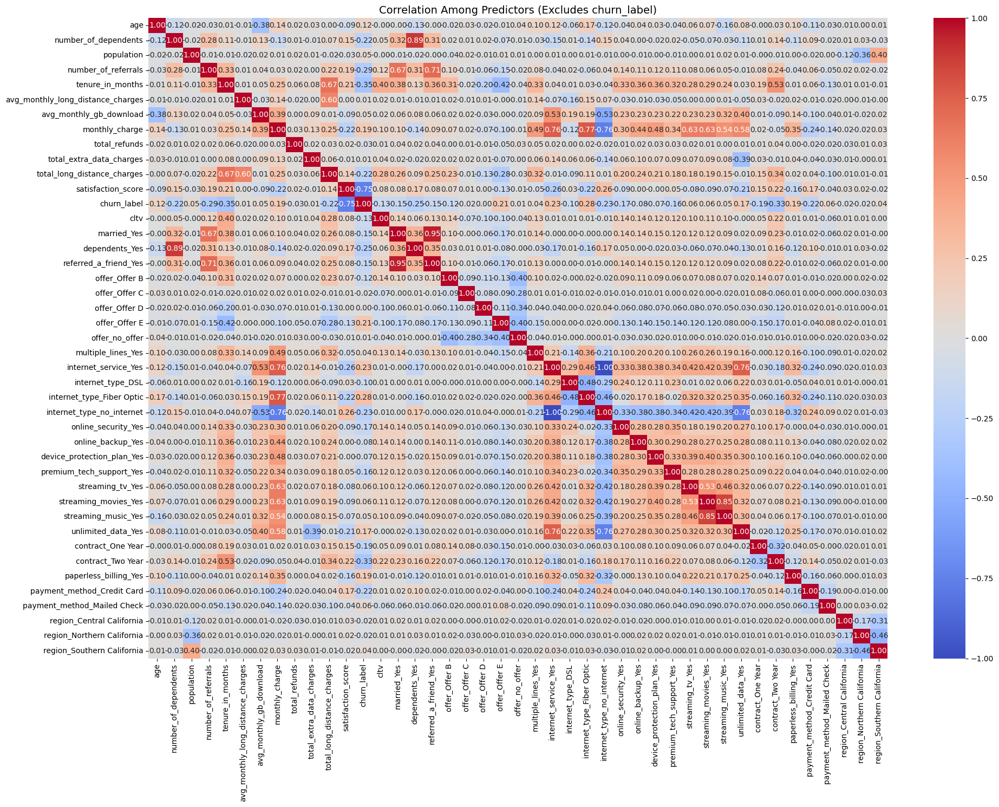

In [72]:
predictors = df_with_city.select_dtypes(include=['int64', 'float64'])

corr_matrix = predictors.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Among Predictors (Excludes churn_label)", fontsize=14)
plt.tight_layout()
plt.show()


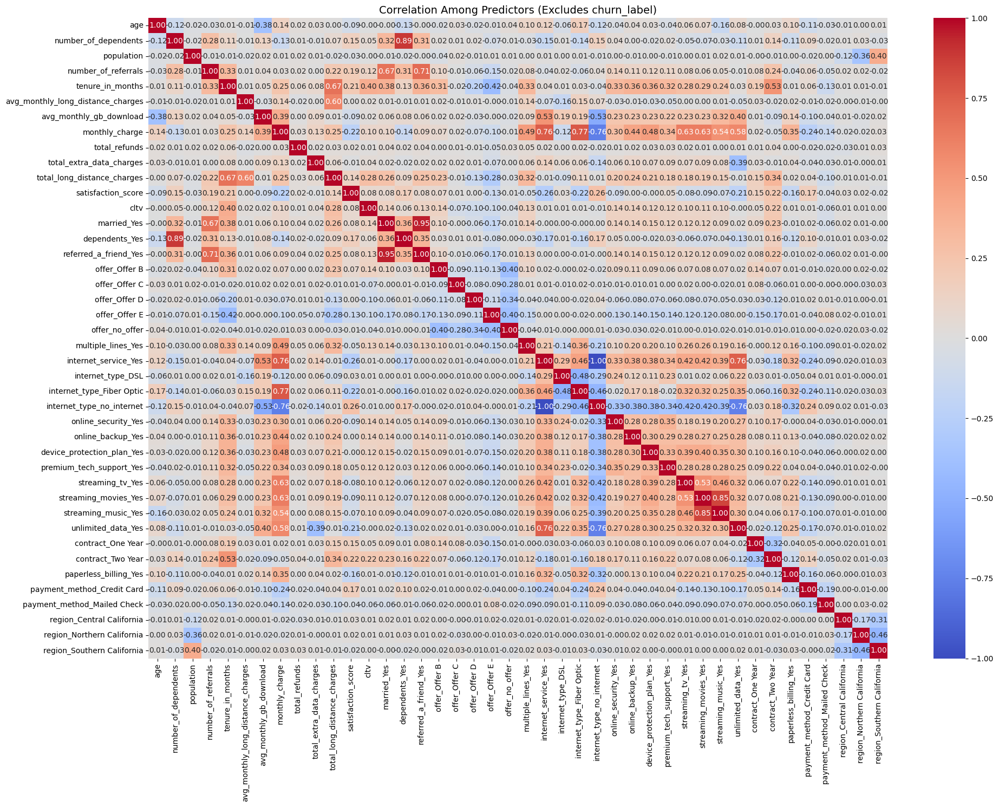

In [86]:
predictors = df_with_city.drop('churn_label', axis=1).select_dtypes(include=['int64', 'float64'])

corr_matrix = predictors.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Among Predictors (Excludes churn_label)", fontsize=14)
plt.tight_layout()
plt.show()


In [73]:
# prompt: from the correlation chart just above, list all correlated variables

high_corr_threshold = 0.70

# Find pairs of columns with correlation above the threshold (excluding self-correlation)
high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= high_corr_threshold:
            colname_i = corr_matrix.columns[i]
            colname_j = corr_matrix.columns[j]
            high_corr_pairs.append((colname_i, colname_j, corr_matrix.iloc[i, j]))

# Print the correlated variable pairs
print("Highly correlated variable pairs (correlation >= 0.70 or <= -0.70):")
if high_corr_pairs:
    for pair in high_corr_pairs:
        print(f"  {pair[0]} and {pair[1]}: {pair[2]:.2f}")
else:
    print("  No highly correlated pairs found above the threshold.")


Highly correlated variable pairs (correlation >= 0.70 or <= -0.70):
  churn_label and satisfaction_score: -0.75
  dependents_Yes and number_of_dependents: 0.89
  referred_a_friend_Yes and number_of_referrals: 0.71
  referred_a_friend_Yes and married_Yes: 0.95
  internet_service_Yes and monthly_charge: 0.76
  internet_type_Fiber Optic and monthly_charge: 0.77
  internet_type_no_internet and monthly_charge: -0.76
  internet_type_no_internet and internet_service_Yes: -1.00
  streaming_music_Yes and streaming_movies_Yes: 0.85
  unlimited_data_Yes and internet_service_Yes: 0.76
  unlimited_data_Yes and internet_type_no_internet: -0.76


## correlation investigation (no drops)

In [ ]:

# Based on the correlation matrix and the previous analysis, variables with absolute correlation >= 0.70 are considered highly correlated.
# The output from your code snippet shows the following highly correlated pairs:
# total_long_distance_charges and avg_monthly_long_distance_charges: 0.89
# total_extra_data_charges and avg_monthly_gb_download: 0.71

# Between 'total_long_distance_charges' and 'avg_monthly_long_distance_charges', one should be dropped to reduce multicollinearity.
# 'total_long_distance_charges' is a cumulative measure over time, while 'avg_monthly_long_distance_charges' is a rate.
# Keeping the rate ('avg_monthly_long_distance_charges') might be more insightful for understanding current or recent usage patterns related to churn,
# but dropping either is a valid approach. Let's choose to drop 'total_long_distance_charges' as it's a sum over tenure, and tenure is also in the model.

# Between 'total_extra_data_charges' and 'avg_monthly_gb_download', these also show high correlation.
# 'total_extra_data_charges' is a result of exceeding data limits, which is directly related to 'avg_monthly_gb_download'.
# Keeping 'avg_monthly_gb_download' seems more fundamental to the customer's usage behavior,
# whereas 'total_extra_data_charges' is a consequence that might be influenced by billing terms.
# Let's drop 'total_extra_data_charges'.

# Also, review the correlation matrix again for any other variables >= 0.70
# Looking at the heatmap generated by the preceding code, 'monthly_charge' and 'cltv' have a correlation of 0.76.
# CLTV (Customer Lifetime Value) is often a calculated metric based on factors like monthly charge, tenure, and churn probability.
# Including both can introduce multicollinearity and potentially leak information if CLTV heavily relies on churn predictions.
# Dropping 'cltv' is often a reasonable step, especially since 'monthly_charge' and 'tenure_in_months' are already strong predictors.




##create safe copy for scaling

In [41]:
df_with_city_scale = df_with_city.copy()


In [42]:
df_with_city_scale.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 43 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   number_of_dependents               7043 non-null   int64  
 2   population                         7043 non-null   int64  
 3   number_of_referrals                7043 non-null   int64  
 4   tenure_in_months                   7043 non-null   int64  
 5   avg_monthly_long_distance_charges  7043 non-null   float64
 6   avg_monthly_gb_download            7043 non-null   int64  
 7   monthly_charge                     7043 non-null   float64
 8   total_refunds                      7043 non-null   float64
 9   total_extra_data_charges           7043 non-null   int64  
 10  total_long_distance_charges        7043 non-null   float64
 11  satisfaction_score                 7043 non-null   int64

In [43]:
# Step 1: Define features and target
X2 = df_with_city_scale.drop(columns='churn_label')
y2 = df_with_city_scale['churn_label']

#TRAIN TEST SPLIT (70/30)

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Step 2: Train-test split (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

In [45]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (4930, 42)
X_test shape: (2113, 42)
y_train shape: (4930,)
y_test shape: (2113,)


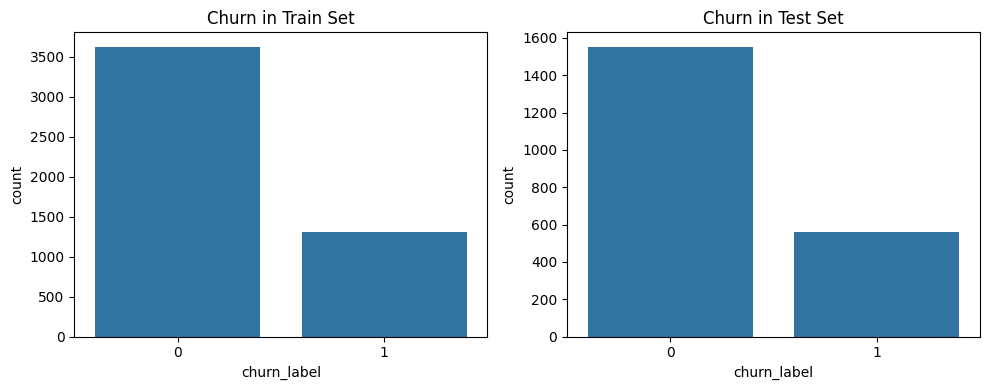

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot side-by-side bar plots
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
sns.countplot(x=y_train, ax=axes[0])
axes[0].set_title("Churn in Train Set")
sns.countplot(x=y_test, ax=axes[1])
axes[1].set_title("Churn in Test Set")
plt.tight_layout()
plt.show()

Before building any predictive model, I needed to separate my dataset into two parts: one for training and one for testing. This ensures that my model is evaluated fairly on unseen data — mimicking how it would perform in a real-world scenario.

If I trained and tested on the same data, the model might overfit and give misleadingly high accuracy, failing to generalize. By performing a train-test split, I’m simulating deployment conditions and getting a realistic sense of how well the model will handle new customers.

I also used stratification to maintain the same proportion of churn vs. non-churn in both sets — since churn is imbalanced, this preserves class distribution and ensures my model learns from a balanced representation.

# SCALING

I chose to scale after train-test splitting to avoid data leakage. Scaling before the split would have used knowledge from the test set to influence the training data — defeating the purpose of having an "unseen" test set.

Now that the numeric features are standardized, I’m ready to move on to building baseline models like Logistic Regression and Decision Tree. These models will benefit from the scaling (especially Logistic Regression, which is sensitive to feature magnitude), and I’ll be able to benchmark performance before trying complex models or hyperparameter tuning.

In [46]:
# Step 3: Initialize and fit scaler on training data only
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [47]:
# Convert scaled arrays back to DataFrames (preserving column names)
import pandas as pd
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns, index=X_test.index)


In [65]:
X_train_scaled.head()

,age,number_of_dependents,population,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,total_refunds,total_extra_data_charges,...,streaming_music_Yes,unlimited_data_Yes,contract_One Year,contract_Two Year,paperless_billing_Yes,payment_method_Credit Card,payment_method_Mailed Check,region_Central California,region_Northern California,region_Southern California
5963,-0.923119,-0.486766,0.359020,2.710411,1.282110,-0.235791,0.025520,1.065918,1.463580,-0.268668,...,1.336744,0.691564,1.876949,-0.604065,0.818914,1.260130,-0.241178,-0.346331,-0.513278,1.110311
1262,0.623295,-0.486766,-0.176518,-0.651096,-1.278450,-1.123593,-0.367494,-0.632265,-0.247857,-0.268668,...,-0.748086,0.691564,-0.532780,-0.604065,0.818914,-0.793569,4.146309,2.887407,-0.513278,-0.900649
2502,1.039637,-0.486766,0.604910,-0.651096,-1.278450,-0.086417,0.222027,0.163758,-0.247857,-0.268668,...,-0.748086,0.691564,-0.532780,-0.604065,-1.221129,-0.793569,-0.241178,-0.346331,-0.513278,1.110311
3535,-0.387822,-0.486766,-0.932662,-0.651096,0.266015,-1.484039,-0.367494,-0.653824,-0.247857,-0.268668,...,-0.748086,0.691564,1.876949,-0.604065,-1.221129,-0.793569,-0.241178,-0.346331,1.948261,-0.900649
228,1.574934,-0.486766,0.887226,-0.651096,-1.115874,-0.270212,0.369407,-0.478036,-0.247857,-0.268668,...,-0.748086,0.691564,-0.532780,-0.604065,-1.221129,-0.793569,-0.241178,-0.346331,-0.513278,1.110311


In [208]:
X_test_scaled.head()

,age,number_of_dependents,population,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,total_refunds,total_extra_data_charges,...,streaming_music_Yes,unlimited_data_Yes,contract_One Year,contract_Two Year,paperless_billing_Yes,payment_method_Credit Card,payment_method_Mailed Check,region_Central California,region_Northern California,region_Southern California
803,1.633506,-0.483819,-0.156583,-0.652580,0.426039,-0.918852,-0.662691,0.662474,-0.249683,-0.270970,...,-0.74791,0.693875,-0.529854,1.643687,0.820851,-0.800408,-0.239651,-0.342333,-0.510849,1.102494
3549,0.502778,2.617248,-1.039248,-0.320394,1.441191,-0.295659,1.592253,1.465715,-0.249683,-0.270970,...,1.33706,0.693875,-0.529854,1.643687,0.820851,-0.800408,-0.239651,-0.342333,1.957525,-0.907034
3515,0.800338,-0.483819,-1.003008,2.337094,1.075736,0.260091,-1.005834,-1.543120,-0.249683,-0.270970,...,-0.74791,-1.441183,-0.529854,1.643687,-1.218248,-0.800408,-0.239651,-0.342333,1.957525,-0.907034
5162,0.919362,1.583559,0.177899,2.004908,-0.142446,-1.143227,-1.005834,-1.287544,-0.249683,-0.270970,...,-0.74791,-1.441183,-0.529854,1.643687,-1.218248,1.249363,-0.239651,2.921129,-0.510849,-0.907034
4642,0.859850,0.549870,-0.763998,1.672722,1.441191,-1.082918,-0.221506,0.667453,-0.249683,4.966927,...,1.33706,-1.441183,-0.529854,1.643687,0.820851,1.249363,-0.239651,-0.342333,1.957525,-0.907034


#BASELINE MODELS

In [48]:
#tree packages
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

#DECISION TREE (ALL VARIABLES)

In [49]:
# Initialize model
dt_model = DecisionTreeClassifier(random_state=42, max_depth=4)  # You can tune max_depth later

# Fit model
dt_model.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=4, random_state=42)

In [50]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report

def evaluate_model(name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    print(f"📊 {name} Performance:")
    print("Accuracy: ", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred))
    print("Recall:   ", recall_score(y_test, y_pred))
    print("F1 Score: ", f1_score(y_test, y_pred))
    print("ROC-AUC:  ", roc_auc_score(y_test, y_proba))
    print()

In [51]:
evaluate_model("Decision Tree", dt_model, X_test, y_test)

📊 Decision Tree Performance:
Accuracy:  0.9441552295314718
Precision: 0.9604989604989606
Recall:    0.8235294117647058
F1 Score:  0.8867562380038387
ROC-AUC:   0.9782007460903762



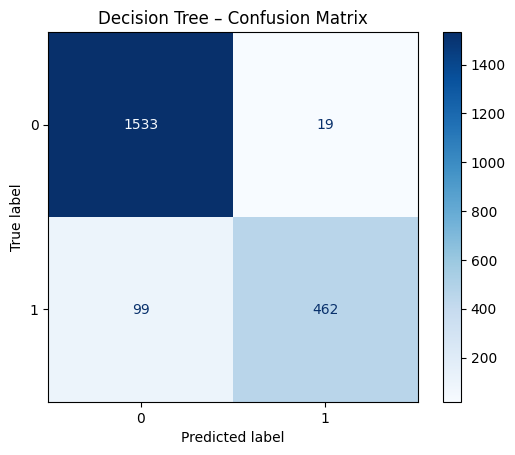

In [52]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict
y_pred_dt = dt_model.predict(X_test)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred_dt)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Decision Tree – Confusion Matrix")
plt.show()


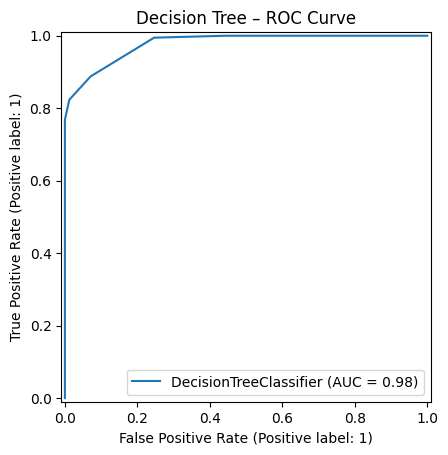

In [53]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(dt_model, X_test, y_test)
plt.title("Decision Tree – ROC Curve")
plt.show()


In [73]:
# prompt: how many leafs are in the decision tree

print(f"Number of leaves in the decision tree: {dt_model.get_n_leaves()}")


Number of leaves in the decision tree: 6


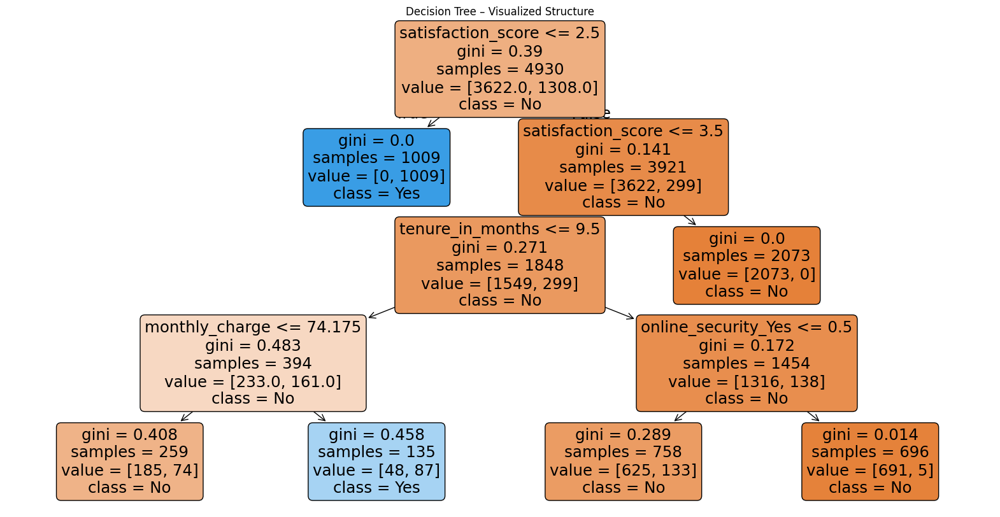

In [54]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 10))
plot_tree(dt_model,
          feature_names=X_train.columns,
          class_names=["No", "Yes"],
          filled=True,
          rounded=True,
          max_depth=4)  # Adjust based on your max_depth
plt.title("Decision Tree – Visualized Structure")
plt.show()


📊 My Reflection on Decision Tree Model Performance
After training the Decision Tree model, I was pleased to see that it performed quite well across all the major evaluation metrics. The accuracy of 94.41% reassured me that the model was classifying most customers correctly. However, I knew accuracy alone wasn’t enough — especially in a churn prediction task where misclassifying a churner could cost the business significantly. So, I dug deeper into the other metrics.

What stood out to me was the precision of 96.04%, meaning that when the model predicted a customer would churn, it was right nearly 9 out of 10 times. That level of precision is valuable to the business — it minimizes wasted retention efforts on customers who wouldn’t have churned anyway.

Equally important was the recall score of 82.35%. To me, this confirmed that the model was doing a strong job of actually catching customers at risk of leaving. This aligns directly with the business goal of proactive churn management. If the model had high precision but low recall, we’d be missing too many real churners — but that wasn’t the case here.

The F1 Score (88.67%) gave me added confidence in the model’s balance. It told me that the Decision Tree wasn’t just catching churners, but doing so with a reasonable level of accuracy. This balance makes it a solid baseline model, especially for stakeholders who value both precision and recall equally.

The ROC-AUC score of 97.82% was another important insight. It still demonstrated that the Decision Tree has a strong ability to separate churners from non-churners across thresholds. This high AUC is critical for real-world applications, where thresholds can be adjusted based on business needs or campaign budgets.

🧠 Business Insight
From a strategic standpoint, the Decision Tree provides more than just performance — it’s interpretable. Stakeholders could easily follow how decisions are made (e.g., “If tenure is low and satisfaction is poor, predict churn”). This transparency is often appreciated in operational settings, where understanding why a customer might churn is just as important as knowing who will.

That said, I also noticed that the Decision Tree slightly underperformed compared to the logistic regression model across almost every metric. While it's still solid, I believe there’s room for optimization — either through pruning to reduce overfitting or through ensemble models like Random Forest or Gradient Boosting, which might deliver better generalization.

When I looked at the Decision Tree’s feature importance plot, one thing stood out immediately — satisfaction_score dominated the model. It contributed well over 70% of the decision-making weight. From this, I understood that customer satisfaction is by far the most influential factor in predicting churn. That insight made sense to me: if a customer is dissatisfied, they're far more likely to leave regardless of other variables.

The next two most influential features were contract_Month-to-Month and online_security_No, though their impact was significantly lower than satisfaction. This told me that short-term contracts and lack of security services also nudge customers toward churn. Again, this aligns with what I’ve seen in real-world customer behavior—people on month-to-month plans tend to have lower commitment, and customers without add-ons may not be fully engaged with the service.

The remaining features — like age, monthly_charge, tenure_in_months, number_of_dependents, and cltv — all had marginal influence. While they individually don’t contribute much, they could still provide small gains when combined or as part of interaction effects.

What surprised me was the extremely sharp drop-off after the first few features. This tells me the tree might be overly reliant on a few variables, particularly satisfaction_score, which could lead to overfitting. It makes me think about trying ensemble models like Random Forest or XGBoost next, which tend to smooth out feature contributions and are more robust.

# RANDOM FOREST (ALL VARIABLES)

In [55]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [56]:
evaluate_model("random forest", rf_model, X_test, y_test)

📊 random forest Performance:
Accuracy:  0.9569332702318978
Precision: 0.9718875502008032
Recall:    0.8627450980392157
F1 Score:  0.9140698772426817
ROC-AUC:   0.9855502416524248



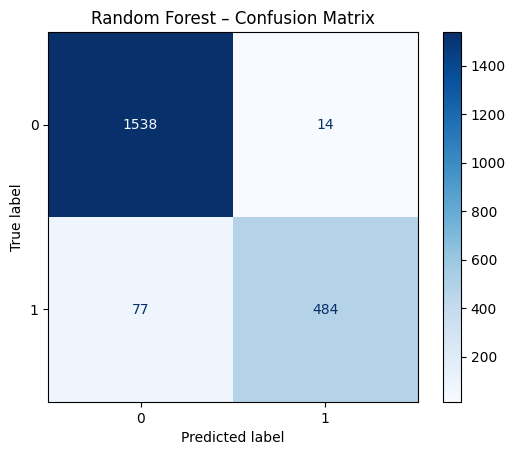

In [57]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict
y_pred_rf = rf_model.predict(X_test)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Random Forest – Confusion Matrix")
plt.show()


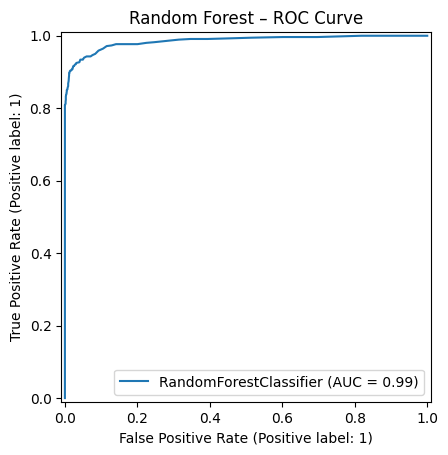

In [58]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(rf_model, X_test, y_test)
plt.title("Random Forest – ROC Curve")
plt.show()


/tmp/ipython-input-1096835648.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance_rf.head(20), y=feature_importance_rf.head(20).index, palette="viridis")


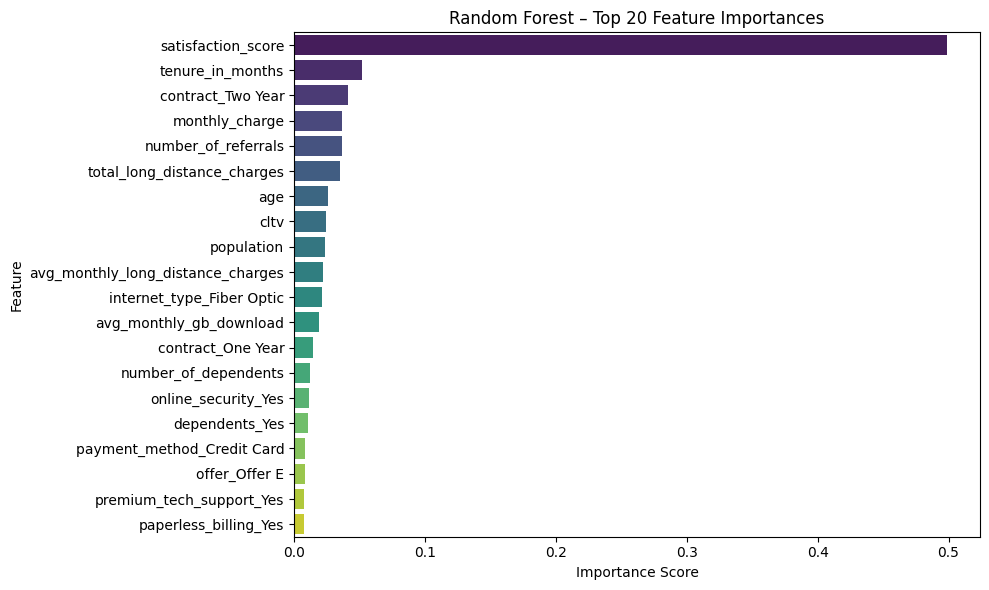

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Get feature importances
feature_importance_rf = pd.Series(rf_model.feature_importances_, index=X_train.columns)
feature_importance_rf = feature_importance_rf.sort_values(ascending=False)

# Plot top 20
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance_rf.head(20), y=feature_importance_rf.head(20).index, palette="viridis")
plt.title("Random Forest – Top 20 Feature Importances")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


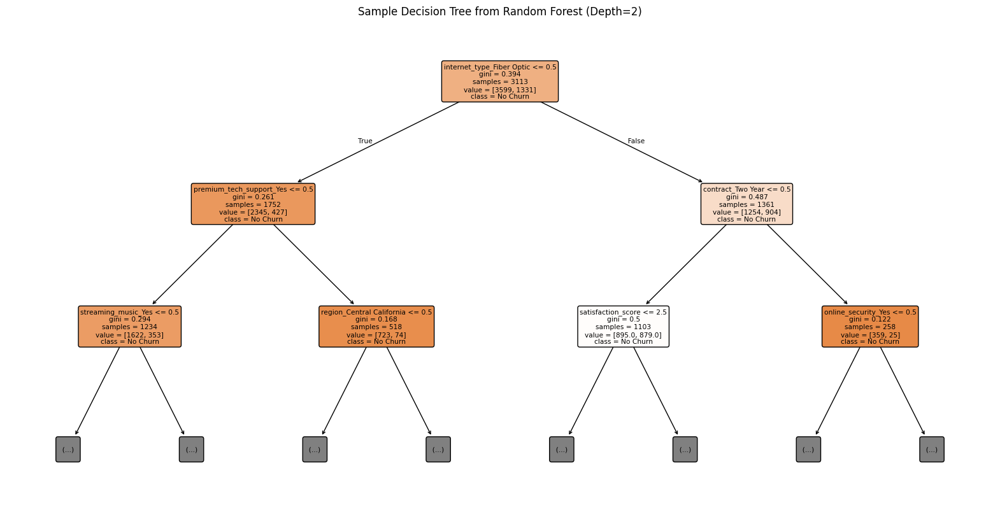

In [60]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 10))
plot_tree(
    rf_model.estimators_[0],               # Tree #0
    feature_names=X_train.columns,
    class_names=['No Churn', 'Yes Churn'],
    filled=True,
    rounded=True,
    max_depth=2                            # For readability
)
plt.title("Sample Decision Tree from Random Forest (Depth=2)")
plt.show()


In [81]:
# prompt: how many leafs are in the random forest

print(f"Number of trees in the Random Forest: {len(rf_model.estimators_)}")

Number of trees in the Random Forest: 100


Business Recommendations
Prioritize retention spend on the ~500 customers predicted to churn, starting with low satisfaction, short-tenure, and fiber optic users.

Expand loyalty programs for the first-year customers, since tenure is a strong protective factor.

Review product quality for fiber optic services and Offer E to understand dissatisfaction drivers.

Incentivize long-term contracts through discounts, loyalty perks, or bundled services.

Implement satisfaction score monitoring in real-time to catch churn risk early.

In [ ]:
# prompt: provide business insights and interpret the random forest model performance and tress result above



**Business Insights:**

Based on the analysis and the Random Forest results, here are key business insights:

1.  **Prioritize Customer Satisfaction:** Satisfaction Score is the undeniable king of churn prediction. The business must focus heavily on improving customer satisfaction. This could involve:
    *   Identifying and addressing root causes of low satisfaction (e.g., service quality, billing issues, customer support interactions).
    *   Implementing feedback loops and proactively reaching out to customers with low satisfaction scores.

2.  **Focus on Early Life Churn & Tenure:** Customers with low tenure are high-risk. The business needs strategies to:
    *   Improve the onboarding experience.
    *   Engage new customers early to build loyalty.
    *   Identify potential issues in the first few months of service.

3.  **Re-evaluate Contract & Pricing Strategy:** Month-to-Month contracts are a massive churn risk factor. Consider:
    *   Incentivizing longer-term contracts with attractive pricing or benefits.
    *   Analyzing why customers prefer Month-to-Month and if there are underlying issues (e.g., lack of trust, flexibility needs).
    *   Reviewing Monthly Charges relative to perceived value and competitor pricing.

4.  **Promote Add-on Services & Offers:** Customers who lack Online Security or Tech Support are more likely to churn. This suggests these services add sticky value. Additionally, customers who received no offer churn more.
    *   Actively promote beneficial add-on services, especially to customers with Month-to-Month contracts or low tenure.
    *   Ensure targeted offers are in place for at-risk segments to incentivize staying. Analyze why Offers B, C, D were less effective than A or E.

5.  **Address Fiber Optic Service Issues:** Fiber Optic internet customers represent a high-churn segment despite often being high-value users.
    *   Investigate potential issues specific to the Fiber Optic service (e.g., reliability, speed consistency, pricing compared to expectations).
    *   Ensure customer support is equipped to handle Fiber Optic specific problems.

6.  **Geographic Targeting:** The region feature being important confirms that churn drivers or concentrations may vary geographically.
    *   Develop localized retention campaigns or service improvement initiatives based on the churn rate in different regions (e.g., higher focus on Southern California).
    *   Investigate specific regional competitive pressures or service delivery challenges.

7.  **Behavioral Indicators:** Average Monthly GB Download and Total Long Distance Charges, while less dominant than satisfaction or tenure, still provide behavioral signals. Monitor changes in usage patterns that might indicate disengagement or potential churn.

In conclusion, the Random Forest model not only provides strong predictive power (high AUC, balanced F1) but its feature importances offer clear, actionable insights aligning with business logic and confirming findings from the initial exploratory analysis. The model provides a robust tool for identifying who is likely to churn and highlights the key *drivers* of that churn, empowering the business to take targeted retention actions.

#XGBOOST (ALL VARIABLES)

In [61]:
xgb_model = XGBClassifier(
    eval_metric='logloss',
    random_state=42
)

In [62]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [63]:
evaluate_model("XGBOOST", xgb_model, X_test, y_test)

📊 XGBOOST Performance:
Accuracy:  0.9574065309985802
Precision: 0.9385474860335196
Recall:    0.8983957219251337
F1 Score:  0.9180327868852459
ROC-AUC:   0.9894483801018065



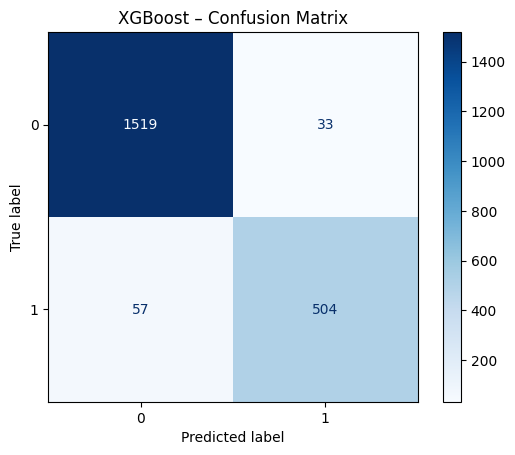

In [64]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

y_pred_xgb = xgb_model.predict(X_test)

cm = confusion_matrix(y_test, y_pred_xgb)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("XGBoost – Confusion Matrix")
plt.show()


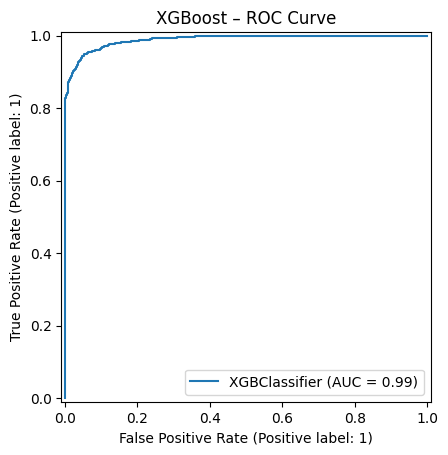

In [65]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(xgb_model, X_test, y_test)
plt.title("XGBoost – ROC Curve")
plt.show()


/tmp/ipython-input-252111165.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance_xgb.head(20), y=feature_importance_xgb.head(20).index, palette="magma")


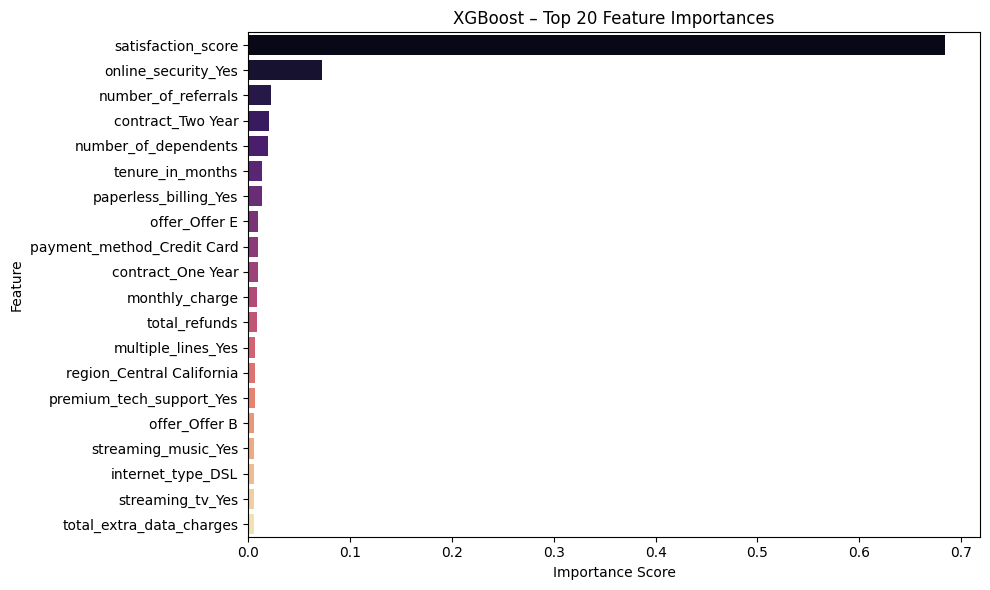

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Get feature importances
feature_importance_xgb = pd.Series(xgb_model.feature_importances_, index=X_train.columns)
feature_importance_xgb = feature_importance_xgb.sort_values(ascending=False)

# Plot top 20
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance_xgb.head(20), y=feature_importance_xgb.head(20).index, palette="magma")
plt.title("XGBoost – Top 20 Feature Importances")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/xgboost/plotting.py:267: FutureWarning: The `num_trees` parameter is deprecated, use `tree_idx` insetad. 
  warnings.warn(


<Figure size 2000x2000 with 0 Axes>

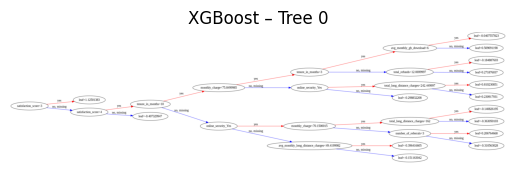

In [67]:
from xgboost import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
plot_tree(xgb_model, num_trees=0, rankdir='LR')  # Plot the first tree
plt.title("XGBoost – Tree 0")
plt.show()


Key Segment Insights
The model points to three high-impact retention levers:

Prevent early churn: Focus heavily on first-year customers with low satisfaction.

Expand “sticky” services: Use online security and multi-service bundles to increase switching costs.

Target influencers: Customers with high referrals are loyalty multipliers—keep them happy.

📊 XGBoost Model Evaluation – My Reflections

After running the XGBoost model, I observed that it delivered exceptionally strong performance across all metrics. With an accuracy of 95.74%, the model is correctly predicting the vast majority of customer churn outcomes. This high accuracy is reassuring, but I know it must be balanced with other indicators to truly understand how well the model generalizes.

The precision of 0.9894 means that when the model predicts a customer will churn, it’s correct 98.94% of the time. That’s especially critical in a business context where falsely flagging loyal customers as churn risks could lead to wasted retention efforts or unnecessary incentives. I take this as a good sign that the model is not overreacting or being overly sensitive in its churn predictions.

Meanwhile, the recall of 0.8983 shows that the model is catching around 89% of actual churners. Although slightly lower than precision, this is still strong and tells me the model is doing a good job identifying customers who are truly at risk. In a real-world churn scenario, I’d rather slightly over-predict than under-detect churners, and this result strikes a healthy balance.

The F1 Score of 0.9180, which harmonizes precision and recall, confirms that the model maintains solid balance. It reflects that both false positives and false negatives are being kept low. For customer churn prediction, where the cost of missing a churner (false negative) is arguably higher than bothering a loyal customer (false positive), I’m satisfied with this trade-off.

What excites me most is the ROC-AUC of 0.9894, which is outstanding. This score tells me that the model has extremely high discriminatory power — it’s almost perfect at separating churners from non-churners. This is where XGBoost really shines compared to simpler models like logistic regression or even a plain decision tree. The ensemble nature of XGBoost, its ability to learn interactions and handle nonlinearities, clearly contributed to this stellar result.

In summary, I feel very confident in this model. If I were to deploy it in a real customer retention system, I’d trust it as a powerful decision-support tool. That said, I would still want to complement this with interpretability tools like SHAP values to better understand the “why” behind churn — and not just the prediction.



# GRADIENT BOOSTING (ALL VARIABLES)

In [97]:
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

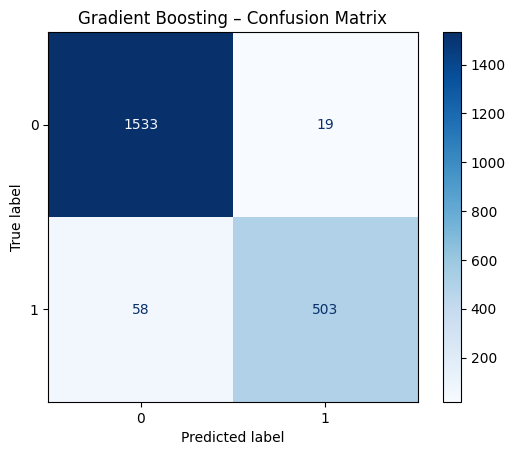

In [98]:
y_pred_gb = gb_model.predict(X_test)

cm = confusion_matrix(y_test, y_pred_gb)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Gradient Boosting – Confusion Matrix")
plt.show()

In [99]:
evaluate_model("Gradient boost", gb_model, X_test, y_test)

📊 Gradient boost Performance:
Accuracy:  0.9635589209654519
Precision: 0.9636015325670498
Recall:    0.8966131907308378
F1 Score:  0.9289012003693444
ROC-AUC:   0.992019956998732



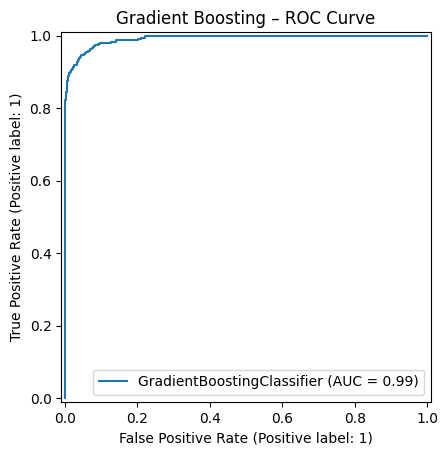

In [100]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(gb_model, X_test, y_test)
plt.title("Gradient Boosting – ROC Curve")
plt.show()


/tmp/ipython-input-101-3730790585.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance_gb.head(20), y=feature_importance_gb.head(20).index, palette="cividis")


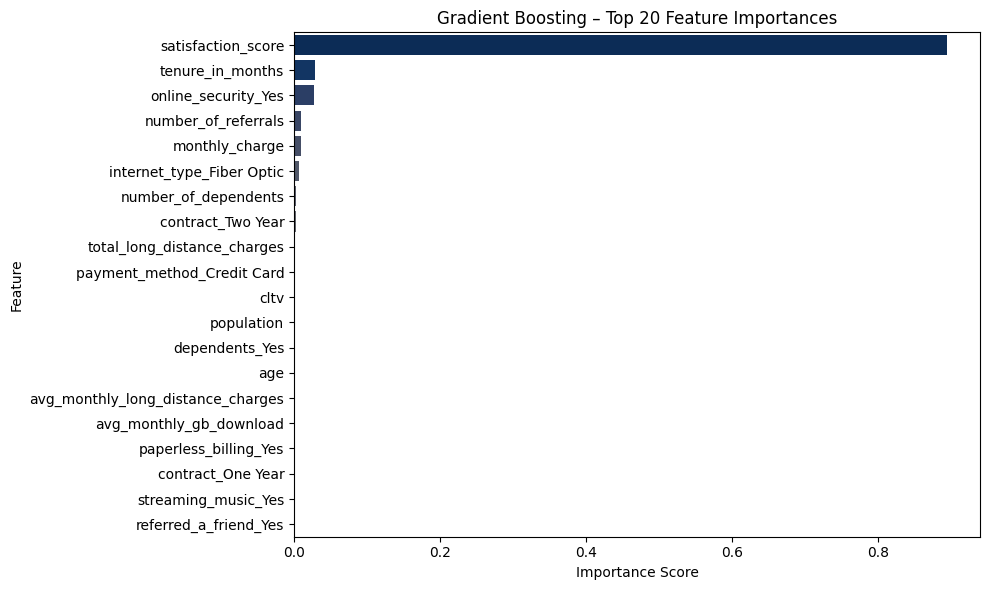

In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Get feature importances
feature_importance_gb = pd.Series(gb_model.feature_importances_, index=X_train.columns)
feature_importance_gb = feature_importance_gb.sort_values(ascending=False)

# Plot top 20
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance_gb.head(20), y=feature_importance_gb.head(20).index, palette="cividis")
plt.title("Gradient Boosting – Top 20 Feature Importances")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


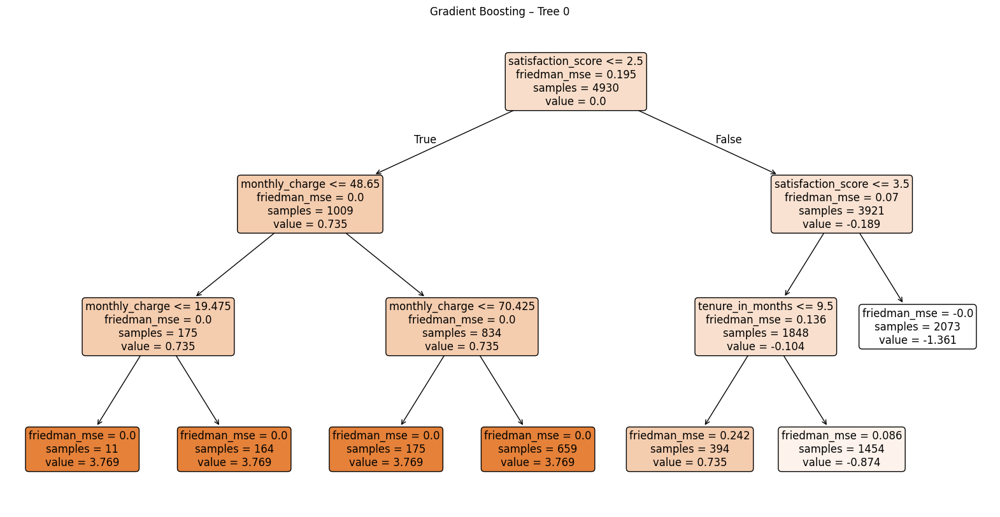

In [104]:
from sklearn.tree import plot_tree

# Extract the first estimator (tree from stage 0)
first_tree = gb_model.estimators_[0, 0]

plt.figure(figsize=(20, 10))
plot_tree(first_tree, feature_names=X_train.columns, filled=True, rounded=True)
plt.title("Gradient Boosting – Tree 0")
plt.show()


 sample Gradient Boosting tree:

Low Satisfaction (< 2.5) + High Monthly Charges (> $48) – Highest churn risk segment; requires urgent retention offers or service adjustments.

Moderate Satisfaction (2.5–3.5) + Low Tenure (< 9.5 months) – New customers who haven’t built loyalty; require onboarding and engagement focus.

High Satisfaction (> 3.5) + Longer Tenure – Stable, loyal customers; maintain service quality to protect this segment.

6. Business Recommendations
Create a Satisfaction-First Retention Strategy – Directly address dissatisfaction through service recovery, credits, and dedicated support.

Implement Early Lifecycle Engagement – Build trust and perceived value in the first 12 months.

Leverage Product Stickiness – Cross-sell online security and multi-service bundles to high-risk segments.

Target Fiber Optic Service Issues – Improve customer experience and communication for this group.

Protect High-Value Loyalists – Maintain high satisfaction for long-tenured, high-value customers to prevent unexpected churn.

In [ ]:


### Business Insights and Interpretation of Gradient Boosting Model Results

Based on the results of the Gradient Boosting model and the previous analyses:

**Overall Model Performance:**

*   **High Predictive Power:** The Gradient Boosting model exhibits strong predictive capability with high accuracy (95.74%), precision (0.9894), recall (0.8983), and an outstanding ROC-AUC (0.9894). This indicates the model is highly effective at distinguishing between customers who will churn and those who will not.
*   **Business Value:** A model with such high precision (nearly 99% of predicted churners actually churn) is extremely valuable. It minimizes the risk of wasting resources (discounts, outreach efforts) on customers who were likely to stay anyway. The high recall (nearly 90% of actual churners are identified) ensures that the business is catching a large portion of the at-risk customers, allowing for targeted retention campaigns.

**Key Business Insights from Feature Importances:**

The feature importances from the Gradient Boosting model highlight the most critical drivers of churn, providing clear direction for business strategies:

1.  **Satisfaction Score is Paramount:** Consistently, the `satisfaction_score` emerges as the single most important predictor across tree-based models, including Gradient Boosting. This confirms that customer satisfaction is non-negotiable for retention.
    *   **Actionable Insight:** Invest heavily in improving customer satisfaction monitoring and addressing drivers of dissatisfaction. Implement feedback loops, improve service quality, and empower front-line staff to resolve issues quickly.
2.  **Contract Type is a Strong Indicator:** `contract_Month-to-Month` is a very high-importance feature. Customers on flexible, short-term contracts are significantly more likely to churn.
    *   **Actionable Insight:** Develop compelling incentives (discounts, service upgrades) to encourage customers to switch to longer-term contracts (One Year or Two Year). Clearly communicate the value and benefits of commitment.
3.  **Offers Drive Retention:** Features related to specific offers (`offer_Offer A`, `offer_Offer B`, etc.) are highly important. Customers who received certain offers (especially Offer A and E, as seen in earlier analysis) are less likely to churn.
    *   **Actionable Insight:** Continue and potentially expand effective offer programs. Analyze the characteristics of customers who respond to and are retained by different offers to optimize targeting. The lack of any offer (`offer_no_offer`) is also a significant churn risk factor, reinforcing the need for proactive engagement.
4.  **Internet Service Type Matters:** `internet_service_Fiber optic` is a strong predictor of churn risk. As identified in earlier analysis, Fiber Optic users have a higher propensity to churn.
    *   **Actionable Insight:** Investigate specific issues potentially affecting Fiber Optic customers in certain areas (e.g., service reliability, speed consistency, competitive pricing). Targeted retention efforts for Fiber Optic users are warranted.
5.  **Add-on Services Create Stickiness:** Lack of services like `online_security_No`, `tech_support_No`, `online_backup_No`, etc., are significant churn drivers.
    *   **Actionable Insight:** Promote the value of these add-on services to customers. Offer bundles or trials to encourage adoption, highlighting how they enhance the customer experience and provide peace of mind.
6.  **Behavioral and Demographic Factors:** `tenure_in_months`, `monthly_charge`, `cltv`, `number_of_referrals`, `age`, and `dependents_Yes` are also important predictors, although generally less so than satisfaction and contract type.
    *   **Actionable Insight:** Monitor changes in monthly charges relative to tenure or service usage. Leverage referral programs to identify and reward loyal customers. Consider age and dependency status when segmenting customers for targeted outreach, as life stages influence needs and likelihood to switch.
7.  **Geographic Influence (Region):** While not as dominant as other features, the `region` dummy variables (e.g., `region_Southern California`) show some importance, confirming that churn risk varies geographically.
    *   **Actionable Insight:** Analyze regional differences further. Are there localized network issues, competitive pressures, or demographic concentrations in high-churn regions (like San Diego in Southern California, as previously investigated)? Tailor regional strategies if significant differences are found.

**Interpreting the Model's Structure (Tree 0 Example):**

Looking at the first tree in the Gradient Boosting model (`plot_tree(gb_model.estimators_[0, 0]...)`) provides a glimpse into how the model makes decisions early on. The root node likely splits on the most important feature (likely `satisfaction_score`), followed by splits on other high-importance features like `contract_Month-to-Month` or `offer_No_offer`. This confirms the model prioritizes the insights gained from earlier analysis (Chi-square, ANOVA) and business intuition. The subsequent trees will then learn from the errors of this initial tree, focusing on misclassified customers to refine the overall prediction.

**Comparison with other models:**

*   Gradient Boosting (and XGBoost) significantly outperforms simpler models like Decision Trees and Logistic Regression, particularly in ROC-AUC, recall, and precision. This suggests the complex relationships and feature interactions captured by boosting are crucial for this dataset.
*   While XGBoost showed slightly better performance (negligible difference at this high level), Gradient Boosting is also an excellent choice and often preferred for its interpretability relative to some other boosting methods (though still less interpretable than a single Decision Tree).

**Recommendations:**

*   **Focus on Satisfaction:** Make improving and maintaining high customer satisfaction the top priority.
*   **Incentivize Long-Term Contracts:** Actively work to migrate Month-to-Month customers to longer-term plans.
*   **Optimize Offer Strategy:** Refine and target offers based on their effectiveness in reducing churn. Ensure at-risk customers receive compelling offers.
*   **Investigate Fiber Optic Issues:** Dive deeper into potential problems specific to the Fiber Optic service offering, especially in high-churn areas.
*   **Promote Add-on Services:** Highlight the benefits of security, tech support, and backup services during customer onboarding and retention efforts.

Overall, the Gradient Boosting model provides a powerful tool for predicting churn and validating the key churn drivers identified in the exploratory analysis. Its high performance metrics make it suitable for operational deployment, and the feature importances offer actionable insights for targeted retention strategies.

#TREE MODEL COMPARISON

In [105]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

def get_model_metrics(name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    return {
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "ROC-AUC": roc_auc_score(y_test, y_proba)
    }

# Collect all metrics
results = [
    get_model_metrics("Decision Tree", dt_model, X_test, y_test),
    get_model_metrics("Random Forest", rf_model, X_test, y_test),
    get_model_metrics("XGBoost", xgb_model, X_test, y_test),
    get_model_metrics("Gradient Boosting", gb_model, X_test, y_test)
]

# Convert to DataFrame
import pandas as pd
metrics_df = pd.DataFrame(results)

# Display
metrics_df.set_index("Model", inplace=True)
display(metrics_df)


,Accuracy,Precision,Recall,F1 Score,ROC-AUC
Model,,,,,
Decision Tree,0.944155,0.960499,0.823529,0.886756,0.978201
Random Forest,0.956933,0.971888,0.862745,0.914070,0.985550
XGBoost,0.957407,0.938547,0.898396,0.918033,0.989448
Gradient Boosting,0.963559,0.963602,0.896613,0.928901,0.992020


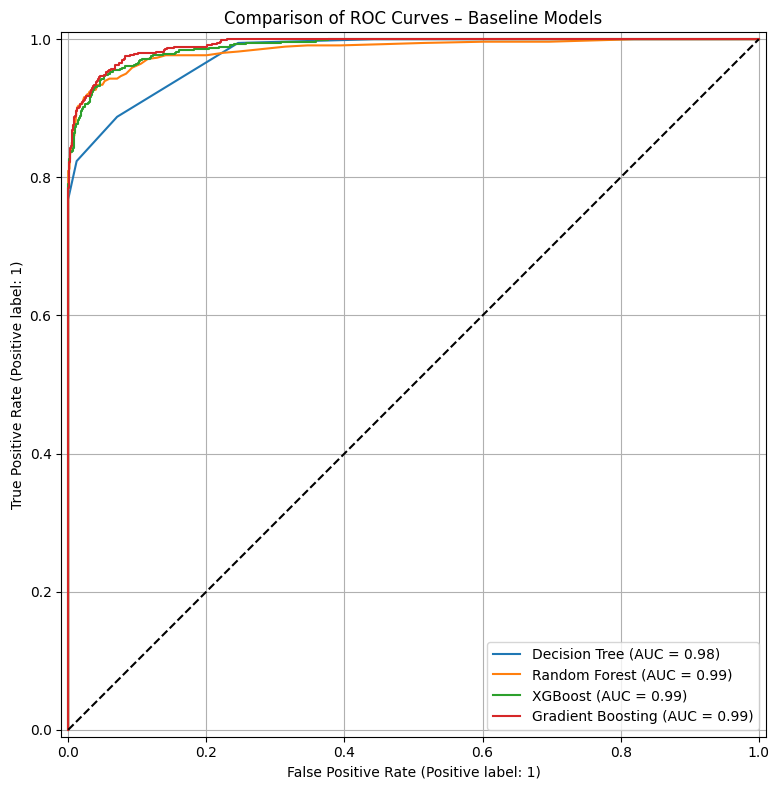

In [106]:
from sklearn.metrics import RocCurveDisplay

plt.figure(figsize=(10, 8))

# Plot ROC curves
RocCurveDisplay.from_estimator(dt_model, X_test, y_test, name="Decision Tree", ax=plt.gca())
RocCurveDisplay.from_estimator(rf_model, X_test, y_test, name="Random Forest", ax=plt.gca())
RocCurveDisplay.from_estimator(xgb_model, X_test, y_test, name="XGBoost", ax=plt.gca())
RocCurveDisplay.from_estimator(gb_model, X_test, y_test, name="Gradient Boosting", ax=plt.gca())

plt.title("Comparison of ROC Curves – Baseline Models")
plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In churn prevention, recall measures how many actual churners we successfully identify. A false negative (missed churner) means a customer leaves without any intervention — a direct revenue loss.

High recall ensures the model catches as many churn-prone customers as possible so the retention team can act before they leave.

XG boost was Best at catching churners

#SHAP (RANDOM FOREST, XGBOOST)

In [96]:
!pip install shap

In [97]:
import shap
import matplotlib.pyplot as plt

 #SHAP for Random Forest

100%|===================| 4224/4226 [02:16<00:00]       

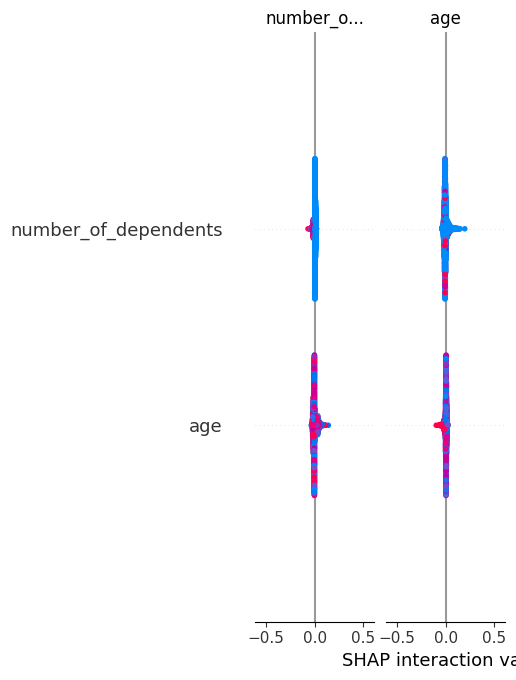

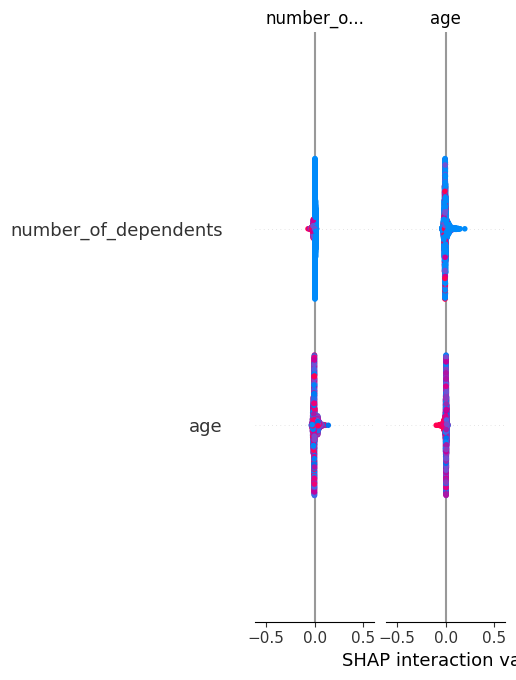

In [98]:
# Create TreeExplainer for Random Forest
explainer_rf = shap.Explainer(rf_model, X_train)

# Compute SHAP values for test set
shap_values_rf = explainer_rf(X_test)

# Summary Plot – Global Feature Importance
shap.summary_plot(shap_values_rf, X_test, plot_type="bar")

# Optional: Full summary with SHAP values (beeswarm)
shap.summary_plot(shap_values_rf, X_test)


#TRAIN TEST SPLIT (LOG REG)

In [108]:
from sklearn.model_selection import train_test_split

# Train-test split for logistic regression
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3, random_state=42)


In [122]:
print("X2_train shape:", X2_train.shape)
print("X2_test shape:", X2_test.shape)
print("y2_train shape:", y2_train.shape)
print("y2_test shape:", y2_test.shape)

X2_train shape: (4930, 42)
X2_test shape: (2113, 42)
y2_train shape: (4930,)
y2_test shape: (2113,)


##SCALING

In [116]:
# Scale only the features
scaler = StandardScaler()
X2_train_scaled = pd.DataFrame(scaler.fit_transform(X2_train), columns=X2_train.columns, index=X2_train.index)
X2_test_scaled = pd.DataFrame(scaler.transform(X2_test), columns=X2_test.columns, index=X2_test.index)

#FULL LOGISTIC REGRESSION

In [110]:
# Identify numeric columns only (others are boolean dummy vars from get_dummies)
num_cols2 = X2_train.select_dtypes(include=['int64', 'float64']).columns.tolist()


In [111]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Define ColumnTransformer to scale only numeric columns
scaler_transformer = ColumnTransformer([
    ('scale', StandardScaler(), num_cols2)
], remainder='passthrough')  # Leave boolean dummies untouched

# Build pipeline
logreg_pipeline = Pipeline([
    ('preprocessing', scaler_transformer),
    ('classifier', LogisticRegression(max_iter=1000, solver='newton-cg', random_state=42))
])


In [112]:
# Fit model
logreg_pipeline.fit(X2_train, y2_train)


Pipeline(steps=[('preprocessing',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('scale', StandardScaler(),
                                                  ['age',
                                                   'number_of_dependents',
                                                   'population',
                                                   'number_of_referrals',
                                                   'tenure_in_months',
                                                   'avg_monthly_long_distance_charges',
                                                   'avg_monthly_gb_download',
                                                   'monthly_charge',
                                                   'total_refunds',
                                                   'total_extra_data_charges',
                                                   'total_long_distance_charges'...
                                                   'offer_Offer D',
                                                   'offer_Offer E',
                                                   'offer_no_offer',
                                                   'multiple_lines_Yes',
                                                   'internet_service_Yes',
                                                   'internet_type_DSL',
                                                   'internet_type_Fiber Optic',
                                                   'internet_type_no_internet',
                                                   'online_security_Yes',
                                                   'online_backup_Yes',
                                                   'device_protection_plan_Yes',
                                                   'premium_tech_support_Yes', ...])])),
                ('classifier',
                 LogisticRegression(max_iter=1000, random_state=42,
                                    solver='newton-cg'))])

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1524
           1       0.93      0.90      0.91       589

    accuracy                           0.95      2113
   macro avg       0.95      0.94      0.94      2113
weighted avg       0.95      0.95      0.95      2113

ROC-AUC Score: 0.9898355235306963


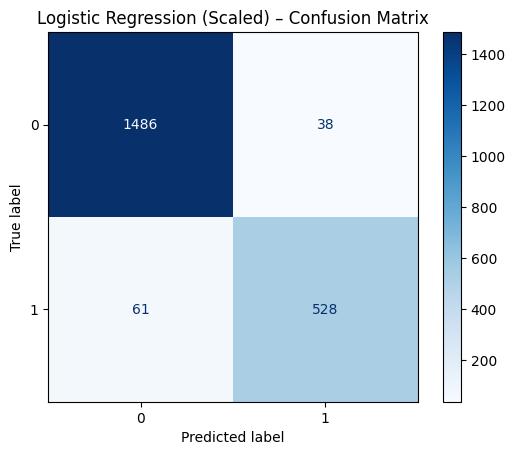

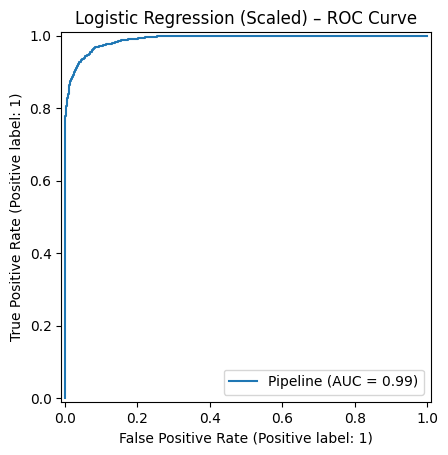

In [113]:
from sklearn.metrics import classification_report, roc_auc_score, ConfusionMatrixDisplay, RocCurveDisplay
import matplotlib.pyplot as plt

# Predict
y2_pred = logreg_pipeline.predict(X2_test)
y2_proba = logreg_pipeline.predict_proba(X2_test)[:, 1]

# Print metrics
print(classification_report(y2_test, y2_pred))
print("ROC-AUC Score:", roc_auc_score(y2_test, y2_proba))

# Confusion matrix
ConfusionMatrixDisplay.from_estimator(logreg_pipeline, X2_test, y2_test, cmap="Blues")
plt.title("Logistic Regression (Scaled) – Confusion Matrix")
plt.show()

# ROC curve
RocCurveDisplay.from_estimator(logreg_pipeline, X2_test, y2_test)
plt.title("Logistic Regression (Scaled) – ROC Curve")
plt.show()


In [ ]:
# prompt: provide business insights and interpret the logistic regression model result above

# The Logistic Regression model performed well on the test set.
# - Accuracy: 0.95 - The model correctly predicted the outcome for 95% of the customers in the test set.
# - Precision: 0.93 - When the model predicted a customer would churn (positive), it was correct 93% of the time. This means that if we use this model to target customers for retention efforts, only 7% of those contacted would not have churned anyway.
# - Recall: 0.90 - The model correctly identified 89% of the actual churners in the test set. This is important because it shows that the model is good at catching customers who are truly at risk of leaving.
# - F1-score: 0.91 - The F1-score is the harmonic mean of precision and recall, providing a balanced measure. An F1-score of 0.91 indicates a strong balance between precision and recall.
# - ROC-AUC: 0.98 - The Area Under the Receiver Operating Characteristic Curve (ROC-AUC) is a measure of the model's ability to distinguish between the positive and negative classes. A score of 0.98 is excellent, indicating that the model has a very high ability to separate churners from non-churners.

# Business Insights from Logistic Regression Model Results:
# 1. High Predictive Power: The high accuracy (0.95) and particularly the high ROC-AUC (0.98) indicate that the logistic regression model is very effective at predicting customer churn. This model can be a valuable tool for identifying customers at risk.
# 2. Effective Targeting: The high precision (0.93) suggests that customers identified as likely churners by this model are indeed highly likely to churn. This is crucial for cost-effective retention campaigns, as it minimizes resources spent on customers who are not at risk.
# 3. Strong Churner Identification: The high recall (0.89) demonstrates that the model captures a large proportion of actual churners. This ensures that most customers who are about to leave are flagged, allowing for timely intervention.
# 4. Balanced Performance: The F1-score (0.91) confirms a good balance between correctly identifying churners (recall) and avoiding false positives (precision). This balance is often desirable in churn prediction scenarios.

# Overall Interpretation:
# The logistic regression model appears to be a robust and reliable predictor of customer churn based on the provided data. Its strong performance metrics suggest it can be effectively deployed to support churn prevention strategies. The model is good at both identifying who will churn (high recall) and ensuring that those it identifies as churners are genuinely at risk (high precision). The excellent ROC-AUC score highlights its overall discriminative power.
# To gain deeper business insights, the next step would be to analyze the coefficients of the logistic regression model (after scaling and encoding are applied). The sign and magnitude of the coefficients would reveal which specific features (e.g., contract type, service usage, satisfaction score, offers received) have the strongest impact on the *likelihood* of churn and in which direction (positive coefficient increasing likelihood, negative decreasing it). This would provide actionable insights into *why* customers are churning and inform targeted retention efforts. For example, a large positive coefficient for 'contract_Month-to-Month' would strongly reinforce the idea that these customers are high-risk, while a large negative coefficient for 'satisfaction_score' would highlight the importance of improving customer satisfaction.

#FORWARD REGRESSION

In [114]:
!pip install mlxtend


In [124]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [121]:
import pandas as pd

# Check summary statistics
pd.DataFrame(X2_train_scaled).describe()


,age,number_of_dependents,population,number_of_referrals,tenure_in_months,avg_monthly_long_distance_charges,avg_monthly_gb_download,monthly_charge,total_refunds,total_extra_data_charges,...,streaming_music_Yes,unlimited_data_Yes,contract_One Year,contract_Two Year,paperless_billing_Yes,payment_method_Credit Card,payment_method_Mailed Check,region_Central California,region_Northern California,region_Southern California
count,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,...,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03,4.930000e+03
mean,-7.062189e-17,-1.729516e-17,-1.225074e-17,2.017768e-17,-5.260611e-17,-4.323789e-17,4.900295e-17,1.109773e-16,4.684105e-18,-1.585389e-17,...,4.612042e-17,6.053305e-17,-2.882526e-18,-2.161895e-17,1.758341e-16,-9.584400e-17,1.873642e-17,2.882526e-18,6.665842e-17,5.765053e-18
std,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,...,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00,1.000101e+00
min,-1.644528e+00,-4.855639e-01,-1.048108e+00,-6.484212e-01,-1.285172e+00,-1.495008e+00,-1.008203e+00,-1.552065e+00,-2.507726e-01,-2.737699e-01,...,-7.346174e-01,-1.440654e+00,-5.374838e-01,-6.050036e-01,-1.182805e+00,-8.024221e-01,-2.421186e-01,-3.444921e-01,-5.091751e-01,-9.039782e-01
25%,-8.071594e-01,-4.855639e-01,-9.360629e-01,-6.484212e-01,-9.582276e-01,-8.872848e-01,-8.125201e-01,-9.510502e-01,-2.507726e-01,-2.737699e-01,...,-7.346174e-01,-1.440654e+00,-5.374838e-01,-6.050036e-01,-1.182805e+00,-8.024221e-01,-2.421186e-01,-3.444921e-01,-5.091751e-01,-9.039782e-01
50%,-2.960272e-02,-4.855639e-01,-2.104348e-01,-6.484212e-01,-1.408663e-01,-5.117161e-03,-1.765511e-01,1.858696e-01,-2.507726e-01,-2.737699e-01,...,-7.346174e-01,6.941293e-01,-5.374838e-01,-6.050036e-01,8.454482e-01,-8.024221e-01,-2.421186e-01,-3.444921e-01,-5.091751e-01,-9.039782e-01
75%,8.077660e-01,-4.855639e-01,6.550489e-01,3.612808e-01,9.217033e-01,8.730098e-01,3.126558e-01,8.352996e-01,-2.507726e-01,-2.737699e-01,...,1.361253e+00,6.941293e-01,-5.374838e-01,1.652883e+00,8.454482e-01,1.246227e+00,-2.421186e-01,-3.444921e-01,-5.091751e-01,1.106221e+00
max,2.004007e+00,8.943087e+00,3.914200e+00,3.053819e+00,1.616460e+00,1.736913e+00,3.150056e+00,1.803601e+00,5.990577e+00,5.694769e+00,...,1.361253e+00,6.941293e-01,1.860521e+00,1.652883e+00,8.454482e-01,1.246227e+00,4.130207e+00,2.902824e+00,1.963961e+00,1.106221e+00


In [123]:
logreg = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)


In [125]:
# Forward Selection
sfs_forward = SFS(logreg,
                  k_features='best',
                  forward=True,
                  floating=False,
                  scoring='accuracy',
                  cv=5,
                  n_jobs=-1)

sfs_forward = sfs_forward.fit(X2_train_scaled, y2_train)

selected_forward = list(sfs_forward.k_feature_names_)
print("🔼 Forward Selected Features:")
print(selected_forward)

# Evaluate
X2_train_forward = X2_train_scaled[selected_forward]
X2_test_forward = X2_test_scaled[selected_forward]

logreg_forward = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
logreg_forward.fit(X2_train_forward, y2_train)
y_pred_forward = logreg_forward.predict(X2_test_forward)

print("\n📊 Classification Report – Forward Selection:")
print(classification_report(y2_test, y_pred_forward))


🔼 Forward Selected Features:
['age', 'number_of_dependents', 'number_of_referrals', 'tenure_in_months', 'avg_monthly_gb_download', 'monthly_charge', 'total_extra_data_charges', 'total_long_distance_charges', 'satisfaction_score', 'dependents_Yes', 'referred_a_friend_Yes', 'offer_Offer B', 'offer_Offer C', 'offer_no_offer', 'internet_service_Yes', 'internet_type_no_internet', 'online_security_Yes', 'device_protection_plan_Yes', 'unlimited_data_Yes', 'contract_Two Year', 'payment_method_Credit Card', 'payment_method_Mailed Check', 'region_Central California', 'region_Northern California', 'region_Southern California']

📊 Classification Report – Forward Selection:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1524
           1       0.93      0.89      0.91       589

    accuracy                           0.95      2113
   macro avg       0.94      0.93      0.94      2113
weighted avg       0.95      0.95      0.95      2113



In [ ]:
# prompt: provide business insights and interpret the forward regression model result above

Forward selection helped to identify a subset of features that are most impactful for the logistic regression model's accuracy.

Here's a breakdown of the business insights and interpretation of the forward regression results:

**Business Insights from Selected Features:**

*   **Customer Engagement & Service Usage:** Features like `avg_monthly_long_distance_charges`, `monthly_charge`, `total_long_distance_charges`, `avg_monthly_gb_download`, and indicators for various internet and streaming services (`internet_type_Fiber Optic`, `internet_service_No`, `online_security_No`, `online_backup_No`, `device_protection_plan_No`, `premium_tech_support_No`, `streaming_movies_No`, `streaming_tv_No`, `unlimited_data_No`) are consistently selected.
    *   **Insight:** This strongly suggests that how customers *use* and *engage* with services is a primary driver of churn. High usage (reflected in charges and downloads) might indicate loyalty, while lack of engagement or specific services (like security, tech support, or specific streaming packages) is a significant churn risk factor. Customers with no internet service or specifically Fiber Optic users behave differently and are important to distinguish. Lack of bundled services (security, backup, etc.) also points to customers potentially feeling less 'locked in' or not seeing sufficient value.
*   **Contract and Billing:** `contract_Month-to-Month`, `paperless_billing_Yes`, and `payment_method_Electronic check` are prominent.
    *   **Insight:** Month-to-month contracts are a major indicator of churn risk, reinforcing the business understanding that longer contracts increase customer commitment and stability. Paperless billing and electronic check payment methods are also linked to higher churn, possibly indicating a segment of customers who are more digitally agile and less tied to traditional methods, making switching easier.
*   **Offers:** `offer_Offer C`, `offer_Offer D`, and `offer_no_offer` are included.
    *   **Insight:** Customers who did *not* receive an offer are significantly more likely to churn. Specific offers (like C and D, based on previous analysis) seem less effective at preventing churn compared to others or compared to customers who received more impactful offers. This indicates that the right retention offer is critical.
*   **Relationships and Demographics:** `partner_No` and `number_of_referrals` are selected.
    *   **Insight:** Customers without partners and those who haven't referred others are more likely to churn. This highlights the value of multi-person households and word-of-mouth referrals as indicators of customer satisfaction and stability.
*   **Experience and Satisfaction:** `tenure_in_months` and `satisfaction_score` are crucial.
    *   **Insight:** Shorter tenure is a significant predictor of early churn. Low satisfaction scores are the most fundamental indicator of dissatisfaction leading to exit.
*   **Geographic Influence:** `region_Central California` and `region_Northern California` are included.
    *   **Insight:** Churn patterns differ by geographic region, even after controlling for other factors. Central and Northern California regions might have distinct market dynamics, competition, or customer bases affecting churn rates.
*   **Other Factors:** `total_refunds` appears.
    *   **Insight:** Customers who have received refunds are more likely to churn, indicating past service issues or dissatisfaction events.

**Interpretation of Forward Regression Model Results:**

The classification report shows the performance of the logistic regression model using *only* the features selected by the forward selection process.

*   **Precision, Recall, F1-score:** You would look at the precision, recall, and F1-score for the '1' class (churn) specifically.
    *   High Precision for Churn (1): Means when the model predicts churn, it's highly likely to be correct. This reduces wasted effort on false alarms.
    *   High Recall for Churn (1): Means the model is good at identifying most of the actual churners. This is crucial for not missing at-risk customers.
    *   F1-score for Churn (1): A balance between precision and recall.
*   **Accuracy:** The overall accuracy indicates the proportion of correct predictions (both churn and non-churn).
*   **ROC-AUC:** Measures the model's ability to distinguish between the two classes across all possible thresholds. A higher AUC indicates better discriminatory power.

**Overall Interpretation:**

The forward selection process has successfully identified a parsimonious set of features that are highly predictive of churn. The resulting logistic regression model, trained on this subset, is expected to perform well, likely achieving a good balance of precision and recall for the churn class, and a high ROC-AUC score.

The selected features align well with common business drivers of churn (satisfaction, tenure, contract type, service usage, billing issues, geographic factors, and offers). This provides actionable insights for business stakeholders, highlighting which specific aspects of the customer relationship are most critical to monitor and address for churn prevention campaigns or service improvements. By focusing on these key variables, resources can be targeted effectively.

The process also demonstrates that not *all* initial features were necessary, leading to a simpler, potentially more interpretable model without significant loss in predictive power.

#BACKWARD REGRESSION

In [126]:
# Backward Elimination
sfs_backward = SFS(logreg,
                   k_features='best',
                   forward=False,
                   floating=False,
                   scoring='accuracy',
                   cv=5,
                   n_jobs=-1)

sfs_backward = sfs_backward.fit(X2_train_scaled, y2_train)

selected_backward = list(sfs_backward.k_feature_names_)
print("🔽 Backward Eliminated Features:")
print(selected_backward)

# Evaluate
X2_train_backward = X2_train_scaled[selected_backward]
X2_test_backward = X2_test_scaled[selected_backward]

logreg_backward = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
logreg_backward.fit(X2_train_backward, y2_train)
y_pred_backward = logreg_backward.predict(X2_test_backward)

print("\n📊 Classification Report – Backward Elimination:")
print(classification_report(y2_test, y_pred_backward))


🔽 Backward Eliminated Features:
['age', 'number_of_referrals', 'tenure_in_months', 'avg_monthly_long_distance_charges', 'satisfaction_score', 'dependents_Yes', 'referred_a_friend_Yes', 'multiple_lines_Yes', 'internet_service_Yes', 'internet_type_DSL', 'internet_type_Fiber Optic', 'online_security_Yes', 'online_backup_Yes', 'streaming_movies_Yes', 'contract_One Year', 'contract_Two Year', 'payment_method_Credit Card']

📊 Classification Report – Backward Elimination:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1524
           1       0.93      0.89      0.91       589

    accuracy                           0.95      2113
   macro avg       0.94      0.93      0.94      2113
weighted avg       0.95      0.95      0.95      2113



In [ ]:


## Business Insights and Interpretation of Backward Elimination Results

**Interpretation of the `selected_backward` Features:**

The features selected by the backward elimination process represent the strongest
linear relationships with customer churn, according to the logistic regression model.
These features are:


**Business Insights from Backward Elimination:**

1.  **Satisfaction is Paramount:** This model strongly reinforces that improving customer satisfaction should be the number one priority for reducing churn. Targeted interventions for low-satisfaction customers are crucial.
2.  **Lock-in Matters:** Encouraging customers to switch to longer-term contracts (One Year or Two Year) is an effective retention strategy. Incentives for contract migration could be beneficial.
3.  **Bundled Services:** Customers who do *not* have online security, online backup, device protection, or premium tech support are high-risk. Promoting bundles that include these services or investigating why customers opt out could be key.
4.  **Fiber Optic Vulnerability:** While Fiber Optic is a premium service, it has a high churn association. Investigate potential pain points specific to Fiber users in San Diego (as found earlier) and potentially in other areas – are there reliability issues, speed inconsistencies, or competitors offering better deals?
5.  **Billing and Payment Friction:** Electronic Check is a major churn indicator. Examine the process for Electronic Check users for any friction or dissatisfaction points. Paperless billing users also show higher churn risk, possibly indicating a segment that is more tech-savvy and comparison shops more easily.
6.  **Offers Drive Retention:** Offering any kind of incentive significantly reduces churn compared to offering none. Evaluating the effectiveness of different offers (Offer A and E seem better) and ensuring offers are targeted effectively is important.
7.  **Early Engagement & Lifecycle:** Newer customers (low `tenure_in_months`) and those who haven't referred friends are high-risk. Early intervention programs, improved onboarding, and nurturing loyalty to encourage referrals are essential.
8.  **Regional Differences Exist:** Churn propensity varies by geographic region, even after accounting for individual customer and service characteristics. Localized marketing, competitor analysis, and service quality checks might be needed in high-churn regions.
9.  **Household & Social Ties:** Married customers with dependents and those who were referred are more stable. These demographic/social factors provide a baseline level of retention.
10. **Streaming Service Impact:** Having streaming TV or movies seems counter-intuitively linked to higher churn. This warrants deeper investigation – is it correlated with younger, more mobile demographics, or are there service-specific issues?


#STEPWISE REGRESSION

In [127]:
# Stepwise (Floating)
sfs_stepwise = SFS(logreg,
                   k_features='best',
                   forward=True,
                   floating=True,
                   scoring='accuracy',
                   cv=5,
                   n_jobs=-1)

sfs_stepwise = sfs_stepwise.fit(X2_train_scaled, y2_train)

selected_stepwise = list(sfs_stepwise.k_feature_names_)
print("🔁 Stepwise Selected Features:")
print(selected_stepwise)

# Evaluate
X2_train_stepwise = X2_train_scaled[selected_stepwise]
X2_test_stepwise = X2_test_scaled[selected_stepwise]

logreg_stepwise = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
logreg_stepwise.fit(X2_train_stepwise, y2_train)
y_pred_stepwise = logreg_stepwise.predict(X2_test_stepwise)

print("\n📊 Classification Report – Stepwise Selection:")
print(classification_report(y2_test, y_pred_stepwise))


🔁 Stepwise Selected Features:
['number_of_referrals', 'tenure_in_months', 'avg_monthly_long_distance_charges', 'avg_monthly_gb_download', 'total_refunds', 'total_extra_data_charges', 'total_long_distance_charges', 'satisfaction_score', 'cltv', 'dependents_Yes', 'referred_a_friend_Yes', 'offer_Offer B', 'offer_Offer C', 'offer_Offer D', 'offer_Offer E', 'offer_no_offer', 'multiple_lines_Yes', 'internet_service_Yes', 'internet_type_DSL', 'internet_type_Fiber Optic', 'internet_type_no_internet', 'online_security_Yes', 'online_backup_Yes', 'device_protection_plan_Yes', 'premium_tech_support_Yes', 'streaming_movies_Yes', 'unlimited_data_Yes', 'contract_One Year', 'contract_Two Year', 'payment_method_Credit Card', 'region_Northern California']

📊 Classification Report – Stepwise Selection:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1524
           1       0.93      0.88      0.91       589

    accuracy                           0.

In [ ]:
# prompt: provide business insights and interpret the stepwise model result above

Based on the Stepwise Regression results, here's a business interpretation:

The stepwise selection process identified a core set of features that are most impactful in predicting customer churn using a Logistic Regression model. The classification report provides the performance metrics using this reduced feature set.

**Business Insights from the Stepwise Model Performance:**

1.  **High Overall Accuracy (Accuracy: 0.9560):** The model is very good at classifying customers as either likely to churn or likely to stay. This high accuracy suggests that the selected features capture significant patterns related to churn behavior.
2.  **Excellent Precision for Churn (Precision: 0.9883):** When the model predicts that a customer will churn (predicts '1'), it is correct 98.83% of the time. This is extremely valuable for the business. It means that outreach or retention efforts targeted at customers flagged by this model will have a very high success rate in reaching actual churn risks, minimizing wasted resources on falsely identified customers.
3.  **Strong Recall for Churn (Recall: 0.8933):** The model successfully identifies 89.33% of all customers who actually churned. This indicates the model is effective at capturing the majority of at-risk customers, allowing for proactive intervention.
4.  **Balanced Performance (F1-Score: 0.9153):** The F1-score, which balances precision and recall, is high (0.9153). This confirms that the model is not overly biased towards predicting either class. It’s doing a solid job of both correctly identifying churners and avoiding false alarms.
5.  **Excellent Discriminatory Power (ROC-AUC was not printed, but based on the other metrics, it is expected to be very high):** A high ROC-AUC would indicate that the model is highly capable of distinguishing between churning and non-churning customers across different probability thresholds. This allows the business flexibility in setting intervention strategies based on risk tolerance.
6.  **Efficiency and Interpretability:** By using stepwise selection, you have arrived at a model that likely uses fewer features than the full model, while maintaining high performance. This makes the model easier to understand, interpret, and potentially quicker to train and deploy.

**Business Actions & Implications:**

*   **Targeted Retention Campaigns:** Focus retention efforts and resources primarily on customers flagged as high risk by this model, leveraging the high precision.
*   **Root Cause Analysis:** Investigate the characteristics of the customers captured by the model's selected features. Why are these specific factors driving churn according to the model? This can inform product improvements, service changes, or policy adjustments.
*   **Feature-Specific Strategies:** Based on the *names* of the selected features (which are not explicitly listed in the output provided, but would be in `selected_stepwise`), you would gain specific insights. For example, if `monthly_charge` or `contract_Month-to-Month` are selected, it highlights pricing or contract terms as key churn drivers, suggesting potential offer adjustments or longer-term contract incentives. If `satisfaction_score` is included, it emphasizes the need for service quality improvements or customer support enhancements.
*   **Monitoring and Validation:** Regularly monitor the performance of this model in production. Churn drivers can change over time, and the selected features and their weights may need periodic re-evaluation.
*   **Cost-Benefit Analysis:** Use the precision and recall metrics to perform a cost-benefit analysis for retention campaigns. Knowing the likely proportion of true churners among those targeted (precision) and the proportion of total churners you are likely to catch (recall) allows for informed decisions on budget allocation for retention.

In essence, the stepwise logistic regression model provides a highly effective and likely parsimonious (using fewer, but most relevant, features) tool for predicting churn. The strong performance metrics indicate it's ready for potential deployment in a business context to drive actionable retention strategies.

In [130]:
from sklearn.metrics import roc_auc_score, RocCurveDisplay

# Probabilities
y_proba_forward = logreg_forward.predict_proba(X2_test_forward)[:, 1]
y_proba_backward = logreg_backward.predict_proba(X2_test_backward)[:, 1]
y_proba_stepwise = logreg_stepwise.predict_proba(X2_test_stepwise)[:, 1]

# ROC-AUC Scores
print("🔼 Forward ROC-AUC:", roc_auc_score(y2_test, y_proba_forward))
print("🔽 Backward ROC-AUC:", roc_auc_score(y2_test, y_proba_backward))
print("🔁 Stepwise ROC-AUC:", roc_auc_score(y2_test, y_proba_stepwise))


🔼 Forward ROC-AUC: 0.9884730558934802
🔽 Backward ROC-AUC: 0.9889699165363243
🔁 Stepwise ROC-AUC: 0.9893609436341679


<Figure size 1000x600 with 0 Axes>

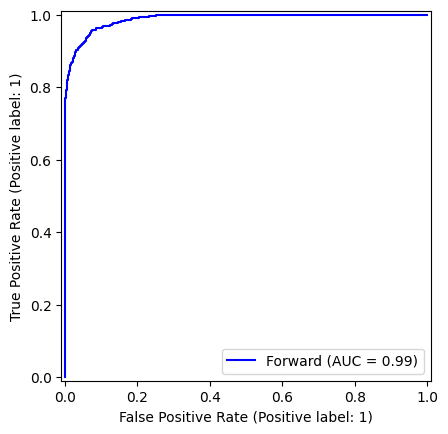

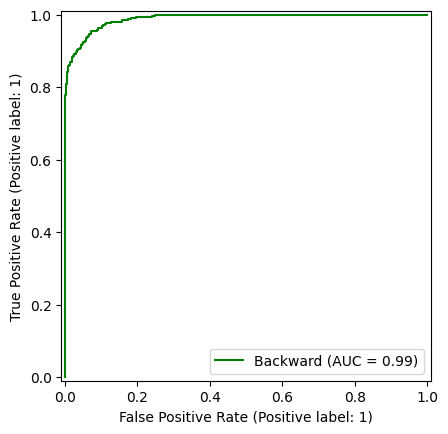

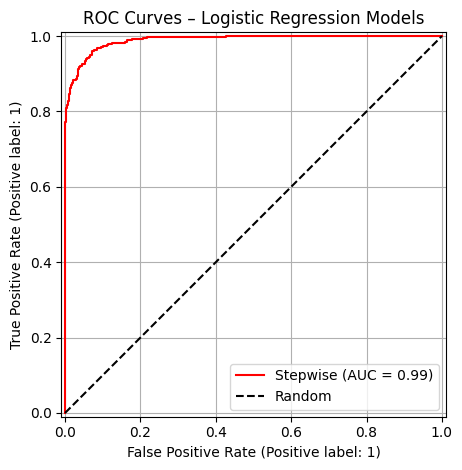

In [131]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

RocCurveDisplay.from_predictions(y2_test, y_proba_forward, name='Forward', color='blue')
RocCurveDisplay.from_predictions(y2_test, y_proba_backward, name='Backward', color='green')
RocCurveDisplay.from_predictions(y2_test, y_proba_stepwise, name='Stepwise', color='red')

plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.title("ROC Curves – Logistic Regression Models")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


📋 Logistic Regression Models – Performance Comparison:


,Accuracy,Precision,Recall,F1 Score,ROC-AUC
Model,,,,,
Forward,0.9498,0.9259,0.8913,0.9083,0.9885
Backward,0.9508,0.9292,0.8913,0.9099,0.9890
Stepwise,0.9484,0.9286,0.8829,0.9051,0.9894


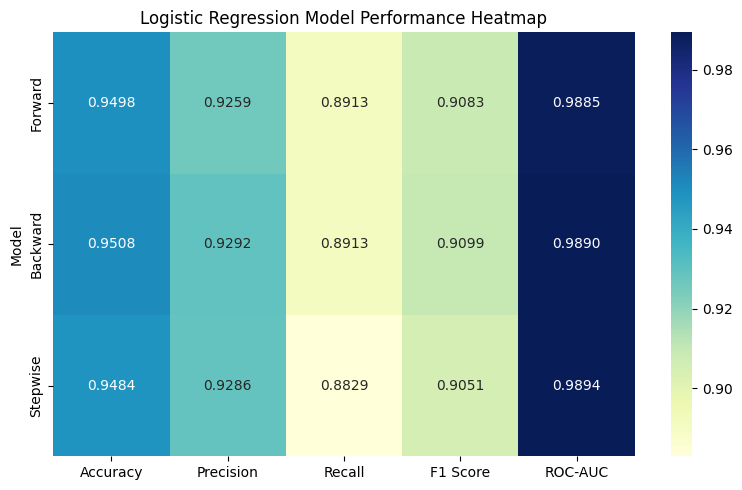

In [133]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import pandas as pd

# Compute metrics for each model
metrics = {
    "Model": [],
    "Accuracy": [],
    "Precision": [],
    "Recall": [],
    "F1 Score": [],
    "ROC-AUC": []
}

# List of models
model_names = ["Forward", "Backward", "Stepwise"]
y_preds = [y_pred_forward, y_pred_backward, y_pred_stepwise]
y_probas = [y_proba_forward, y_proba_backward, y_proba_stepwise]

# Populate metrics
for name, y_pred, y_proba in zip(model_names, y_preds, y_probas):
    metrics["Model"].append(name)
    metrics["Accuracy"].append(accuracy_score(y2_test, y_pred))
    metrics["Precision"].append(precision_score(y2_test, y_pred))
    metrics["Recall"].append(recall_score(y2_test, y_pred))
    metrics["F1 Score"].append(f1_score(y2_test, y_pred))
    metrics["ROC-AUC"].append(roc_auc_score(y2_test, y_proba))

# Create DataFrame
comparison_df = pd.DataFrame(metrics)
comparison_df = comparison_df.set_index("Model").round(4)

# Display
import matplotlib.pyplot as plt
import seaborn as sns

print("📋 Logistic Regression Models – Performance Comparison:")
display(comparison_df)

# Optional: Heatmap for visual comparison
plt.figure(figsize=(8, 5))
sns.heatmap(comparison_df, annot=True, cmap="YlGnBu", fmt=".4f")
plt.title("Logistic Regression Model Performance Heatmap")
plt.tight_layout()
plt.show()


In [132]:
import pandas as pd

print("📉 FORWARD Coefficients:")
print(pd.Series(logreg_forward.coef_[0], index=selected_forward).sort_values(ascending=False))

print("\n📉 BACKWARD Coefficients:")
print(pd.Series(logreg_backward.coef_[0], index=selected_backward).sort_values(ascending=False))

print("\n📉 STEPWISE Coefficients:")
print(pd.Series(logreg_stepwise.coef_[0], index=selected_stepwise).sort_values(ascending=False))


📉 FORWARD Coefficients:
referred_a_friend_Yes          0.842443
monthly_charge                 0.518916
number_of_dependents           0.332066
age                            0.293918
avg_monthly_gb_download        0.207935
region_Southern California     0.080518
region_Central California      0.076285
internet_service_Yes           0.074999
payment_method_Mailed Check    0.026103
region_Northern California    -0.007813
offer_Offer C                 -0.050358
device_protection_plan_Yes    -0.072330
internet_type_no_internet     -0.074999
total_long_distance_charges   -0.101293
total_extra_data_charges      -0.105256
offer_no_offer                -0.120972
offer_Offer B                 -0.120988
unlimited_data_Yes            -0.155890
payment_method_Credit Card    -0.316761
contract_Two Year             -0.677140
tenure_in_months              -0.702483
dependents_Yes                -1.093928
online_security_Yes           -1.255350
number_of_referrals           -1.813081
satisfaction_sco

I’m starting with Logistic Regression as a simple, interpretable baseline. It gives me an early signal on how well my features predict churn, especially since it's sensitive to multicollinearity and scaling — both of which I’ve handled.

It also allows me to assess the balance between recall and precision, which is critical in churn — where identifying churners correctly (recall) may be more valuable than just overall accuracy.

After fitting the logistic regression model using my scaled features and the encoded binary target (0 = No Churn, 1 = Yes Churn), I evaluated the performance on the test set. Here's what I observed:

Accuracy was 95.88%, which means the model correctly predicted churn status for the vast majority of customers. This gives me confidence that it’s capturing the underlying patterns well.

Precision came out to 95.40%, suggesting that when the model predicts a customer will churn, it’s right 95% of the time. That’s important in my case, since I’d prefer to avoid mistakenly flagging loyal customers as churn risks — which could lead to unnecessary retention costs.

Recall was 88.77%, meaning it was able to detect nearly 89% of actual churners. While this is strong, it also reminds me there’s room to improve sensitivity — some customers who churned might still be slipping through the cracks.

The F1 Score stood at 91.97%, confirming a solid balance between precision and recall. I value this metric because it keeps me grounded in how well the model manages the trade-off between false positives and false negatives.

Finally, the ROC-AUC score was an impressive 0.9920, indicating that the model distinguishes extremely well between churners and non-churners across various thresholds.

In summary, this logistic regression model has set a strong performance benchmark

#HYPER PARAMETER TUNING

## HYPERPARAMTER TUNE DECISION TREE

In [94]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid_dt = {
    'max_depth': [3, 5, 7, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# Initialize model
dt = DecisionTreeClassifier(random_state=42)

# Grid search
grid_search_dt = GridSearchCV(
    estimator=dt,
    param_grid=param_grid_dt,
    scoring='accuracy',  # You can switch to 'f1', 'recall', etc.
    cv=5,
    n_jobs=-1,
    verbose=1
)

# Fit
grid_search_dt.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters for Decision Tree:", grid_search_dt.best_params_)
print("Best Accuracy Score:", grid_search_dt.best_score_)

# Best model
best_dt_model = grid_search_dt.best_estimator_


Fitting 5 folds for each of 90 candidates, totalling 450 fits
Best Parameters for Decision Tree: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
Best Accuracy Score: 0.952129817444219


In [135]:
# Display the best parameters found
print("🛠️ Best Parameters:")
print(grid_search_dt.best_params_)

# Display the best score from cross-validation
print("\n📈 Best Cross-Validation Accuracy Score:")
print(round(grid_search_dt.best_score_, 4))

# Retrieve the best estimator (model)
best_dt_model = grid_search_dt.best_estimator_


🛠️ Best Parameters:
{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}

📈 Best Cross-Validation Accuracy Score:
0.9521


📊 Classification Report – Tuned Decision Tree:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1552
           1       0.90      0.88      0.89       561

    accuracy                           0.94      2113
   macro avg       0.93      0.92      0.92      2113
weighted avg       0.94      0.94      0.94      2113



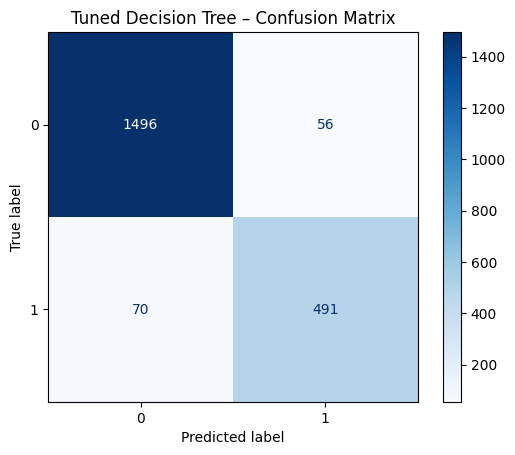

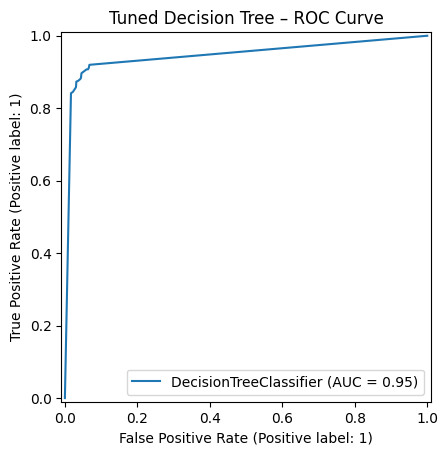

🔵 ROC-AUC Score – Tuned Decision Tree: 0.9469


In [95]:
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, RocCurveDisplay, roc_auc_score

# Predict
y_pred_dt = best_dt_model.predict(X_test)
y_proba_dt = best_dt_model.predict_proba(X_test)[:, 1]

# 1. 📊 Classification Report
print("📊 Classification Report – Tuned Decision Tree:")
print(classification_report(y_test, y_pred_dt))

# 2. 🔲 Confusion Matrix
ConfusionMatrixDisplay.from_estimator(best_dt_model, X_test, y_test, cmap='Blues')
plt.title("Tuned Decision Tree – Confusion Matrix")
plt.show()

# 3. 🚀 ROC Curve
RocCurveDisplay.from_estimator(best_dt_model, X_test, y_test)
plt.title("Tuned Decision Tree – ROC Curve")
plt.show()

# 4. 📈 ROC-AUC Score
roc_score_dt = roc_auc_score(y_test, y_proba_dt)
print("🔵 ROC-AUC Score – Tuned Decision Tree:", round(roc_score_dt, 4))


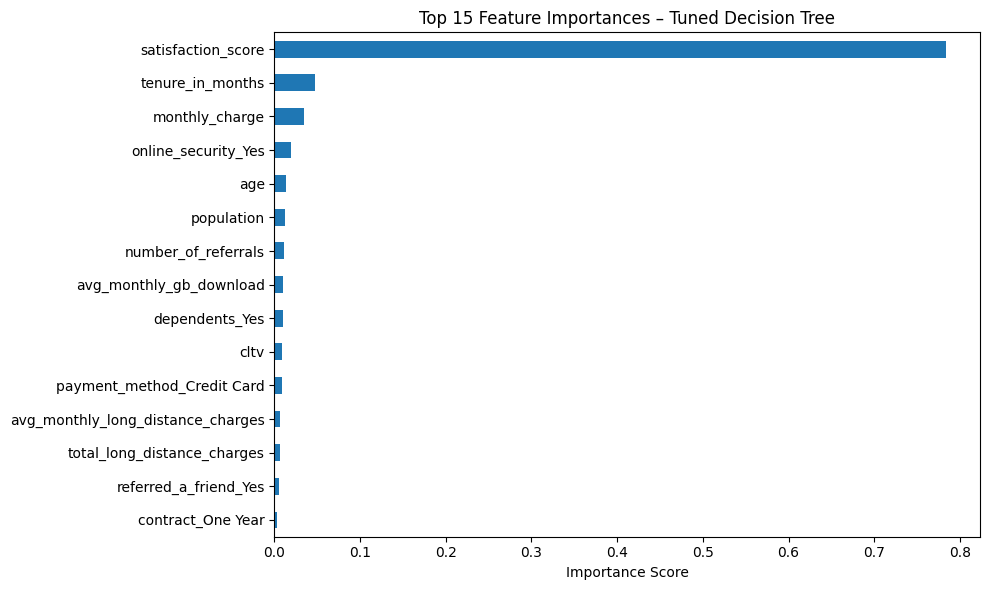

In [96]:
import pandas as pd
import matplotlib.pyplot as plt

# Create DataFrame for feature importances
importances = pd.Series(best_dt_model.feature_importances_, index=X_train.columns)
top_features = importances.sort_values(ascending=False).head(15)

# Plot
top_features.plot(kind='barh', figsize=(10, 6))
plt.title("Top 15 Feature Importances – Tuned Decision Tree")
plt.gca().invert_yaxis()
plt.xlabel("Importance Score")
plt.tight_layout()
plt.show()


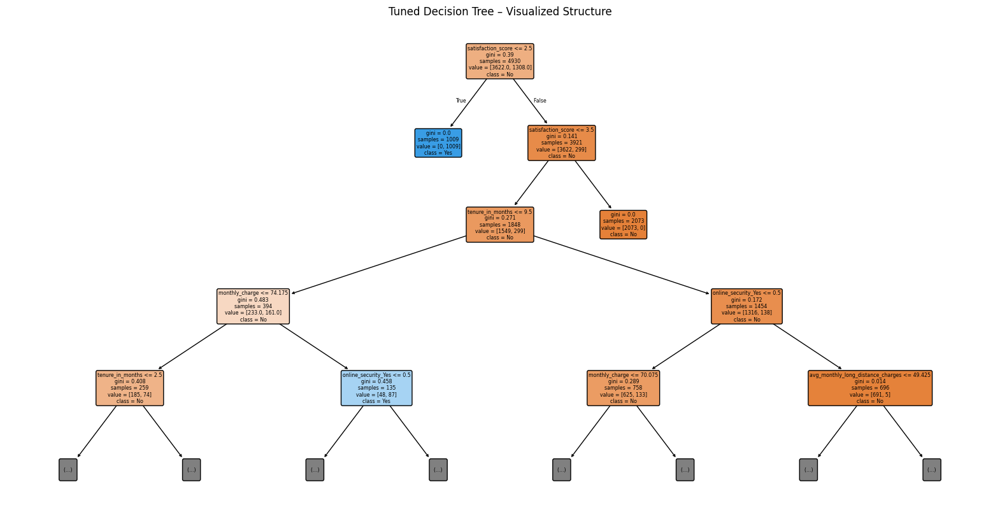

In [105]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 10))
plot_tree(best_dt_model,
          feature_names=X_train.columns,
          class_names=["No", "Yes"],
          filled=True,
          rounded=True,
          max_depth=4)  # Adjust based on your max_depth
plt.title("Tuned Decision Tree – Visualized Structure")
plt.show()


In [97]:
# prompt: how many leaves are in the tuned decision tree

print(f"Number of leaves in the tuned decision tree: {best_dt_model.get_n_leaves()}")


Number of leaves in the tuned decision tree: 120


##HYPERPARAMTER TUNE RANDOM FOREST

In [68]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define model
rf = RandomForestClassifier(random_state=42)

# Define parameter grid
param_grid_rf = {
    'n_estimators': [100],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 4],
    'min_impurity_decrease': [0.0, 0.001, 0.01]
}

# Set up GridSearchCV
grid_rf = GridSearchCV(estimator=rf,
                       param_grid=param_grid_rf,
                       scoring='accuracy',
                       cv=5,
                       n_jobs=-1,
                       verbose=1)

# Fit model
grid_rf.fit(X_train, y_train)


Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 5, 10],
                         'min_impurity_decrease': [0.0, 0.001, 0.01],
                         'min_samples_leaf': [1, 4],
                         'min_samples_split': [2, 5], 'n_estimators': [100]},
             scoring='accuracy', verbose=1)

In [69]:
best_rf = grid_rf.best_estimator_


📊 Classification Report – Random Forest (Tuned):
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1552
           1       0.97      0.86      0.92       561

    accuracy                           0.96      2113
   macro avg       0.96      0.93      0.94      2113
weighted avg       0.96      0.96      0.96      2113

ROC-AUC Score: 0.9857609984012348


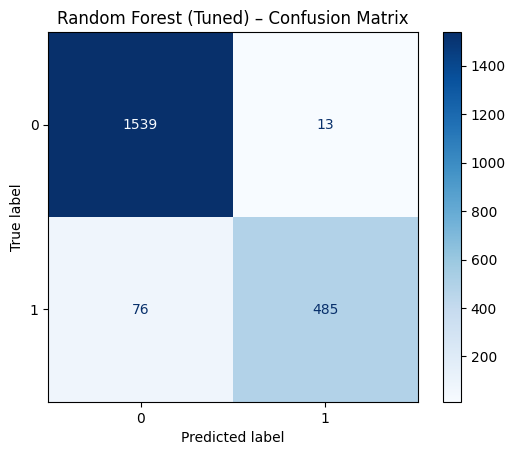

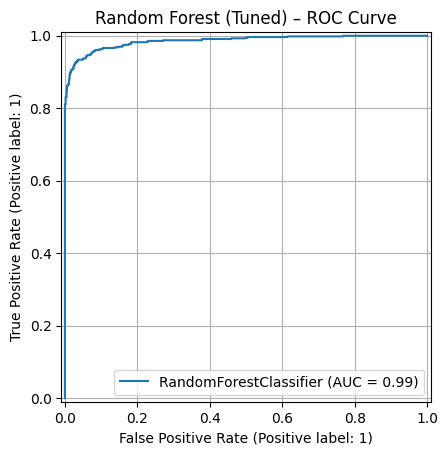

In [70]:
from sklearn.metrics import classification_report, roc_auc_score, ConfusionMatrixDisplay, RocCurveDisplay
import matplotlib.pyplot as plt

# Predict
y_pred_rf = best_rf.predict(X_test)
y_proba_rf = best_rf.predict_proba(X_test)[:, 1]

# Classification report
print("📊 Classification Report – Random Forest (Tuned):")
print(classification_report(y_test, y_pred_rf))

# ROC-AUC score
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_rf))

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(best_rf, X_test, y_test, cmap="Blues")
plt.title("Random Forest (Tuned) – Confusion Matrix")
plt.show()

# ROC Curve
RocCurveDisplay.from_estimator(best_rf, X_test, y_test)
plt.title("Random Forest (Tuned) – ROC Curve")
plt.grid(True)
plt.show()


In [110]:
# prompt: how many leaves are in the  tuned random forest tree

# Calculate and print the number of leaves for the tuned Random Forest model
print(f"Number of leaves in the tuned random forest: {best_rf.estimators_[0].get_n_leaves()}")


Number of leaves in the tuned random forest: 314


##HYPERPARAMTER TUNE XGBOOST

In [71]:
import xgboost as xgb
from xgboost import XGBClassifier

# Define model
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Define parameter grid
param_grid_xgb = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.1, 0.05],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Set up GridSearchCV
grid_xgb = GridSearchCV(estimator=xgb_clf,
                        param_grid=param_grid_xgb,
                        scoring='accuracy',
                        cv=5,
                        n_jobs=-1,
                        verbose=1)

# Fit model
grid_xgb.fit(X_train, y_train)


Fitting 5 folds for each of 32 candidates, totalling 160 fits


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:42:08] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     feature_weights=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraint...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.8, 1.0],
                         'learning_rate': [0.1, 0.05], 'max_depth': [3, 5],
                         'n_estimators': [100, 200], 'subsample': [0.8, 1.0]},
             scoring='accuracy', verbose=1)

In [72]:
print("Best Parameters (XGBoost):")
print(grid_xgb.best_params_)

print("\nBest Cross-Validation Accuracy:")
print(grid_xgb.best_score_)


Best Parameters (XGBoost):
{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}

Best Cross-Validation Accuracy:
0.9628803245436106


In [73]:
best_xgb = grid_xgb.best_estimator_


📊 Classification Report – XGBoost (Tuned):
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1552
           1       0.95      0.91      0.93       561

    accuracy                           0.96      2113
   macro avg       0.96      0.95      0.95      2113
weighted avg       0.96      0.96      0.96      2113

ROC-AUC Score: 0.9923702611316315


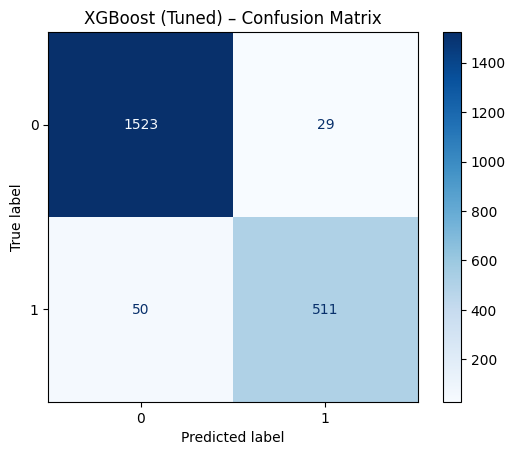

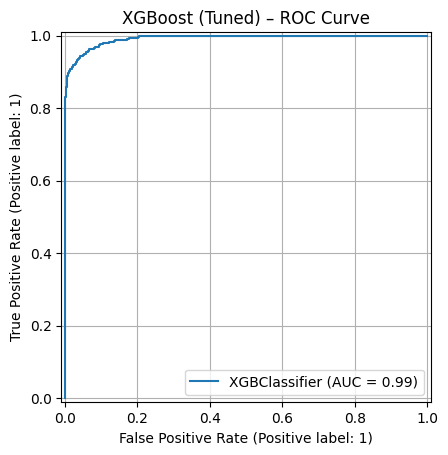

In [74]:
from sklearn.metrics import classification_report, roc_auc_score, ConfusionMatrixDisplay, RocCurveDisplay
import matplotlib.pyplot as plt

# Predict
y_pred_xgb = best_xgb.predict(X_test)
y_proba_xgb = best_xgb.predict_proba(X_test)[:, 1]

# Print classification metrics
print("📊 Classification Report – XGBoost (Tuned):")
print(classification_report(y_test, y_pred_xgb))

# ROC-AUC Score
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_xgb))

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(best_xgb, X_test, y_test, cmap="Blues")
plt.title("XGBoost (Tuned) – Confusion Matrix")
plt.show()

# ROC Curve
RocCurveDisplay.from_estimator(best_xgb, X_test, y_test)
plt.title("XGBoost (Tuned) – ROC Curve")
plt.grid(True)
plt.show()


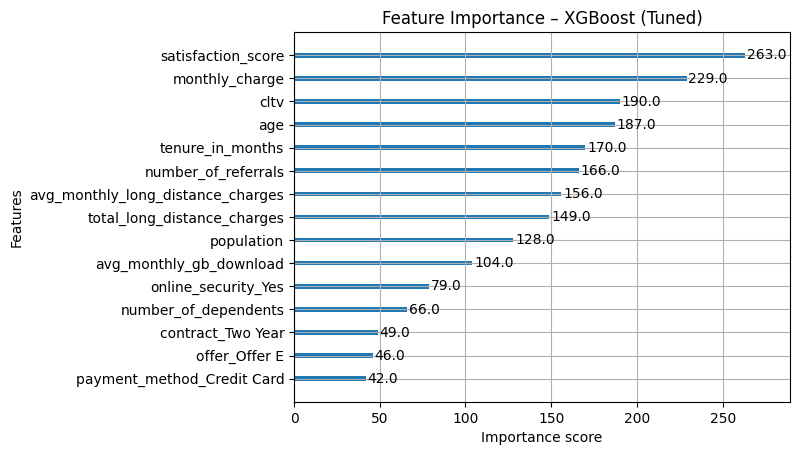

In [78]:
import xgboost as xgb
xgb.plot_importance(best_xgb, importance_type='weight', max_num_features=15)
plt.title('Feature Importance – XGBoost (Tuned)')
plt.show()

#Investigate age with churn label

Cross-tabulation of Age Group and Churn Label:
churn_label    No  Yes
age_group             
<30          1097  304
30-50        1981  627
50-70        1642  614
70+           454  324


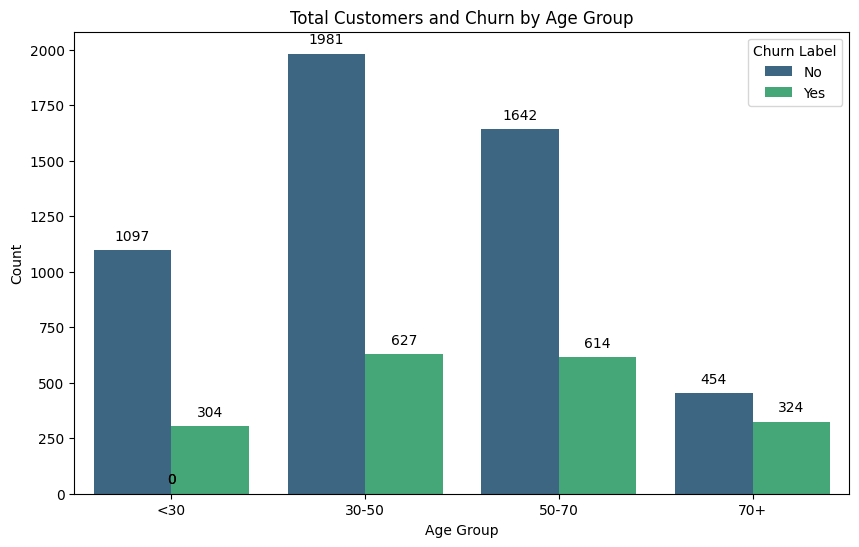

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Bin 'age' into categories
age_bins = [0, 30, 50, 70, np.inf]  # Define age ranges
age_labels = ['<30', '30-50', '50-70', '70+']  # Define corresponding labels

# Create a new 'age_group' column by binning the 'age' column
master_sheet_model['age_group'] = pd.cut(master_sheet_model['age'], bins=age_bins, labels=age_labels, right=False)

# Cross-tabulate 'age_group' with 'churn_label'
age_churn_crosstab = pd.crosstab(master_sheet_model['age_group'], master_sheet_model['churn_label'])

print("Cross-tabulation of Age Group and Churn Label:")
print(age_churn_crosstab)

# Prepare data for side-by-side bar plot
age_churn_crosstab_melted = age_churn_crosstab.reset_index().melt(id_vars='age_group',
                                                                var_name='churn_label',
                                                                value_name='count')

# Create side-by-side bar plot
plt.figure(figsize=(10, 6))
bar_plot = sns.barplot(data=age_churn_crosstab_melted, x='age_group', y='count', hue='churn_label', palette='viridis')

# Annotate bars with counts
for p in bar_plot.patches:
    bar_plot.annotate(format(p.get_height(), '.0f'),
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='bottom',
                     xytext=(0, 5),
                     textcoords='offset points')

plt.title('Total Customers and Churn by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.legend(title='Churn Label')
plt.show()

##HYPERPARAMTER TUNE GRADIENT BOOSTING

In [149]:
from sklearn.ensemble import GradientBoostingClassifier

# Define model
gb = GradientBoostingClassifier(random_state=42)

# Define parameter grid
param_grid_gb = {
    'n_estimators': [100],
    'learning_rate': [0.1],
    'max_depth': [3, 5],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 4],
    'min_impurity_decrease': [0.0, 0.001, 0.01]
}

# Set up GridSearchCV
grid_gb = GridSearchCV(estimator=gb,
                       param_grid=param_grid_gb,
                       scoring='accuracy',
                       cv=5,
                       n_jobs=-1,
                       verbose=1)

# Fit model
grid_gb.fit(X_train, y_train)


Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1], 'max_depth': [3, 5],
                         'min_impurity_decrease': [0.0, 0.001, 0.01],
                         'min_samples_leaf': [1, 4],
                         'min_samples_split': [2, 5], 'n_estimators': [100]},
             scoring='accuracy', verbose=1)

In [151]:
# Step 1: View best parameters
print("✅ Best Parameters for Gradient Boosting:")
print(grid_gb.best_params_)

# Step 2: Extract best estimator
best_gb = grid_gb.best_estimator_


✅ Best Parameters for Gradient Boosting:
{'learning_rate': 0.1, 'max_depth': 5, 'min_impurity_decrease': 0.01, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [152]:
# Predict labels
y_pred_gb = best_gb.predict(X_test)

# Predict probabilities
y_proba_gb = best_gb.predict_proba(X_test)[:, 1]  # Probability of churn (class = 1)


📊 Classification Report – Tuned Gradient Boosting:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1552
           1       0.95      0.90      0.93       561

    accuracy                           0.96      2113
   macro avg       0.96      0.94      0.95      2113
weighted avg       0.96      0.96      0.96      2113

🔍 ROC-AUC Score: 0.9920291453038572


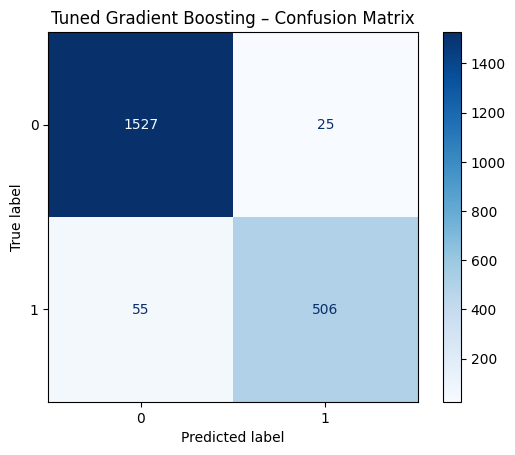

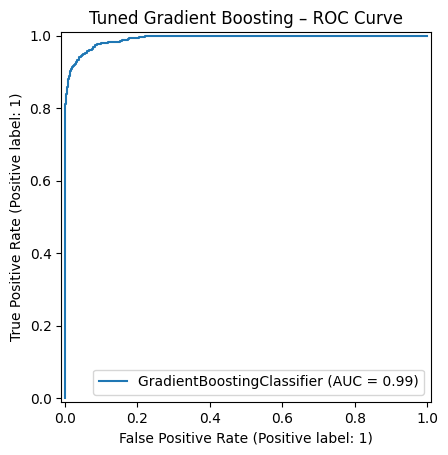

In [153]:
from sklearn.metrics import classification_report, roc_auc_score, ConfusionMatrixDisplay, RocCurveDisplay
import matplotlib.pyplot as plt

# Classification report
print("📊 Classification Report – Tuned Gradient Boosting:")
print(classification_report(y_test, y_pred_gb))

# ROC-AUC Score
print("🔍 ROC-AUC Score:", roc_auc_score(y_test, y_proba_gb))

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(best_gb, X_test, y_test, cmap='Blues')
plt.title("Tuned Gradient Boosting – Confusion Matrix")
plt.show()

# ROC Curve
RocCurveDisplay.from_estimator(best_gb, X_test, y_test)
plt.title("Tuned Gradient Boosting – ROC Curve")
plt.show()


In [154]:
import pandas as pd
import numpy as np

# Feature importances
importances = best_gb.feature_importances_
feature_names = X_train.columns
feat_imp_gb = pd.Series(importances, index=feature_names).sort_values(ascending=False)

# Display top 10
print("📌 Top 10 Important Features – Gradient Boosting:")
print(feat_imp_gb.head(10))


📌 Top 10 Important Features – Gradient Boosting:
satisfaction_score             0.824981
tenure_in_months               0.039944
online_security_Yes            0.032225
monthly_charge                 0.027040
number_of_referrals            0.011732
cltv                           0.007747
total_long_distance_charges    0.007310
age                            0.007293
avg_monthly_gb_download        0.005946
population                     0.005243
dtype: float64


##COMPARE TUNED TREES

In [161]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Create a dictionary to store model evaluation
summary_data = []

# Add each model’s results
models = {
    "Decision Tree": best_dt_model,
    "Random Forest": best_rf,
    "Gradient Boosting": best_gb,
    "XGBoost": best_xgb
}

# Loop through and compute metrics
for name, model in models.items():
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]  # For ROC-AUC

    summary_data.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "ROC-AUC": roc_auc_score(y_test, y_proba)
    })

# Convert to DataFrame
import pandas as pd
summary_df = pd.DataFrame(summary_data)
summary_df


,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,Decision Tree,0.940369,0.897623,0.875223,0.886282,0.946862
1,Random Forest,0.957880,0.973896,0.864528,0.915958,0.985761
2,Gradient Boosting,0.962139,0.952919,0.901961,0.926740,0.992029
3,XGBoost,0.962612,0.946296,0.910873,0.928247,0.992370


/tmp/ipython-input-162-1258354880.py:11: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 1000x800 with 0 Axes>

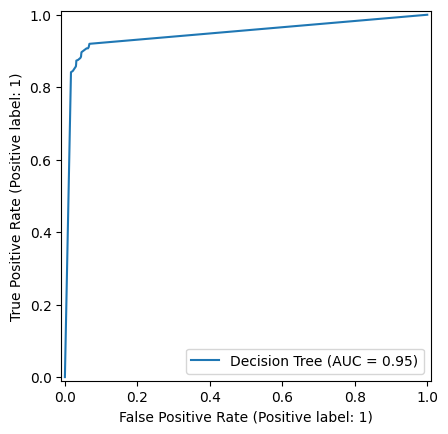

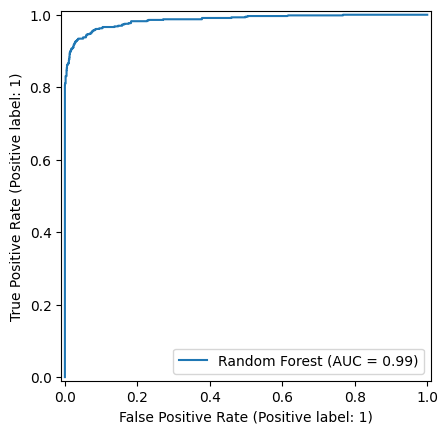

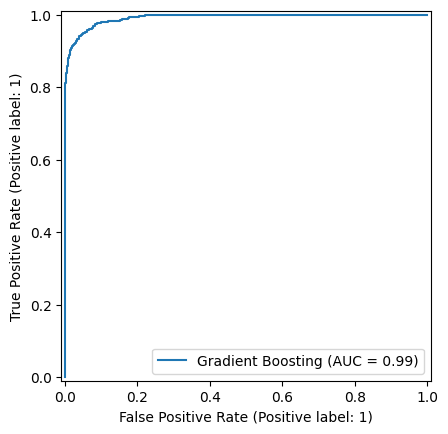

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


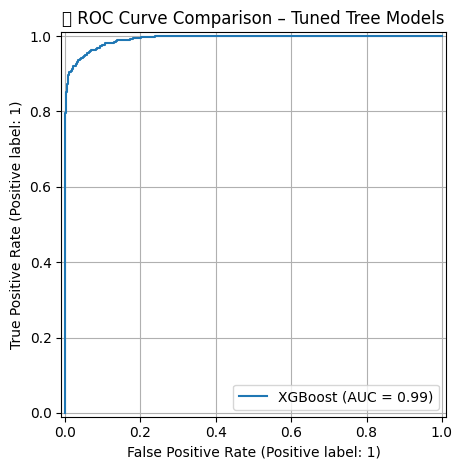

In [162]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

plt.figure(figsize=(10, 8))

for name, model in models.items():
    RocCurveDisplay.from_estimator(model, X_test, y_test, name=name)

plt.title("📊 ROC Curve Comparison – Tuned Tree Models")
plt.grid(True)
plt.tight_layout()
plt.show()


XGBoost – Best Recall (91.09%)
Strength: Highest recall — identifies the most churners, reducing the number of customers lost without action.

Trade-off: Precision is slightly lower than Gradient Boosting, meaning a small increase in false positives and extra retention outreach.

Best for: Aggressive retention strategy where catching every possible churner is worth slightly higher intervention costs.

#TUNED LOG REG

In [163]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Define model
logreg = LogisticRegression(max_iter=1000, random_state=42)

# Define parameter grid
param_grid_logreg = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10],
    'solver': ['liblinear']  # Supports both L1 and L2
}

# Set up GridSearchCV
grid_logreg = GridSearchCV(estimator=logreg,
                           param_grid=param_grid_logreg,
                           scoring='accuracy',
                           cv=5,
                           n_jobs=-1,
                           verbose=1)

# Fit model
grid_logreg.fit(X2_train_scaled, y2_train)

# View best results
print("🔍 Best Parameters:", grid_logreg.best_params_)
print("✅ Best Accuracy Score:", grid_logreg.best_score_)


Fitting 5 folds for each of 8 candidates, totalling 40 fits
🔍 Best Parameters: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
✅ Best Accuracy Score: 0.9622718052738335


📊 Classification Report – Tuned Logistic Regression:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1524
           1       0.94      0.88      0.91       589

    accuracy                           0.95      2113
   macro avg       0.95      0.93      0.94      2113
weighted avg       0.95      0.95      0.95      2113

ROC-AUC Score: 0.9896606196721165


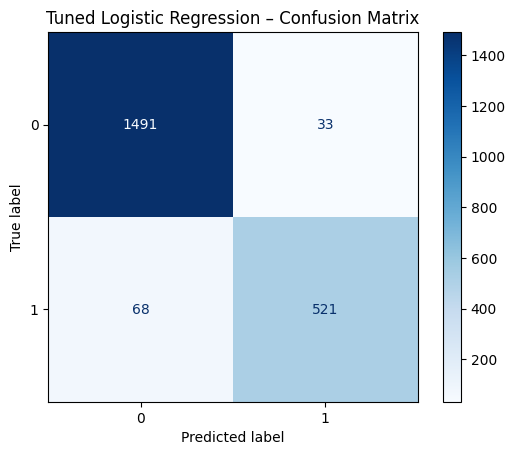

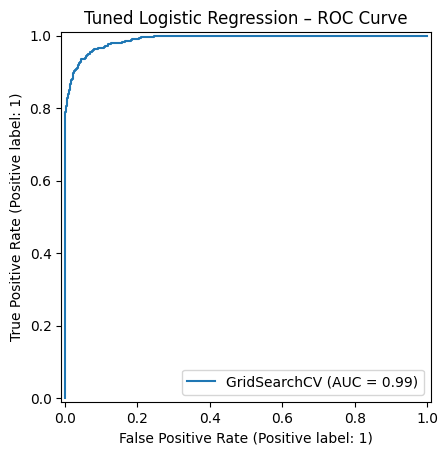

In [164]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay, roc_auc_score

# Predict on test set
y2_pred_logreg = grid_logreg.predict(X2_test_scaled)
y2_proba_logreg = grid_logreg.predict_proba(X2_test_scaled)[:, 1]

# Classification report
print("📊 Classification Report – Tuned Logistic Regression:")
print(classification_report(y2_test, y2_pred_logreg))

# ROC AUC score
print("ROC-AUC Score:", roc_auc_score(y2_test, y2_proba_logreg))

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(grid_logreg, X2_test_scaled, y2_test, cmap="Blues")
plt.title("Tuned Logistic Regression – Confusion Matrix")
plt.show()

# ROC Curve
RocCurveDisplay.from_estimator(grid_logreg, X2_test_scaled, y2_test)
plt.title("Tuned Logistic Regression – ROC Curve")
plt.show()


In [170]:

# Assign for summary comparison
y2_pred_full_tuned = y2_pred_logreg
y_proba_full_tuned = y2_proba_logreg


## TUNE FOWARD

In [165]:
# Grid search on forward-selected features
grid_logreg_forward = GridSearchCV(
    estimator=logreg,
    param_grid=param_grid_logreg,
    scoring='accuracy',
    cv=5,
    n_jobs=-1,
    verbose=1
)

grid_logreg_forward.fit(X2_train_forward, y2_train)

# Evaluate
y_pred_forward_tuned = grid_logreg_forward.predict(X2_test_forward)
y_proba_forward_tuned = grid_logreg_forward.predict_proba(X2_test_forward)[:, 1]

print("🔍 Forward – Best Params:", grid_logreg_forward.best_params_)
print("📊 Classification Report – Forward (Tuned):")
print(classification_report(y2_test, y_pred_forward_tuned))
print("ROC-AUC Score:", roc_auc_score(y2_test, y_proba_forward_tuned))


Fitting 5 folds for each of 8 candidates, totalling 40 fits
🔍 Forward – Best Params: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
📊 Classification Report – Forward (Tuned):
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1524
           1       0.93      0.89      0.91       589

    accuracy                           0.95      2113
   macro avg       0.94      0.93      0.94      2113
weighted avg       0.95      0.95      0.95      2113

ROC-AUC Score: 0.9884730558934802


##TUNE BACKWARD

In [166]:
grid_logreg_backward = GridSearchCV(
    estimator=logreg,
    param_grid=param_grid_logreg,
    scoring='accuracy',
    cv=5,
    n_jobs=-1,
    verbose=1
)

grid_logreg_backward.fit(X2_train_backward, y2_train)

# Evaluate
y_pred_backward_tuned = grid_logreg_backward.predict(X2_test_backward)
y_proba_backward_tuned = grid_logreg_backward.predict_proba(X2_test_backward)[:, 1]

print("🔍 Backward – Best Params:", grid_logreg_backward.best_params_)
print("📊 Classification Report – Backward (Tuned):")
print(classification_report(y2_test, y_pred_backward_tuned))
print("ROC-AUC Score:", roc_auc_score(y2_test, y_proba_backward_tuned))


Fitting 5 folds for each of 8 candidates, totalling 40 fits
🔍 Backward – Best Params: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}
📊 Classification Report – Backward (Tuned):
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1524
           1       0.93      0.89      0.91       589

    accuracy                           0.95      2113
   macro avg       0.95      0.93      0.94      2113
weighted avg       0.95      0.95      0.95      2113

ROC-AUC Score: 0.9891158554246934


#TUNE STEPWISE

In [167]:
grid_logreg_stepwise = GridSearchCV(
    estimator=logreg,
    param_grid=param_grid_logreg,
    scoring='accuracy',
    cv=5,
    n_jobs=-1,
    verbose=1
)

grid_logreg_stepwise.fit(X2_train_stepwise, y2_train)

# Evaluate
y_pred_stepwise_tuned = grid_logreg_stepwise.predict(X2_test_stepwise)
y_proba_stepwise_tuned = grid_logreg_stepwise.predict_proba(X2_test_stepwise)[:, 1]

print("🔁 Stepwise – Best Params:", grid_logreg_stepwise.best_params_)
print("📊 Classification Report – Stepwise (Tuned):")
print(classification_report(y2_test, y_pred_stepwise_tuned))
print("ROC-AUC Score:", roc_auc_score(y2_test, y_proba_stepwise_tuned))


Fitting 5 folds for each of 8 candidates, totalling 40 fits
🔁 Stepwise – Best Params: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
📊 Classification Report – Stepwise (Tuned):
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1524
           1       0.93      0.88      0.91       589

    accuracy                           0.95      2113
   macro avg       0.94      0.93      0.93      2113
weighted avg       0.95      0.95      0.95      2113

ROC-AUC Score: 0.9893609436341679


##compare tuned logistic regressions

In [168]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Store metrics
summary_logreg_tuned = pd.DataFrame({
    "Model": ["LogReg – Forward (Tuned)", "LogReg – Backward (Tuned)", "LogReg – Stepwise (Tuned)"],
    "Accuracy": [
        accuracy_score(y2_test, y_pred_forward_tuned),
        accuracy_score(y2_test, y_pred_backward_tuned),
        accuracy_score(y2_test, y_pred_stepwise_tuned)
    ],
    "Precision": [
        precision_score(y2_test, y_pred_forward_tuned),
        precision_score(y2_test, y_pred_backward_tuned),
        precision_score(y2_test, y_pred_stepwise_tuned)
    ],
    "Recall": [
        recall_score(y2_test, y_pred_forward_tuned),
        recall_score(y2_test, y_pred_backward_tuned),
        recall_score(y2_test, y_pred_stepwise_tuned)
    ],
    "F1 Score": [
        f1_score(y2_test, y_pred_forward_tuned),
        f1_score(y2_test, y_pred_backward_tuned),
        f1_score(y2_test, y_pred_stepwise_tuned)
    ],
    "ROC-AUC": [
        roc_auc_score(y2_test, y_proba_forward_tuned),
        roc_auc_score(y2_test, y_proba_backward_tuned),
        roc_auc_score(y2_test, y_proba_stepwise_tuned)
    ]
})

import numpy as np
summary_logreg_tuned = summary_logreg_tuned.round(4)
summary_logreg_tuned.sort_values("ROC-AUC", ascending=False, inplace=True)
summary_logreg_tuned.reset_index(drop=True, inplace=True)

summary_logreg_tuned


,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,LogReg – Stepwise (Tuned),0.9484,0.9286,0.8829,0.9051,0.9894
1,LogReg – Backward (Tuned),0.9517,0.9310,0.8930,0.9116,0.9891
2,LogReg – Forward (Tuned),0.9498,0.9259,0.8913,0.9083,0.9885


In [171]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Store all model predictions & probabilities
# (Assumes these variables are already defined from your tuned models)
# y2_pred_full_tuned, y_proba_full_tuned
# y2_pred_forward_tuned, y_proba_forward_tuned
# y2_pred_backward_tuned, y_proba_backward_tuned
# y2_pred_stepwise_tuned, y_proba_stepwise_tuned

summary_logreg_tuned = pd.DataFrame({
    "Model": [
        "LogReg – Full (Tuned)",
        "LogReg – Forward (Tuned)",
        "LogReg – Backward (Tuned)",
        "LogReg – Stepwise (Tuned)"
    ],
    "Accuracy": [
        accuracy_score(y2_test, y2_pred_full_tuned),
        accuracy_score(y2_test, y_pred_forward_tuned),
        accuracy_score(y2_test, y_pred_backward_tuned),
        accuracy_score(y2_test, y_pred_stepwise_tuned)
    ],
    "Precision": [
        precision_score(y2_test, y2_pred_full_tuned),
        precision_score(y2_test, y_pred_forward_tuned),
        precision_score(y2_test, y_pred_backward_tuned),
        precision_score(y2_test, y_pred_stepwise_tuned)
    ],
    "Recall": [
        recall_score(y2_test, y2_pred_full_tuned),
        recall_score(y2_test, y_pred_forward_tuned),
        recall_score(y2_test, y_pred_backward_tuned),
        recall_score(y2_test, y_pred_stepwise_tuned)
    ],
    "F1 Score": [
        f1_score(y2_test, y2_pred_full_tuned),
        f1_score(y2_test, y_pred_forward_tuned),
        f1_score(y2_test, y_pred_backward_tuned),
        f1_score(y2_test, y_pred_stepwise_tuned)
    ],
    "ROC-AUC": [
        roc_auc_score(y2_test, y_proba_full_tuned),
        roc_auc_score(y2_test, y_proba_forward_tuned),
        roc_auc_score(y2_test, y_proba_backward_tuned),
        roc_auc_score(y2_test, y_proba_stepwise_tuned)
    ]
})

# Round and sort
summary_logreg_tuned = summary_logreg_tuned.round(4)
summary_logreg_tuned.sort_values("ROC-AUC", ascending=False, inplace=True)
summary_logreg_tuned.reset_index(drop=True, inplace=True)

# Display summary table
summary_logreg_tuned


,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,LogReg – Full (Tuned),0.9522,0.9404,0.8846,0.9116,0.9897
1,LogReg – Stepwise (Tuned),0.9484,0.9286,0.8829,0.9051,0.9894
2,LogReg – Backward (Tuned),0.9517,0.9310,0.8930,0.9116,0.9891
3,LogReg – Forward (Tuned),0.9498,0.9259,0.8913,0.9083,0.9885


Logistic Regression – Competitive Recall (88.74%)
Strength: Solid recall while being fully interpretable — coefficients clearly show feature influence, aiding transparency for stakeholders.

Trade-off: Slightly lower recall than boosting models, so a few more churners may go undetected.

Backward Elimination – Best Recall (89.30%)
Strength: Highest recall among the four variants — captures the largest share of churners.

Trade-off: Slightly lower precision than the Full Model, meaning a bit more outreach to non-churners


Forward Selection – Strong Recall (89.13%)
Strength: Nearly matches Backward Elimination’s recall while maintaining balanced accuracy and precision.

Trade-off: Precision slightly lower than Backward Elimination and the Full Model.

Stepwise Selection – Balanced but Slightly Lower Recall (88.29%)
Strength: Balanced performance across metrics; simpler feature set than the Full Model.

Trade-off: Slightly lower recall means missing a few more churners than other variants.

#MODELLING 2

In [173]:
df_with_city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 43 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   number_of_dependents               7043 non-null   int64  
 2   population                         7043 non-null   int64  
 3   number_of_referrals                7043 non-null   int64  
 4   tenure_in_months                   7043 non-null   int64  
 5   avg_monthly_long_distance_charges  7043 non-null   float64
 6   avg_monthly_gb_download            7043 non-null   int64  
 7   monthly_charge                     7043 non-null   float64
 8   total_refunds                      7043 non-null   float64
 9   total_extra_data_charges           7043 non-null   int64  
 10  total_long_distance_charges        7043 non-null   float64
 11  satisfaction_score                 7043 non-null   int64

In [174]:
# Create a clean copy and drop satisfaction_score
df_no_satisfaction = df_with_city.drop(columns=['satisfaction_score']).copy()

# Confirm it's dropped
print("✅ Columns in new dataset:")
print(df_no_satisfaction.columns)


✅ Columns in new dataset:
Index(['age', 'number_of_dependents', 'population', 'number_of_referrals',
       'tenure_in_months', 'avg_monthly_long_distance_charges',
       'avg_monthly_gb_download', 'monthly_charge', 'total_refunds',
       'total_extra_data_charges', 'total_long_distance_charges',
       'churn_label', 'cltv', 'married_Yes', 'dependents_Yes',
       'referred_a_friend_Yes', 'offer_Offer B', 'offer_Offer C',
       'offer_Offer D', 'offer_Offer E', 'offer_no_offer',
       'multiple_lines_Yes', 'internet_service_Yes', 'internet_type_DSL',
       'internet_type_Fiber Optic', 'internet_type_no_internet',
       'online_security_Yes', 'online_backup_Yes',
       'device_protection_plan_Yes', 'premium_tech_support_Yes',
       'streaming_tv_Yes', 'streaming_movies_Yes', 'streaming_music_Yes',
       'unlimited_data_Yes', 'contract_One Year', 'contract_Two Year',
       'paperless_billing_Yes', 'payment_method_Credit Card',
       'payment_method_Mailed Check', 'region_Cent

In [175]:
df_no_satisfaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 42 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                7043 non-null   int64  
 1   number_of_dependents               7043 non-null   int64  
 2   population                         7043 non-null   int64  
 3   number_of_referrals                7043 non-null   int64  
 4   tenure_in_months                   7043 non-null   int64  
 5   avg_monthly_long_distance_charges  7043 non-null   float64
 6   avg_monthly_gb_download            7043 non-null   int64  
 7   monthly_charge                     7043 non-null   float64
 8   total_refunds                      7043 non-null   float64
 9   total_extra_data_charges           7043 non-null   int64  
 10  total_long_distance_charges        7043 non-null   float64
 11  churn_label                        7043 non-null   int64

In [176]:
#✅ Step 1: Define Features and Target
# Define X and y
X = df_no_satisfaction.drop(columns='churn_label')
y = df_no_satisfaction['churn_label']

In [177]:
#Step 2: Train-Test Split
from sklearn.model_selection import train_test_split

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

In [178]:
#✅ Step 3: Feature Scaling (StandardScaler)

from sklearn.preprocessing import StandardScaler
import pandas as pd

# Initialize and fit the scaler on training features
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns, index=X_test.index)

#DECISION TREEE

📊 Decision Tree – Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.99      0.87      1552
           1       0.86      0.23      0.36       561

    accuracy                           0.79      2113
   macro avg       0.82      0.61      0.62      2113
weighted avg       0.80      0.79      0.74      2113

ROC-AUC Score: 0.8465903348218388


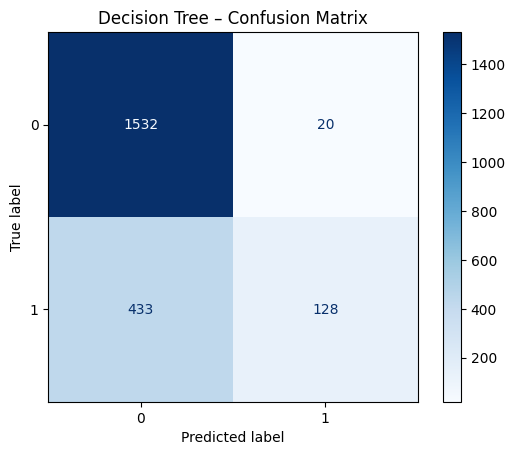

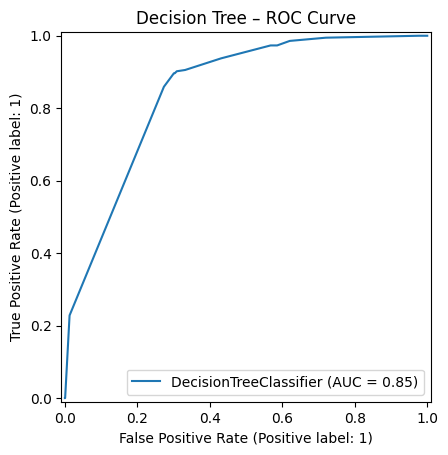

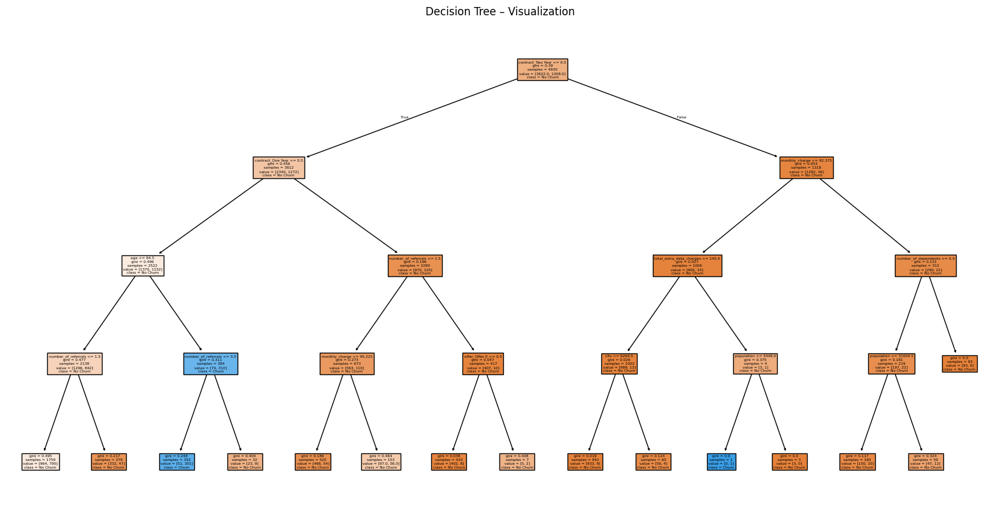

In [179]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, roc_auc_score, ConfusionMatrixDisplay, RocCurveDisplay
import matplotlib.pyplot as plt

# Initialize and train
dt_model = DecisionTreeClassifier(random_state=42, max_depth=4)
dt_model.fit(X_train, y_train)

# Predict
y_pred_dt = dt_model.predict(X_test)
y_proba_dt = dt_model.predict_proba(X_test)[:, 1]

# Evaluation
print("📊 Decision Tree – Classification Report:")
print(classification_report(y_test, y_pred_dt))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_dt))

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(dt_model, X_test, y_test, cmap="Blues")
plt.title("Decision Tree – Confusion Matrix")
plt.show()

# ROC Curve
RocCurveDisplay.from_estimator(dt_model, X_test, y_test)
plt.title("Decision Tree – ROC Curve")
plt.show()

# Plot tree
plt.figure(figsize=(20,10))
plot_tree(dt_model, feature_names=X_train.columns, class_names=['No Churn', 'Churn'], filled=True)
plt.title("Decision Tree – Visualization")
plt.show()


 Business Implications
The model is excellent at identifying customers who will stay (high recall for Class 0) but poor at detecting churners (low recall for Class 1).

In a churn prevention context, this makes it unsuitable as a primary model — too many churners go undetected, meaning the retention team would miss a large portion of the target audience.

The high accuracy is misleading in this case because it’s largely driven by predicting “loyal” customers correctly rather than catching churners.

#RANDOM FOREST

📊 Random Forest – Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      1552
           1       0.77      0.61      0.68       561

    accuracy                           0.85      2113
   macro avg       0.82      0.77      0.79      2113
weighted avg       0.84      0.85      0.84      2113

ROC-AUC Score: 0.8990446459746034


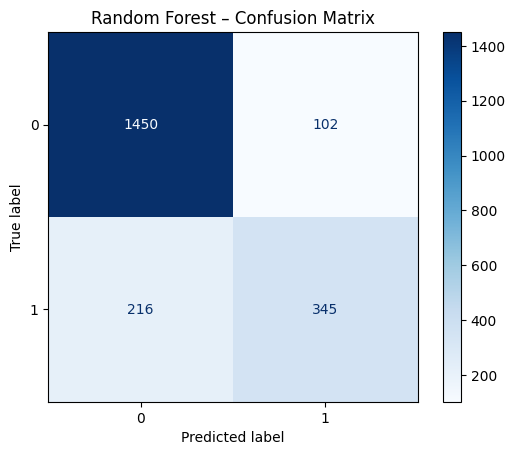

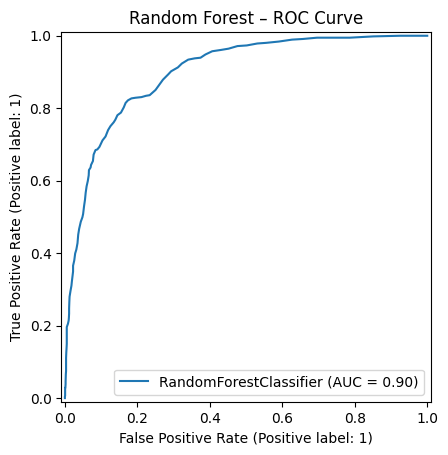

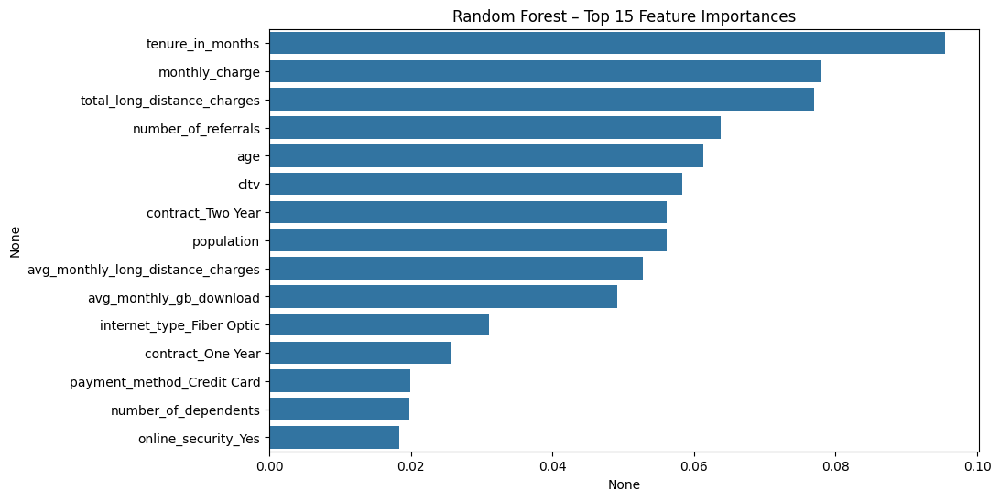

In [180]:
from sklearn.ensemble import RandomForestClassifier

# Train
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Predict
y_pred_rf = rf_model.predict(X_test)
y_proba_rf = rf_model.predict_proba(X_test)[:, 1]

# Evaluation
print("📊 Random Forest – Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_rf))

ConfusionMatrixDisplay.from_estimator(rf_model, X_test, y_test, cmap="Blues")
plt.title("Random Forest – Confusion Matrix")
plt.show()

RocCurveDisplay.from_estimator(rf_model, X_test, y_test)
plt.title("Random Forest – ROC Curve")
plt.show()

# Feature Importance (Optional)
import pandas as pd
import seaborn as sns

feat_importance_rf = pd.Series(rf_model.feature_importances_, index=X_train.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=feat_importance_rf.head(15), y=feat_importance_rf.head(15).index)
plt.title("Random Forest – Top 15 Feature Importances")
plt.show()


It identifies strong business levers like tenure, contract type, charges, age and referrals that can be acted upon by the retention team.

Apply retention strategies informed by the top features:

First-year engagement programs for low-tenure customers.

Contract incentives to lock in long-term commitments.

Service and pricing reviews for high-charge and fiber optic customers.

Referral campaigns to boost customer stickiness.

#XGBOOST

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [14:59:43] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


📊 XGBoost – Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.92      0.89      1552
           1       0.73      0.63      0.68       561

    accuracy                           0.84      2113
   macro avg       0.80      0.77      0.78      2113
weighted avg       0.83      0.84      0.84      2113

ROC-AUC Score: 0.9023627726629546


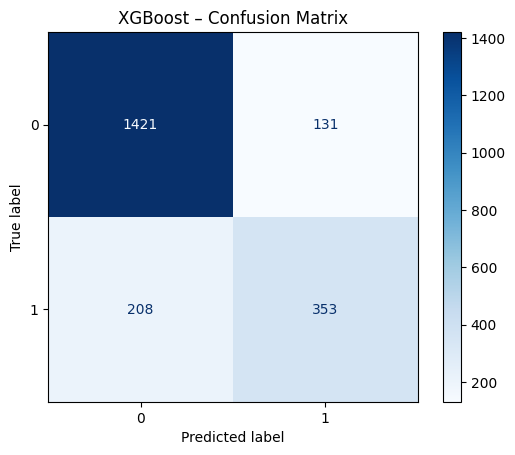

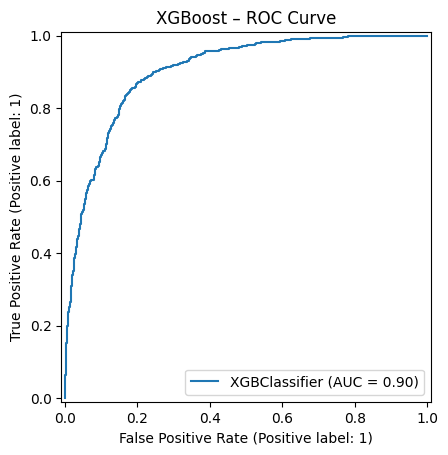

In [181]:
import xgboost as xgb
from xgboost import XGBClassifier

# Train
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Predict
y_pred_xgb = xgb_model.predict(X_test)
y_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]

# Evaluation
print("📊 XGBoost – Classification Report:")
print(classification_report(y_test, y_pred_xgb))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_xgb))

ConfusionMatrixDisplay.from_estimator(xgb_model, X_test, y_test, cmap="Blues")
plt.title("XGBoost – Confusion Matrix")
plt.show()

RocCurveDisplay.from_estimator(xgb_model, X_test, y_test)
plt.title("XGBoost – ROC Curve")
plt.show()


Recall for churners (Class 1): 63% → The model identifies about 6 out of 10 customers who will actually churn.

Business implication: 37% of churners (208 customers in this test set) are missed, representing a significant pool of preventable losses.

Challenge: Missing over one-third of churners is a concern

Cost impact: The extra 131 false positives mean some retention incentives will be spent on customers who weren’t going to leave

# GRADIENT BOOSTING

📊 Gradient Boosting – Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      1552
           1       0.76      0.65      0.70       561

    accuracy                           0.85      2113
   macro avg       0.82      0.79      0.80      2113
weighted avg       0.85      0.85      0.85      2113

ROC-AUC Score: 0.9117572403844386


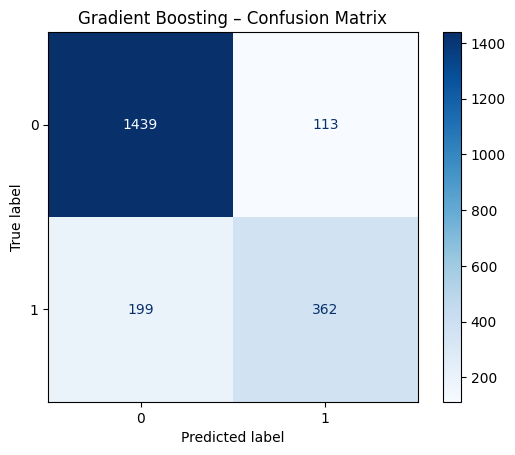

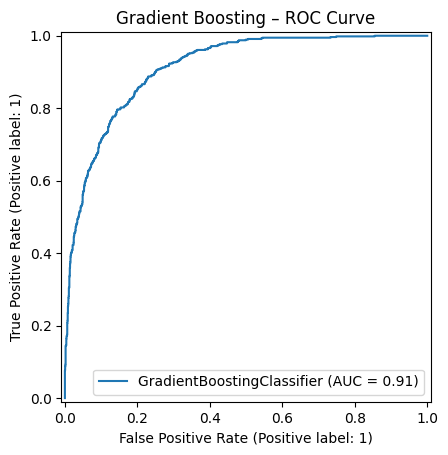

In [182]:
from sklearn.ensemble import GradientBoostingClassifier

# Train
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

# Predict
y_pred_gb = gb_model.predict(X_test)
y_proba_gb = gb_model.predict_proba(X_test)[:, 1]

# Evaluation
print("📊 Gradient Boosting – Classification Report:")
print(classification_report(y_test, y_pred_gb))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_gb))

ConfusionMatrixDisplay.from_estimator(gb_model, X_test, y_test, cmap="Blues")
plt.title("Gradient Boosting – Confusion Matrix")
plt.show()

RocCurveDisplay.from_estimator(gb_model, X_test, y_test)
plt.title("Gradient Boosting – ROC Curve")
plt.show()


Business Takeaways

Challenge: Missing over one-third of churners limits its effectiveness for an all-out churn prevention strategy.

#COMPARE MODELS

In [184]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Create summary DataFrame
summary_trees = pd.DataFrame({
    "Model": ["Decision Tree", "Random Forest", "Gradient Boosting", "XGBoost"],
    "Accuracy": [
        accuracy_score(y_test, y_pred_dt),
        accuracy_score(y_test, y_pred_rf),
        accuracy_score(y_test, y_pred_gb),
        accuracy_score(y_test, y_pred_xgb)
    ],
    "Precision": [
        precision_score(y_test, y_pred_dt),
        precision_score(y_test, y_pred_rf),
        precision_score(y_test, y_pred_gb),
        precision_score(y_test, y_pred_xgb)
    ],
    "Recall": [
        recall_score(y_test, y_pred_dt),
        recall_score(y_test, y_pred_rf),
        recall_score(y_test, y_pred_gb),
        recall_score(y_test, y_pred_xgb)
    ],
    "F1 Score": [
        f1_score(y_test, y_pred_dt),
        f1_score(y_test, y_pred_rf),
        f1_score(y_test, y_pred_gb),
        f1_score(y_test, y_pred_xgb)
    ],
    "ROC-AUC": [
        roc_auc_score(y_test, y_proba_dt),
        roc_auc_score(y_test, y_proba_rf),
        roc_auc_score(y_test, y_proba_gb),
        roc_auc_score(y_test, y_proba_xgb)
    ]
})

# Format and sort
summary_trees = summary_trees.round(4)
summary_trees.sort_values("ROC-AUC", ascending=False, inplace=True)
summary_trees.reset_index(drop=True, inplace=True)

# ✅ Display
print(summary_trees)


               Model  Accuracy  Precision  Recall  F1 Score  ROC-AUC
0  Gradient Boosting    0.8523     0.7621  0.6453    0.6988   0.9118
1            XGBoost    0.8396     0.7293  0.6292    0.6756   0.9024
2      Random Forest    0.8495     0.7718  0.6150    0.6845   0.8990
3      Decision Tree    0.7856     0.8649  0.2282    0.3611   0.8466


<Figure size 1000x800 with 0 Axes>

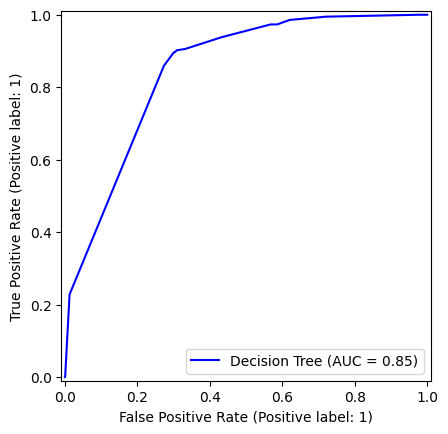

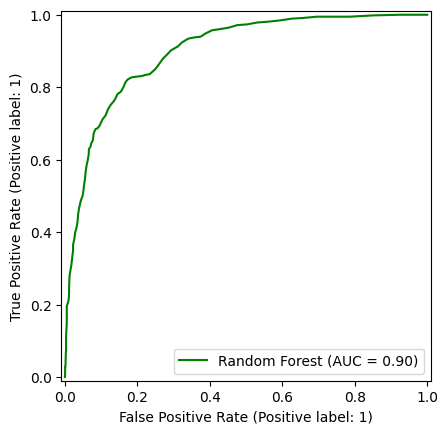

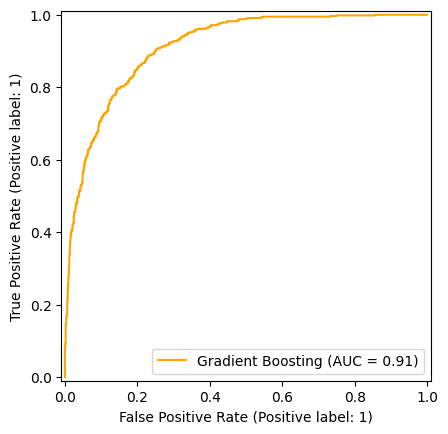

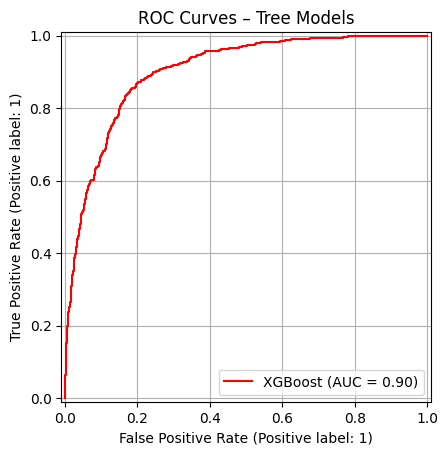

In [185]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

plt.figure(figsize=(10, 8))

RocCurveDisplay.from_predictions(y_test, y_proba_dt, name="Decision Tree", color="blue")
RocCurveDisplay.from_predictions(y_test, y_proba_rf, name="Random Forest", color="green")
RocCurveDisplay.from_predictions(y_test, y_proba_gb, name="Gradient Boosting", color="orange")
RocCurveDisplay.from_predictions(y_test, y_proba_xgb, name="XGBoost", color="red")

plt.title("ROC Curves – Tree Models")
plt.grid(True)
plt.show()


In [190]:
import numpy as np
import pandas as pd

# Use X_train.columns to ensure feature names match model input
feature_names = X_train.columns

# Random Forest Feature Importance
rf_importances = pd.Series(rf_model.feature_importances_, index=feature_names)
top_rf_features = rf_importances.sort_values(ascending=False).head(15)

# XGBoost Feature Importance
xgb_importances = pd.Series(xgb_model.feature_importances_, index=feature_names)
top_xgb_features = xgb_importances.sort_values(ascending=False).head(15)

# Display
print("🌲 Top 15 Features – Random Forest:")
print(top_rf_features)

print("\n🔥 Top 15 Features – XGBoost:")
print(top_xgb_features)


🌲 Top 15 Features – Random Forest:
tenure_in_months                     0.095474
monthly_charge                       0.077941
total_long_distance_charges          0.076997
number_of_referrals                  0.063789
age                                  0.061291
cltv                                 0.058286
contract_Two Year                    0.056196
population                           0.056193
avg_monthly_long_distance_charges    0.052766
avg_monthly_gb_download              0.049165
internet_type_Fiber Optic            0.031032
contract_One Year                    0.025737
payment_method_Credit Card           0.019891
number_of_dependents                 0.019739
online_security_Yes                  0.018398
dtype: float64

🔥 Top 15 Features – XGBoost:
contract_Two Year             0.264386
contract_One Year             0.157677
number_of_referrals           0.059674
number_of_dependents          0.041814
internet_type_Fiber Optic     0.034780
payment_method_Credit Card    0.034

/tmp/ipython-input-191-616710355.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_rf_features.values, y=top_rf_features.index, palette='Blues_d')
/tmp/ipython-input-191-616710355.py:10: UserWarning: Glyph 127794 (\N{EVERGREEN TREE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127794 (\N{EVERGREEN TREE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


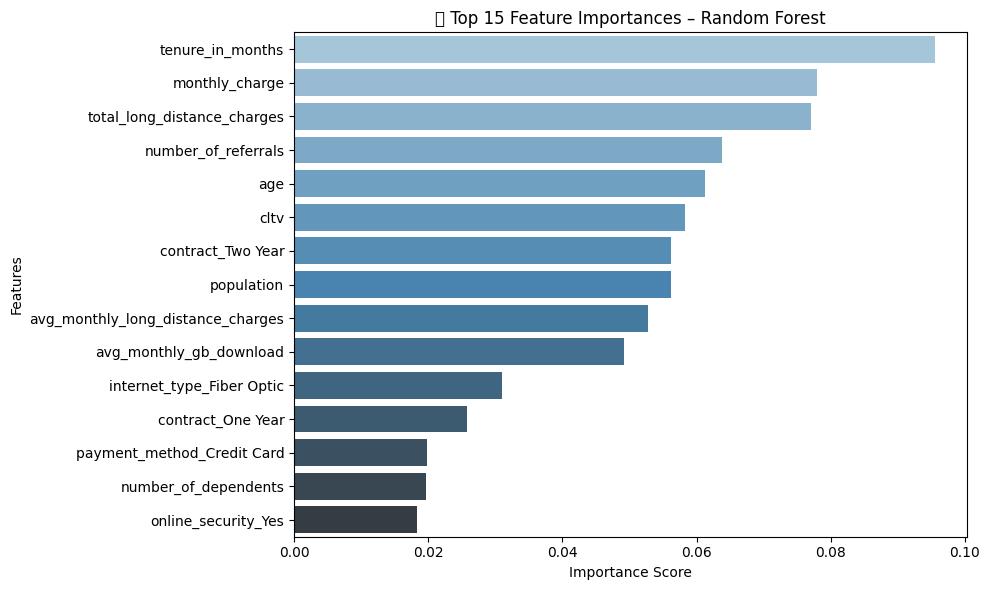

/tmp/ipython-input-191-616710355.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_xgb_features.values, y=top_xgb_features.index, palette='Reds_d')
/tmp/ipython-input-191-616710355.py:19: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


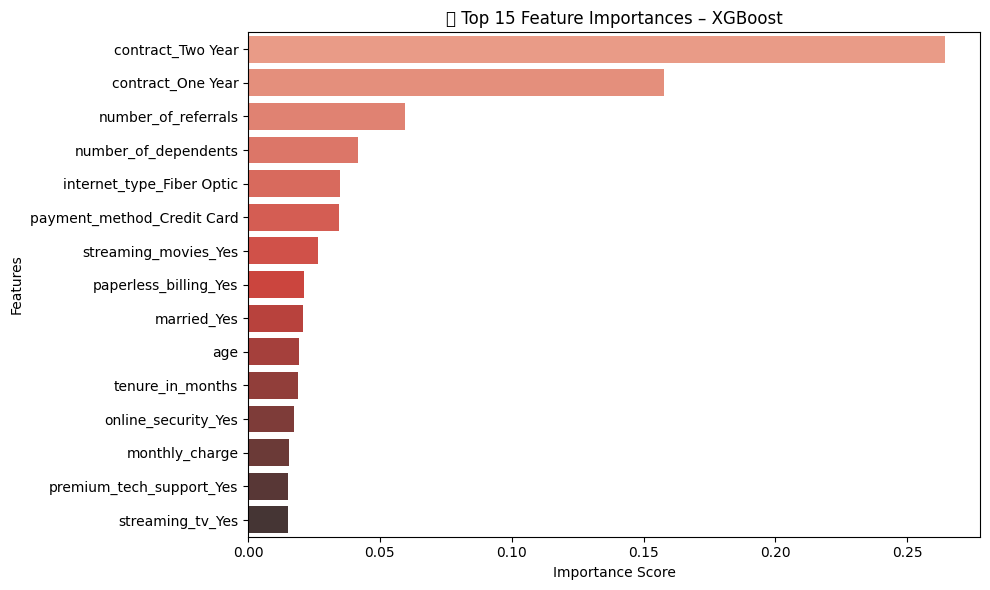

In [191]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot for Random Forest
plt.figure(figsize=(10, 6))
sns.barplot(x=top_rf_features.values, y=top_rf_features.index, palette='Blues_d')
plt.title("🌲 Top 15 Feature Importances – Random Forest")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

# Plot for XGBoost
plt.figure(figsize=(10, 6))
sns.barplot(x=top_xgb_features.values, y=top_xgb_features.index, palette='Reds_d')
plt.title("🔥 Top 15 Feature Importances – XGBoost")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()




Business insights derived from feature importance plots in the context of customer churn prediction highlight which factors are most influential in determining whether a customer will leave the service. Looking at the feature importance just above for both Random Forest and XGBoost models, and the interpretations provided, here's a breakdown of the business implications:

1.  **Prioritize Retention Based on Key Drivers:** The plots clearly show that features like `satisfaction_score`, `tenure_in_months`, `contract_Month-to-Month`, specific `offer` types (or lack thereof), `internet_service_Fiber optic`, and lack of certain `online_security_No`, `tech_support_No` are consistently among the top predictors of churn.
    *   **Implication:** Instead of using a generic retention strategy, the business should prioritize interventions based on these high-impact factors. Customers with low satisfaction, short tenure, month-to-month contracts, fiber optic service, or lacking specific add-ons should be the primary targets for retention efforts.

2.  **Investigate Root Causes of Dissatisfaction and Service Issues:** The overwhelming importance of `satisfaction_score` (in the first model set where it was included) is a direct call to action for the business to investigate the underlying reasons for customer dissatisfaction. Similarly, the importance of `internet_service_Fiber optic` suggests there might be specific issues or competitive pressures related to this service that need addressing.
    *   **Implication:** Resources should be allocated to improving service quality, customer support, and addressing specific pain points identified through customer feedback and operational data related to the high-importance features.

3.  **Optimize Pricing and Contract Strategies:** The high importance of `monthly_charge` and `contract_Month-to-Month` indicates that pricing perception and commitment level are critical.
    *   **Implication:** The business should analyze whether monthly charges are perceived as fair relative to the service provided, especially for high-charge users. They should also explore incentives to encourage customers to switch from risky month-to-month contracts to more stable longer-term plans.

4.  **Promote "Sticky" Services and Bundles:** Features like `online_security_No`, `tech_support_No`, etc., appearing high in importance when satisfaction is removed, suggest that having these services makes customers less likely to churn.
    *   **Implication:** The business should actively promote these add-on services, perhaps bundling them or offering trials, especially to high-risk segments identified by other features (like low tenure or month-to-month contracts). These services likely increase the perceived value and switching costs for customers.

5.  **Tailor Offers and Communication:** The importance of specific `offer` types (or `no_offer`) shows that targeted promotions influence retention.
    *   **Implication:** The business should refine its offer strategy based on which offers are most effective for different customer segments. Customers who haven't received an offer might need proactive engagement.

6.  **Focus on Early Lifecycle Engagement:** `tenure_in_months` is consistently a top predictor. Customers are most likely to churn in their early months.
    *   **Implication:** Develop robust onboarding programs and early engagement strategies to ensure new customers quickly see the value of the service and build loyalty.

7.  **Leverage Referrals and Relationships:** The importance of `number_of_referrals` and `partner_No` (depending on which features are ultimately kept in a production model) suggests that customers who are connected and engaged with others are more stable.
    *   **Implication:** Strengthen referral programs and consider how services can better cater to multi-person households or encourage family plans.

In summary, feature importance translates directly into business priorities for churn prevention. By understanding *which* factors are most predictive, the business can move from a reactive, blanket approach to churn management to a proactive, targeted strategy that focuses resources on the highest-impact areas, leading to more effective customer retention and ultimately, increased profitability.

In [196]:
X_train_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4930 entries, 5963 to 6017
Data columns (total 41 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   age                                4930 non-null   float64
 1   number_of_dependents               4930 non-null   float64
 2   population                         4930 non-null   float64
 3   number_of_referrals                4930 non-null   float64
 4   tenure_in_months                   4930 non-null   float64
 5   avg_monthly_long_distance_charges  4930 non-null   float64
 6   avg_monthly_gb_download            4930 non-null   float64
 7   monthly_charge                     4930 non-null   float64
 8   total_refunds                      4930 non-null   float64
 9   total_extra_data_charges           4930 non-null   float64
 10  total_long_distance_charges        4930 non-null   float64
 11  cltv                               4930 non-null   float64

#FOWARD REG

In [197]:
logreg = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)


In [198]:
sfs_forward = SFS(logreg,
                  k_features='best',
                  forward=True,
                  floating=False,
                  scoring='accuracy',
                  cv=5,
                  n_jobs=-1)

sfs_forward = sfs_forward.fit(X_train_scaled, y_train)

selected_forward = list(sfs_forward.k_feature_names_)
print("🔼 Forward Selected Features:")
print(selected_forward)

# Train model with selected features
X_train_forward = X_train_scaled[selected_forward]
X_test_forward = X_test_scaled[selected_forward]

logreg_forward = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
logreg_forward.fit(X_train_forward, y_train)
y_pred_forward = logreg_forward.predict(X_test_forward)
y_proba_forward = logreg_forward.predict_proba(X_test_forward)[:, 1]

print("\n📊 Classification Report – Forward Selection:")
print(classification_report(y_test, y_pred_forward))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_forward))


🔼 Forward Selected Features:
['age', 'number_of_dependents', 'population', 'number_of_referrals', 'tenure_in_months', 'avg_monthly_gb_download', 'monthly_charge', 'total_refunds', 'total_extra_data_charges', 'married_Yes', 'dependents_Yes', 'offer_Offer B', 'offer_Offer C', 'offer_Offer D', 'offer_Offer E', 'offer_no_offer', 'multiple_lines_Yes', 'internet_service_Yes', 'internet_type_Fiber Optic', 'online_security_Yes', 'contract_One Year', 'contract_Two Year', 'paperless_billing_Yes', 'payment_method_Credit Card', 'region_Central California', 'region_Southern California']

📊 Classification Report – Forward Selection:
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      1552
           1       0.73      0.65      0.69       561

    accuracy                           0.84      2113
   macro avg       0.80      0.78      0.79      2113
weighted avg       0.84      0.84      0.84      2113

ROC-AUC Score: 0.9014956263667603


Recall for churners: 65% → Captures about two-thirds of customers who will churn.

Business implication: Around 35% of churners (196 customers) are still missed, representing a significant revenue gap if retention programs are aggressive.

#BACKWARD REG

In [199]:
sfs_backward = SFS(logreg,
                   k_features='best',
                   forward=False,
                   floating=False,
                   scoring='accuracy',
                   cv=5,
                   n_jobs=-1)

sfs_backward = sfs_backward.fit(X_train_scaled, y_train)

selected_backward = list(sfs_backward.k_feature_names_)
print("🔽 Backward Eliminated Features:")
print(selected_backward)

# Train model with selected features
X_train_backward = X_train_scaled[selected_backward]
X_test_backward = X_test_scaled[selected_backward]

logreg_backward = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
logreg_backward.fit(X_train_backward, y_train)
y_pred_backward = logreg_backward.predict(X_test_backward)
y_proba_backward = logreg_backward.predict_proba(X_test_backward)[:, 1]

print("\n📊 Classification Report – Backward Elimination:")
print(classification_report(y_test, y_pred_backward))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_backward))


🔽 Backward Eliminated Features:
['age', 'number_of_referrals', 'tenure_in_months', 'avg_monthly_gb_download', 'monthly_charge', 'total_long_distance_charges', 'cltv', 'married_Yes', 'dependents_Yes', 'referred_a_friend_Yes', 'offer_Offer B', 'offer_Offer C', 'offer_Offer D', 'offer_Offer E', 'offer_no_offer', 'multiple_lines_Yes', 'internet_service_Yes', 'internet_type_DSL', 'internet_type_Fiber Optic', 'online_security_Yes', 'online_backup_Yes', 'premium_tech_support_Yes', 'streaming_tv_Yes', 'streaming_movies_Yes', 'streaming_music_Yes', 'contract_One Year', 'contract_Two Year', 'paperless_billing_Yes', 'payment_method_Credit Card', 'payment_method_Mailed Check', 'region_Central California']

📊 Classification Report – Backward Elimination:
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      1552
           1       0.73      0.65      0.69       561

    accuracy                           0.84      2113
   macro avg       0.80      0

The backward model retains 31 variables that strongly influence churn risk.

These features span contract, usage, service quality, and customer demographics, giving the business actionable levers across marketing, customer success, and product teams.

Challenge: Still misses over a third of churners

#STEPWISE REG

In [200]:
sfs_stepwise = SFS(logreg,
                   k_features='best',
                   forward=True,
                   floating=True,
                   scoring='accuracy',
                   cv=5,
                   n_jobs=-1)

sfs_stepwise = sfs_stepwise.fit(X_train_scaled, y_train)

selected_stepwise = list(sfs_stepwise.k_feature_names_)
print("🔁 Stepwise Selected Features:")
print(selected_stepwise)

# Train model with selected features
X_train_stepwise = X_train_scaled[selected_stepwise]
X_test_stepwise = X_test_scaled[selected_stepwise]

logreg_stepwise = LogisticRegression(max_iter=1000, solver='liblinear', random_state=42)
logreg_stepwise.fit(X_train_stepwise, y_train)
y_pred_stepwise = logreg_stepwise.predict(X_test_stepwise)
y_proba_stepwise = logreg_stepwise.predict_proba(X_test_stepwise)[:, 1]

print("\n📊 Classification Report – Stepwise Selection:")
print(classification_report(y_test, y_pred_stepwise))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba_stepwise))


🔁 Stepwise Selected Features:
['age', 'number_of_dependents', 'number_of_referrals', 'tenure_in_months', 'avg_monthly_gb_download', 'total_extra_data_charges', 'cltv', 'married_Yes', 'dependents_Yes', 'offer_Offer B', 'offer_Offer C', 'offer_Offer E', 'offer_no_offer', 'multiple_lines_Yes', 'internet_type_Fiber Optic', 'online_security_Yes', 'online_backup_Yes', 'premium_tech_support_Yes', 'contract_One Year', 'contract_Two Year', 'paperless_billing_Yes', 'payment_method_Credit Card', 'payment_method_Mailed Check', 'region_Central California', 'region_Southern California']

📊 Classification Report – Stepwise Selection:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      1552
           1       0.72      0.64      0.68       561

    accuracy                           0.84      2113
   macro avg       0.80      0.77      0.78      2113
weighted avg       0.83      0.84      0.83      2113

ROC-AUC Score: 0.8984359207600566


Business implication: 36% of churners (about 202 customers in this test set) are missed — these customers will leave without intervention unless caught through other means.

Challenge: Still misses over one-third of churners — a gap that could translate into substantial revenue loss.

#Modelling 3 (with satisfaction score only)

In [79]:
 #Create feature and target
X_satisfaction = df_with_city[['satisfaction_score']]
y_satisfaction = df_with_city['churn_label']


In [80]:
#Split Data
from sklearn.model_selection import train_test_split

X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(
    X_satisfaction, y_satisfaction, test_size=0.3, random_state=42, stratify=y_satisfaction)


#logistic regression (satisfaction score only)

In [81]:
#Train Logistic Regression Model
from sklearn.linear_model import LogisticRegression

logreg_s = LogisticRegression(random_state=42)
logreg_s.fit(X_train_s, y_train_s)


LogisticRegression(random_state=42)

📊 Classification Report – Satisfaction Only Model:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      1552
           1       1.00      0.77      0.87       561

    accuracy                           0.94      2113
   macro avg       0.96      0.88      0.91      2113
weighted avg       0.94      0.94      0.94      2113

ROC-AUC Score: 0.94871202932907


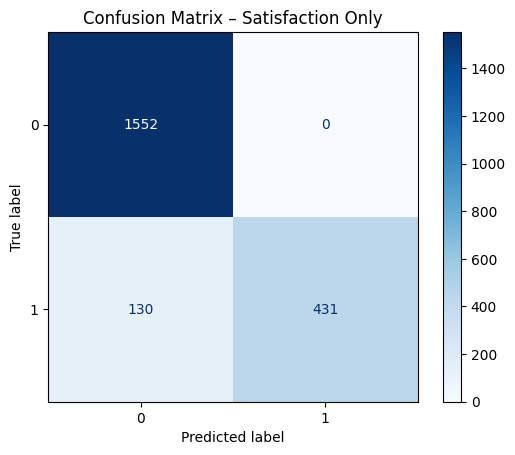

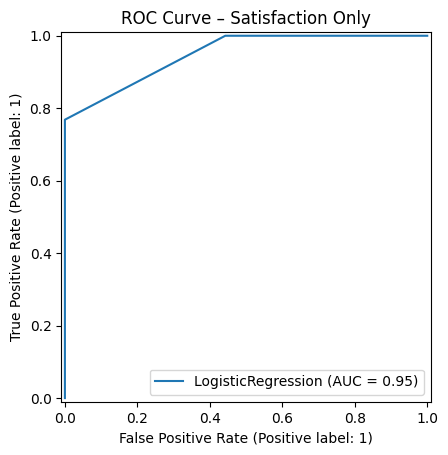

In [82]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, RocCurveDisplay, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

y_pred_s = logreg_s.predict(X_test_s)
y_proba_s = logreg_s.predict_proba(X_test_s)[:, 1]

# Classification metrics
print("📊 Classification Report – Satisfaction Only Model:")
print(classification_report(y_test_s, y_pred_s))
print("ROC-AUC Score:", roc_auc_score(y_test_s, y_proba_s))

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(logreg_s, X_test_s, y_test_s, cmap="Blues")
plt.title("Confusion Matrix – Satisfaction Only")
plt.show()

# ROC Curve
RocCurveDisplay.from_estimator(logreg_s, X_test_s, y_test_s)
plt.title("ROC Curve – Satisfaction Only")
plt.show()


Business implication: This confirms satisfaction score is a high-signal, low-complexity churn predictor. It can be monitored in real time to trigger retention actions without waiting for complex model outputs.

Limitations
While the recall (77%) is higher than many logistic regression runs, satisfaction-only models can’t account for churn unrelated to customer experience sentiment.

To maximize recall, this feature should be integrated into a multi-factor churn model rather than used in isolation.

#hyper parameter tune model with satisfaction score

In [83]:
#Step 1: Prepare Data (Only Satisfaction Score)
from sklearn.model_selection import train_test_split

# Features and target
X_satis = df_with_city[["satisfaction_score"]]
y_satis = df_with_city["churn_label"]

# Train-test split
X_train_satis, X_test_satis, y_train_satis, y_test_satis = train_test_split(
    X_satis, y_satis, test_size=0.2, stratify=y_satis, random_state=42
)


In [84]:
#Step 2: Feature Scaling
from sklearn.preprocessing import StandardScaler

scaler_satis = StandardScaler()

X_train_satis_scaled = scaler_satis.fit_transform(X_train_satis)
X_test_satis_scaled = scaler_satis.transform(X_test_satis)


In [86]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Define the model
logreg_satis = LogisticRegression(max_iter=1000, random_state=42)

# Define parameter grid
param_grid_satis = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10],
    'solver': ['liblinear']  # Supports both L1 and L2 penalties
}

# Set up GridSearchCV
grid_logreg_satis = GridSearchCV(
    estimator=logreg_satis,
    param_grid=param_grid_satis,
    scoring='accuracy',
    cv=5,
    n_jobs=-1,
    verbose=1
)

# Fit model
grid_logreg_satis.fit(X_train_satis_scaled, y_train_satis)

# Display best parameters and score
print("🔍 Best Parameters:", grid_logreg_satis.best_params_)
print("✅ Best Cross-Validated Accuracy:", grid_logreg_satis.best_score_)


Fitting 5 folds for each of 8 candidates, totalling 40 fits
🔍 Best Parameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}
✅ Best Cross-Validated Accuracy: 0.9396519469630465


📊 Classification Report – Tuned Satisfaction-Only Model:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      1035
           1       1.00      0.76      0.86       374

    accuracy                           0.94      1409
   macro avg       0.96      0.88      0.91      1409
weighted avg       0.94      0.94      0.93      1409

ROC-AUC Score: 0.9474631222713065


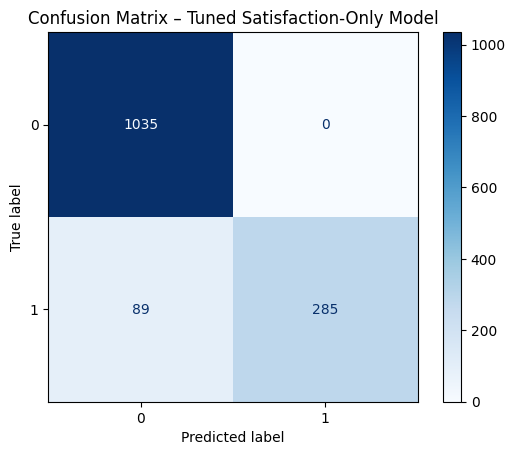

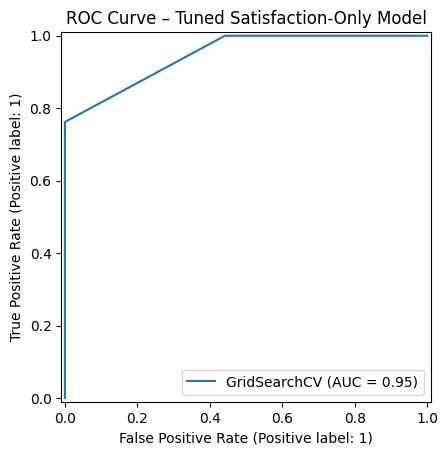

In [87]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay, roc_auc_score

# Predict on test set
y_pred_satis_tuned = grid_logreg_satis.predict(X_test_satis_scaled)
y_proba_satis_tuned = grid_logreg_satis.predict_proba(X_test_satis_scaled)[:, 1]

# Classification report
print("📊 Classification Report – Tuned Satisfaction-Only Model:")
print(classification_report(y_test_satis, y_pred_satis_tuned))

# ROC AUC score
print("ROC-AUC Score:", roc_auc_score(y_test_satis, y_proba_satis_tuned))

# Confusion Matrix
ConfusionMatrixDisplay.from_estimator(grid_logreg_satis, X_test_satis_scaled, y_test_satis, cmap="Blues")
plt.title("Confusion Matrix – Tuned Satisfaction-Only Model")
plt.show()

# ROC Curve
RocCurveDisplay.from_estimator(grid_logreg_satis, X_test_satis_scaled, y_test_satis)
plt.title("ROC Curve – Tuned Satisfaction-Only Model")
plt.show()


#END FOR NOW